<table class="table table-bordered">
    <tr>
        <th style="width:250px"><img src='https://www.np.edu.sg/PublishingImages/Pages/default/odp/ICT.jpg' style="width: 100%; height: 125px; "></th>
        <th style="text-align:center;"><h1>Data Wrangling</h1><h2>Assignment 2 </h2><h3>Diploma in Data Science</h3></th>
    </tr>
</table>

In [1]:
# import the packages
import os

# Basic packages
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats # Q-Q Plot

# train_test_split
from sklearn.model_selection import train_test_split

# Missing value imputation
from feature_engine.imputation import MeanMedianImputer

# Outlier Handling
from feature_engine.outliers import Winsorizer

# Categorical encoding
from feature_engine.encoding import OneHotEncoder
from feature_engine.encoding import OrdinalEncoder
from feature_engine.encoding import MeanEncoder
from category_encoders import LeaveOneOutEncoder

# Variable Discretisation
from feature_engine.discretisation import EqualWidthDiscretiser
from feature_engine.discretisation import EqualFrequencyDiscretiser

# Feature Scaling
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler

# Polynomial Expansion
from sklearn.preprocessing import PolynomialFeatures

# PCA
from sklearn.decomposition import PCA

# ML model
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error

# options
pd.set_option('display.max_columns', 500)

# Table Of Contents

[1 Load and Explore the Data](#1)

[2 Data Wrangling on Multiple Tables](#2)
- [2.1 Drivers](#2.1)
- [2.2 Constructors](#2.2)
- [2.3 Races](#2.3)
- [2.4 Results](#2.4)
- [2.5 Qualifying](#2.5)
- [2.6 Results](#2.6)
- [2.7 Merging](#2.7)
- [2.8 Exploring the Final Dataset](#2.8)
    - [2.8.1 Quantifying Missing Data](#2.8.1)
    - [2.8.2 Diagnostic Plots](#2.8.2)
    - [2.8.1 Cardinality of Categorical Columns](#2.8.3)
  
[3 Data Cleansing and Transformation](#3)
- [3.1 Outlier Handling](#3.1)
    - [3.1.1 Functions](#3.1.1)
    - [3.1.2 Columns with Outliers](#3.1.2)
    - [3.1.3 Investigating Outliers in each column](#3.1.3)
    - [3.1.4 Outlier Handling for each column](#3.1.4)
- [Train Test Split](#traintestsplit)
- [3.2 Missing Value Imputation](#3.2)
    - [3.2.1 Identifying columns with missing values](#3.2.1)
    - [3.2.2 Dropping rows of columns with low missing values (< 5%)](#3.2.2)
    - [3.2.3 Missing values in milliseconds column](#3.2.3)
- [3.3 Categorical Encoding](#3.3)
    - [3.3.1 Cardinality of Categorical columns](#3.3.1)
    - [3.3.2 Leave One Out Encoding](#3.3.2)
    - [3.3.3 Frequency Encoding](#3.3.3)
    - [3.3.4 Model Performance after Encoding](#3.3.4)
    - [3.3.5 EXTRA - Target Mean Encoding](#3.3.5)
    - [3.3.6 EXTRA - One Hot Encoding](#3.3.6)
- [3.4 Numerical Transformation](#3.5)
    - [3.4.1 Distribution of Numerical Variables](#3.4.1)
    - [3.4.2 Comparing Transformations](#3.4.2)
    - [3.4.3 Transforming columns](#3.4.3)
    - [3.4.4 Evaluating Model Performance after transformation](#3.4.4)
- [3.5 Variable Discretisation](#3.5)
    - [3.5.1 Equal Width Discretisation](#3.5.1)
    - [3.5.2 Equal Frequency Discretisation](#3.5.2)
    - [3.5.3 Compare model performance between Equal Width and Equal Frequency](#3.5.3)
- [3.6 Feature Engineering](#3.6)
    - [3.6.1 Average Lap Time](#3.6.1)
    - [3.6.2 Driver Experience](#3.6.2)
    - [3.6.3 Evaluating Model performance after Feature Engineering](#3.6.3)
- [3.7 Feature Scaling](#3.7)
    - [3.7.1 Standardisation](#3.7.1)
    - [3.7.2 MinMaxScaling](#3.7.2)
    - [3.7.3 Robust-Scaling](#3.7.3)
    - [3.7.4 Evaluating Model performance after scaling](#3.7.4)
- [3.8 Polynomial Expansion](#3.8)
    - [3.8.1 Identifying Features to expand](#3.8.1)
    - [3.8.2 Understanding relationship of chosen columns with target](#3.8.2)
    - [3.8.3 Expanding Features](#3.8.3)
    - [3.8.4 Identify and drop polynomial expanded columns with low correlation to target](#3.8.4)
    - [3.8.5 Merging expanded columns with original dataframe](#3.8.5)
    - [3.8.6 Evaluating model performance after Polynomial Expansion](#3.8.6)
- [3.9 PCA](#3.9)
    - [3.9.1 Instantiating PCA](#3.9.1)
    - [3.9.2 Identifying optimal number of components](#3.9.2)
    - [3.9.3 Instantiating PCA with number of components and Evaluating Model Performance](#3.9.3)

[4 Machine Learning Modelling](#4)
- [4.1 Final Dataframe](#4.1)
- [4.2 Naive Baseline](#4.2)
- [4.3 Linear Regression](#4.3)
- [4.4 L2 Regularization](#4.4)

[5 Report](#5)

# 1 Load and Explore the Data

## Loading Data

In [2]:
# Circuits
circuits = pd.read_csv("./f1db_csv_mod/circuits_mod.csv")

# Constructor Results
c_results = pd.read_csv("./f1db_csv_mod/constructor_results_mod.csv")

# Constructor Standings
c_standings = pd.read_csv("./f1db_csv_mod/constructor_standings_mod.csv")

# Constructor
constructor = pd.read_csv("./f1db_csv_mod/constructors_mod.csv")                          

# Driver Standings
d_standings = pd.read_csv("./f1db_csv_mod/driver_standings_mod.csv")
                          
# Driver
driver = pd.read_csv("./f1db_csv_mod/drivers_mod.csv")

# Lap Times
lap_times = pd.read_csv("./f1db_csv_mod/lap_times_mod.csv")

# Pit Stops                          
pit_stops = pd.read_csv("./f1db_csv_mod/pit_stops_mod.csv")
                          
# Qualifying
quali = pd.read_csv("./f1db_csv_mod/qualifying_mod.csv")
                                                    
# Races
races = pd.read_csv("./f1db_csv_mod/races_mod.csv")

# Results
results = pd.read_csv("./f1db_csv_mod/results_mod.csv")

# Seasons
seasons = pd.read_csv("./f1db_csv_mod/seasons_mod.csv")

# Status
status = pd.read_csv("./f1db_csv_mod/status_mod.csv")

## Circuits Table

In [3]:
circuits.sample(5)

,circuitId,circuitRef,name,location,country,lat,lng,alt,url
10,11,hungaroring,Hungaroring,Budapest,Hungary,47.57890,19.2486,264,http://en.wikipedia.org/wiki/Hungaroring
1,2,sepang,Sepang International Circuit,Kuala Lumpur,Malaysia,2.76083,101.7380,18,http://en.wikipedia.org/wiki/Sepang_Internatio...
71,72,port_imperial,Port Imperial Street Circuit,New Jersey,USA,40.77690,-74.0111,4,http://en.wikipedia.org/wiki/Port_Imperial_Str...
31,32,rodriguez,Autódromo Hermanos Rodríguez,Mexico City,Mexico,19.40420,-99.0907,2227,http://en.wikipedia.org/wiki/Aut%C3%B3dromo_He...
64,65,pescara,Pescara Circuit,Pescara,Italy,42.47500,14.1508,129,http://en.wikipedia.org/wiki/Pescara_Circuit


In [4]:
circuits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79 entries, 0 to 78
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   circuitId   79 non-null     int64  
 1   circuitRef  79 non-null     object 
 2   name        79 non-null     object 
 3   location    79 non-null     object 
 4   country     79 non-null     object 
 5   lat         79 non-null     float64
 6   lng         79 non-null     float64
 7   alt         79 non-null     object 
 8   url         79 non-null     object 
dtypes: float64(2), int64(1), object(6)
memory usage: 5.7+ KB


In [5]:
circuits.describe(include="all")

,circuitId,circuitRef,name,location,country,lat,lng,alt,url
count,79.000000,79,79,79,79,79.000000,79.000000,79,79
unique,NaN,79,79,76,36,NaN,NaN,67,79
top,NaN,albert_park,Albert Park Grand Prix Circuit,Barcelona,USA,NaN,NaN,18,http://en.wikipedia.org/wiki/Melbourne_Grand_P...
freq,NaN,1,1,2,11,NaN,NaN,3,1
mean,40.000000,NaN,NaN,NaN,NaN,33.517913,3.097033,NaN,NaN
std,22.949219,NaN,NaN,NaN,NaN,22.626026,64.963691,NaN,NaN
min,1.000000,NaN,NaN,NaN,NaN,-37.849700,-118.189000,NaN,NaN
25%,20.500000,NaN,NaN,NaN,NaN,32.058150,-9.298615,NaN,NaN
50%,40.000000,NaN,NaN,NaN,NaN,40.951700,4.326940,NaN,NaN
75%,59.500000,NaN,NaN,NaN,NaN,47.081400,23.561100,NaN,NaN


## Constructor Results Table

In [6]:
c_results.sample(5)

,constructorResultsId,raceId,constructorId,points,status
4343,4344,374,33,0.0,\N
11242,15740,999,131,43.0,\N
203,204,37,8,0.0,\N
11462,15962,1021,6,27.0,\N
11045,15543,979,1,9.0,\N


In [7]:
c_results.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11950 entries, 0 to 11949
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   constructorResultsId  11950 non-null  int64  
 1   raceId                11950 non-null  int64  
 2   constructorId         11950 non-null  int64  
 3   points                11950 non-null  float64
 4   status                11950 non-null  object 
dtypes: float64(1), int64(3), object(1)
memory usage: 466.9+ KB


In [8]:
# Only 17 for the 11950 rows have statuses
c_results.describe(include="all")

,constructorResultsId,raceId,constructorId,points,status
count,11950.000000,11950.000000,11950.000000,11950.000000,11950
unique,NaN,NaN,NaN,NaN,2
top,NaN,NaN,NaN,NaN,\N
freq,NaN,NaN,NaN,NaN,11933
mean,7951.200753,495.265690,43.215230,3.661757,NaN
std,5452.516726,290.480497,56.084031,7.203368,NaN
min,1.000000,1.000000,1.000000,0.000000,NaN
25%,2988.250000,274.000000,6.000000,0.000000,NaN
50%,5975.500000,467.000000,22.000000,0.000000,NaN
75%,13428.750000,694.000000,51.000000,4.000000,NaN


## Constructor Standings Table

In [9]:
c_standings.sample(5)

,constructorStandingsId,raceId,constructorId,points,position,positionText,wins
940,6012,111,15,8.0,6,6,0
2604,25584,262,3,25.0,3,3,1
6299,11351,501,34,18.0,2,2,1
9803,20447,705,172,54.0,1,1,6
6338,11390,503,54,0.0,12,12,0


In [10]:
c_standings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12716 entries, 0 to 12715
Data columns (total 7 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   constructorStandingsId  12716 non-null  int64  
 1   raceId                  12716 non-null  int64  
 2   constructorId           12716 non-null  int64  
 3   points                  12716 non-null  float64
 4   position                12716 non-null  int64  
 5   positionText            12716 non-null  object 
 6   wins                    12716 non-null  int64  
dtypes: float64(1), int64(5), object(1)
memory usage: 695.5+ KB


In [11]:
c_standings.describe(include="all")

,constructorStandingsId,raceId,constructorId,points,position,positionText,wins
count,12716.000000,12716.000000,12716.000000,12716.000000,12716.000000,12716,12716.000000
unique,NaN,NaN,NaN,NaN,NaN,24,NaN
top,NaN,NaN,NaN,NaN,NaN,1,NaN
freq,NaN,NaN,NaN,NaN,NaN,993,NaN
mean,15990.742529,505.302218,47.262504,32.244299,7.315901,NaN,0.671044
std,8748.089506,285.123256,58.451136,73.503280,4.402105,NaN,1.788436
min,1.000000,1.000000,1.000000,0.000000,1.000000,NaN,0.000000
25%,8449.750000,291.000000,6.000000,0.000000,4.000000,NaN,0.000000
50%,19547.500000,487.000000,25.000000,6.000000,7.000000,NaN,0.000000
75%,24168.250000,702.000000,57.000000,29.125000,10.000000,NaN,0.000000


## Constructors Table

In [12]:
constructor.sample(5)

,constructorId,constructorRef,name,nationality,url
40,41,leyton,Leyton House,British,http://en.wikipedia.org/wiki/Leyton_House
142,144,veritas,Veritas,German,http://en.wikipedia.org/wiki/Veritas_(construc...
63,65,martini,Martini,French,http://en.wikipedia.org/wiki/Martini_(cars)
124,126,alta,Alta,British,http://en.wikipedia.org/wiki/Alta_auto_racing_...
18,19,jaguar,Jaguar,British,http://en.wikipedia.org/wiki/Jaguar_Racing


In [13]:
constructor.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 211 entries, 0 to 210
Data columns (total 5 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   constructorId   211 non-null    int64 
 1   constructorRef  211 non-null    object
 2   name            211 non-null    object
 3   nationality     211 non-null    object
 4   url             211 non-null    object
dtypes: int64(1), object(4)
memory usage: 8.4+ KB


In [14]:
constructor.describe(include="all")

,constructorId,constructorRef,name,nationality,url
count,211.000000,211,211,211,211
unique,NaN,211,211,24,174
top,NaN,mclaren,McLaren,British,http://en.wikipedia.org/wiki/Cooper_Car_Company
freq,NaN,1,1,86,11
mean,107.037915,NaN,NaN,NaN,NaN
std,61.653629,NaN,NaN,NaN,NaN
min,1.000000,NaN,NaN,NaN,NaN
25%,54.500000,NaN,NaN,NaN,NaN
50%,107.000000,NaN,NaN,NaN,NaN
75%,159.500000,NaN,NaN,NaN,NaN


## Driver Standings Table

In [15]:
d_standings.sample(5)

,driverStandingsId,raceId,driverId,points,position,positionText,wins
12234,22762,483,216,0,28,28,0
9140,19374,384,166,0,23,23,0
30835,67595,950,1,39,2,2,0
32139,69122,1009,840,6,18,18,0
10107,20370,418,102,55,4,4,2


In [16]:
d_standings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33394 entries, 0 to 33393
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   driverStandingsId  33394 non-null  int64 
 1   raceId             33394 non-null  int64 
 2   driverId           33394 non-null  int64 
 3   points             33389 non-null  object
 4   position           33394 non-null  int64 
 5   positionText       33394 non-null  object
 6   wins               33394 non-null  int64 
dtypes: int64(5), object(2)
memory usage: 1.8+ MB


In [17]:
d_standings.describe(include="all")

,driverStandingsId,raceId,driverId,points,position,positionText,wins
count,33394.000000,33394.000000,33394.000000,33389,33394.000000,33394,33394.000000
unique,NaN,NaN,NaN,403,NaN,110,NaN
top,NaN,NaN,NaN,0,NaN,1,NaN
freq,NaN,NaN,NaN,16292,NaN,1057,NaN
mean,41053.589327,562.539977,298.800114,NaN,20.077289,NaN,0.265407
std,21717.997691,276.659109,259.756294,NaN,16.499785,NaN,0.974147
min,1.000000,1.000000,1.000000,NaN,1.000000,NaN,0.000000
25%,19061.250000,342.000000,84.000000,NaN,8.000000,NaN,0.000000
50%,48903.500000,587.000000,212.000000,NaN,16.000000,NaN,0.000000
75%,57992.750000,789.000000,484.000000,NaN,26.000000,NaN,0.000000


## Drivers Table

In [18]:
driver.sample(5)

,driverId,driverRef,number,code,forename,surname,dob,nationality,url
226,227,needell,\N,\N,Tiff,Needell,1951-10-29,British,http://en.wikipedia.org/wiki/Tiff_Needell
334,335,williamson,\N,\N,Roger,Williamson,1948-02-02,British,http://en.wikipedia.org/wiki/Roger_Williamson
547,547,gould,\N,\N,Horace,Gould,1918-09-20,British,http://en.wikipedia.org/wiki/Horace_Gould
374,375,scarfiotti,\N,\N,Ludovico,Scarfiotti,1933-10-18,Italian,http://en.wikipedia.org/wiki/Ludovico_Scarfiotti
422,423,mitter,\N,\N,Gerhard,Mitter,1935-08-30,German,http://en.wikipedia.org/wiki/Gerhard_Mitter


In [19]:
driver.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 854 entries, 0 to 853
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   driverId     854 non-null    int64 
 1   driverRef    854 non-null    object
 2   number       854 non-null    object
 3   code         854 non-null    object
 4   forename     854 non-null    object
 5   surname      854 non-null    object
 6   dob          854 non-null    object
 7   nationality  854 non-null    object
 8   url          854 non-null    object
dtypes: int64(1), object(8)
memory usage: 60.2+ KB


In [20]:
driver.describe(include="all")

,driverId,driverRef,number,code,forename,surname,dob,nationality,url
count,854.000000,854,854,854,854,854,854,854,854
unique,NaN,854,43,92,474,795,836,42,854
top,NaN,hamilton,\N,\N,John,Taylor,1918-10-06,British,http://en.wikipedia.org/wiki/Lewis_Hamilton
freq,NaN,1,804,757,14,5,2,165,1
mean,427.553864,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,246.761270,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,214.250000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,427.500000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,640.750000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Lap Times Table

In [21]:
lap_times.sample(5)

,raceId,driverId,lap,position,time,milliseconds
220429,131,44,26,12,1:19.574,79574
362333,339,22,37,12,1:40.738,100738
329589,23,5,51,13,1:27.132,87132
478566,1036,832,57,7,1:23.086,83086
217357,129,30,58,2,1:09.511,69511


In [22]:
lap_times.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 514592 entries, 0 to 514591
Data columns (total 6 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   raceId        514592 non-null  int64 
 1   driverId      514592 non-null  int64 
 2   lap           514592 non-null  int64 
 3   position      514592 non-null  int64 
 4   time          514592 non-null  object
 5   milliseconds  514592 non-null  int64 
dtypes: int64(5), object(1)
memory usage: 23.6+ MB


In [23]:
lap_times.describe(include="all")

,raceId,driverId,lap,position,time,milliseconds
count,514592.000000,514592.000000,514592.000000,514592.000000,514592,5.145920e+05
unique,NaN,NaN,NaN,NaN,73313,NaN
top,NaN,NaN,NaN,NaN,1:21.571,NaN
freq,NaN,NaN,NaN,NaN,39,NaN
mean,526.829587,265.752592,29.962442,9.650134,NaN,9.560792e+04
std,415.885396,364.650842,18.419473,5.546670,NaN,7.388613e+04
min,1.000000,1.000000,1.000000,1.000000,NaN,5.540400e+04
25%,122.000000,15.000000,14.000000,5.000000,NaN,8.204800e+04
50%,346.000000,35.000000,29.000000,9.000000,NaN,9.065500e+04
75%,951.000000,815.000000,44.000000,14.000000,NaN,1.023210e+05


## Pit Stops Table

In [24]:
pit_stops.sample(5)

,raceId,driverId,stop,lap,time,duration,milliseconds
8186,1055,841,1,8,15:15:06,54.673,54673
1487,867,18,1,10,14:21:23,20.246,20246
8113,1053,817,2,33,15:59:25,26:14.827,1574827
3133,902,154,2,28,18:52:44,25.032,25032
5425,965,8,3,38,15:11:09,25.384,25384


In [25]:
pit_stops.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8828 entries, 0 to 8827
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   raceId        8828 non-null   int64 
 1   driverId      8828 non-null   int64 
 2   stop          8828 non-null   int64 
 3   lap           8828 non-null   int64 
 4   time          8828 non-null   object
 5   duration      8828 non-null   object
 6   milliseconds  8828 non-null   int64 
dtypes: int64(5), object(2)
memory usage: 482.9+ KB


In [26]:
pit_stops.describe(include="all")

,raceId,driverId,stop,lap,time,duration,milliseconds
count,8828.000000,8828.000000,8828.000000,8828.000000,8828,8828,8.828000e+03
unique,NaN,NaN,NaN,NaN,6741,6303,NaN
top,NaN,NaN,NaN,NaN,14:22:38,22.745,NaN
freq,NaN,NaN,NaN,NaN,6,7,NaN
mean,944.363049,493.641482,1.768237,25.118034,NaN,NaN,6.782700e+04
std,69.248219,394.313670,0.923481,14.503790,NaN,NaN,2.488059e+05
min,841.000000,1.000000,1.000000,1.000000,NaN,NaN,1.289700e+04
25%,882.000000,17.000000,1.000000,13.000000,NaN,NaN,2.190300e+04
50%,942.000000,814.000000,2.000000,25.000000,NaN,NaN,2.352500e+04
75%,1002.000000,828.000000,2.000000,35.000000,NaN,NaN,2.613200e+04


## Qualifying Table

In [27]:
quali.sample(5)

,qualifyId,raceId,driverId,constructorId,number,position,q1,q2,q3
8337,8361,1030,844,6,16,4,1:36.478,1:35.543,1:35.219
2821,2823,266,105,18,24,20,1:22.379,\N,\N
8952,8993,1064,853,210,9,20,1:11.875,\N,\N
2194,2196,240,89,29,10,21,1:25.225,\N,\N
5203,5206,870,20,9,1,3,1:22.948,1:21.407,1:21.416


In [28]:
quali.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9135 entries, 0 to 9134
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   qualifyId      9135 non-null   int64 
 1   raceId         9135 non-null   int64 
 2   driverId       9135 non-null   int64 
 3   constructorId  9135 non-null   int64 
 4   number         9135 non-null   int64 
 5   position       9135 non-null   int64 
 6   q1             9127 non-null   object
 7   q2             9001 non-null   object
 8   q3             8880 non-null   object
dtypes: int64(6), object(3)
memory usage: 642.4+ KB


In [29]:
quali.filter(regex="q").sample(10)

,qualifyId,q1,q2,q3
4116,4118,1:39.902,\N,\N
6908,6931,1:16.169,1:15.500,1:15.537
6532,6555,1:46.600,1:46.328,\N
1450,1451,1:38.039,\N,\N
5511,5514,1:33.762,1:33.335,1:33.235
2804,2806,1:20.205,\N,\N
6783,6806,1:15.710,1:15.385,\N
3435,3437,1:22.593,1:22.207,\N
7230,7253,1:13.640,1:14.106,\N
5459,5462,1:49.519,\N,\N


## Races Table

In [30]:
races.sample(5)

,raceId,round,circuitId,name,date,time,url
696,697,8,46,United States Grand Prix,10/2/1966,\N,http://en.wikipedia.org/wiki/1966_United_State...
369,370,15,22,Japanese Grand Prix,10/22/1989,\N,http://en.wikipedia.org/wiki/1989_Japanese_Gra...
944,957,10,9,British Grand Prix,7/10/2016,12:00:00,https://en.wikipedia.org/wiki/2016_British_Gra...
1047,1062,11,11,Hungarian Grand Prix,NaN,13:00:00,http://en.wikipedia.org/wiki/2021_Hungarian_Gr...
303,304,16,29,Australian Grand Prix,11/8/1992,\N,http://en.wikipedia.org/wiki/1992_Australian_G...


In [31]:
races.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1080 entries, 0 to 1079
Data columns (total 7 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   raceId     1080 non-null   int64 
 1   round      1080 non-null   int64 
 2   circuitId  1080 non-null   int64 
 3   name       1080 non-null   object
 4   date       1070 non-null   object
 5   time       1080 non-null   object
 6   url        1080 non-null   object
dtypes: int64(3), object(4)
memory usage: 59.2+ KB


In [32]:
races[races["date"].isna()]

,raceId,round,circuitId,name,date,time,url
26,27,10,10,German Grand Prix,NaN,12:00:00,http://en.wikipedia.org/wiki/2008_German_Grand...
68,69,17,22,Japanese Grand Prix,NaN,14:00:00,http://en.wikipedia.org/wiki/2006_Japanese_Gra...
104,105,16,17,Chinese Grand Prix,NaN,\N,http://en.wikipedia.org/wiki/2004_Chinese_Gran...
897,900,1,1,Australian Grand Prix,NaN,6:00:00,https://en.wikipedia.org/wiki/2014_Australian_...
914,917,18,18,Brazilian Grand Prix,NaN,16:00:00,http://en.wikipedia.org/wiki/2014_Brazilian_Gr...
935,948,1,1,Australian Grand Prix,NaN,5:00:00,https://en.wikipedia.org/wiki/2016_Australian_...
948,961,14,14,Italian Grand Prix,NaN,12:00:00,https://en.wikipedia.org/wiki/2016_Italian_Gra...
978,991,3,17,Chinese Grand Prix,NaN,6:10:00,https://en.wikipedia.org/wiki/2018_Chinese_Gra...
1015,1028,19,69,United States Grand Prix,NaN,19:10:00,https://en.wikipedia.org/wiki/2019_United_Stat...
1047,1062,11,11,Hungarian Grand Prix,NaN,13:00:00,http://en.wikipedia.org/wiki/2021_Hungarian_Gr...


In [33]:
races.date.unique()

array(['3/29/2009', '4/5/12009', '4/19/2009', ..., '10/30/2022',
       '11/13/2022', '11/20/2022'], dtype=object)

## Results Table

In [34]:
results.head(30)

,resultId,raceId,driverId,constructorId,number,grid,position,positionText,positionOrder,points,laps,time,milliseconds,fastestLap,rank,fastestLapTime,fastestLapSpeed,statusId
0,1,18,1,1,22,1,1,1,1,10.0,58,34:50.6,5690616,39,2,01:27.5,218.3,1
1,2,18,2,2,3,5,2,2,2,8.0,58,5.478,5696094,41,3,01:27.7,217.586,1
2,3,18,3,3,7,7,3,3,3,6.0,58,8.163,5698779,41,5,01:28.1,216.719,1
3,4,18,4,4,5,11,4,4,4,5.0,58,17.181,5707797,58,7,01:28.6,215.464,1
4,5,18,5,1,23,3,5,5,5,4.0,58,18.014,5708630,43,1,01:27.4,218.385,1
5,6,18,6,3,8,13,6,6,6,3.0,57,\N,\N,50,14,01:29.6,212.974,11
6,7,18,7,5,14,17,7,7,7,2.0,55,\N,\N,22,12,01:29.5,213.224,5
7,8,18,8,6,1,15,8,8,8,1.0,53,\N,\N,20,4,01:27.9,217.18,5
8,9,18,9,2,4,2,\N,R,9,0.0,47,\N,\N,15,9,01:28.8,215.1,4
9,10,18,10,7,12,18,\N,R,10,0.0,43,\N,\N,23,13,01:29.6,213.166,3


In [35]:
results.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25399 entries, 0 to 25398
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   resultId         25399 non-null  int64  
 1   raceId           25399 non-null  int64  
 2   driverId         25399 non-null  int64  
 3   constructorId    25399 non-null  int64  
 4   number           25399 non-null  object 
 5   grid             25399 non-null  int64  
 6   position         25399 non-null  object 
 7   positionText     25399 non-null  object 
 8   positionOrder    25399 non-null  int64  
 9   points           25399 non-null  float64
 10  laps             25399 non-null  int64  
 11  time             25399 non-null  object 
 12  milliseconds     25399 non-null  object 
 13  fastestLap       25399 non-null  object 
 14  rank             25399 non-null  object 
 15  fastestLapTime   25399 non-null  object 
 16  fastestLapSpeed  25399 non-null  object 
 17  statusId    

In [36]:
results.describe(include="all")

,resultId,raceId,driverId,constructorId,number,grid,position,positionText,positionOrder,points,laps,time,milliseconds,fastestLap,rank,fastestLapTime,fastestLapSpeed,statusId
count,25399.000000,25399.000000,25399.000000,25399.000000,25399,25399.000000,25399,25399,25399.000000,25399.000000,25399.000000,25399,25399,25399,25399,25399,25399,25399.000000
unique,NaN,NaN,NaN,NaN,130,NaN,35,40,NaN,NaN,NaN,6527,6772,80,26,590,6557,NaN
top,NaN,NaN,NaN,NaN,8,NaN,\N,R,NaN,NaN,NaN,\N,\N,\N,\N,\N,\N,NaN
freq,NaN,NaN,NaN,NaN,993,NaN,10786,8742,NaN,NaN,NaN,18590,18591,18446,18249,18446,18446,NaN
mean,12700.761999,521.818576,253.809914,47.809993,NaN,11.198000,NaN,NaN,13.186976,1.822082,45.849443,NaN,NaN,NaN,NaN,NaN,NaN,17.666522
std,7333.289896,292.937855,261.237589,58.784504,NaN,7.264033,NaN,NaN,8.932839,4.075745,29.962512,NaN,NaN,NaN,NaN,NaN,NaN,26.075967
min,1.000000,1.000000,1.000000,1.000000,NaN,0.000000,NaN,NaN,1.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,1.000000
25%,6350.500000,289.000000,56.000000,6.000000,NaN,5.000000,NaN,NaN,7.000000,0.000000,21.000000,NaN,NaN,NaN,NaN,NaN,NaN,1.000000
50%,12700.000000,506.000000,160.000000,25.000000,NaN,11.000000,NaN,NaN,13.000000,0.000000,52.000000,NaN,NaN,NaN,NaN,NaN,NaN,11.000000
75%,19049.500000,768.000000,353.500000,58.000000,NaN,17.000000,NaN,NaN,19.000000,2.000000,66.000000,NaN,NaN,NaN,NaN,NaN,NaN,14.000000


In [37]:
for i in results.columns:
    if r"\N" in results[i].values:
        print(i)

number
position
time
milliseconds
fastestLap
rank
fastestLapTime
fastestLapSpeed


C:\Users\Tristan Sim\AppData\Local\Temp\ipykernel_69464\1264087517.py:2: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if r"\N" in results[i].values:


In [38]:
results['positionText'].unique()

array(['1', '2', '3', '4', '5', '6', '7', '8', 'R', 'D', '9', '10', '11',
       '12', '13', '14', '15', '16', '17', '18', '19', '99', '20', '21',
       'N', 'W', 'F', 'E', '22', '23', '24', '25', '26', '27', '28', '29',
       '30', '31', '32', '33'], dtype=object)

In [39]:
results[results['positionText'].str.isdigit() == False].sample(20)

,resultId,raceId,driverId,constructorId,number,grid,position,positionText,positionOrder,points,laps,time,milliseconds,fastestLap,rank,fastestLapTime,fastestLapSpeed,statusId
17242,17243,711,385,6,11,9,\N,R,14,0.0,12,\N,\N,\N,\N,\N,\N,5
20936,20939,847,2,4,9,9,\N,R,20,0.0,55,\N,\N,55,20,01:25.1,184.408,3
19714,19715,819,475,151,32,10,\N,R,22,0.0,0,\N,\N,\N,\N,\N,\N,5
2752,2753,149,44,16,9,13,\N,R,21,0.0,23,\N,\N,\N,\N,\N,\N,10
15044,15045,608,333,34,21,17,\N,R,21,0.0,17,\N,\N,\N,\N,\N,\N,36
10124,10125,431,178,26,33,25,\N,R,22,0.0,6,\N,\N,\N,\N,\N,\N,5
14768,14769,598,233,37,9,0,\N,F,27,0.0,0,\N,\N,\N,\N,\N,\N,81
18732,18733,776,608,6,14,4,\N,R,11,0.0,75,\N,\N,\N,\N,\N,\N,36
4715,4716,239,35,3,6,1,\N,R,16,0.0,36,\N,\N,\N,\N,\N,\N,36
11177,11178,470,181,54,9,12,\N,D,6,0.0,54,\N,\N,\N,\N,\N,\N,2


## Seasons Table

In [40]:
seasons.sample(5)

,year,url
11,1998,https://en.wikipedia.org/wiki/1998_Formula_One...
52,1958,https://en.wikipedia.org/wiki/1958_Formula_One...
14,1995,https://en.wikipedia.org/wiki/1995_Formula_One...
43,1967,https://en.wikipedia.org/wiki/1967_Formula_One...
70,2020,https://en.wikipedia.org/wiki/2020_Formula_One...


## Status

In [41]:
status.sample(5)

,statusId,status
49,50,+17 Laps
105,106,Fuel pipe
56,129,Engine misfire
71,72,Launch control
7,8,Clutch


# 2 Data Wrangling on multiple tables 

## 2.1 Drivers Table

In [42]:
# Concatenating forename and surname into driverName
driver["driverName"] = driver["forename"] + " " + driver["surname"]

# Converting dob to date dtype
driver["dob"] = pd.to_datetime(driver["dob"])

# Extracting year from dob
driver["yob"] = driver["dob"].dt.year

# Subsetting specific columns
driver_subset = driver[["driverId", "driverName", "yob", "nationality"]]

driver_subset.head()

,driverId,driverName,yob,nationality
0,1,Lewis Hamilton,1985,British
1,2,Nick Heidfeld,1977,German
2,3,Nico Rosberg,1985,German
3,4,Fernando Alonso,1981,Spanish
4,5,Heikki Kovalainen,1981,Finnish


## 2.2 Constructors Table

In [43]:
# Subsetting
constructor_subset = constructor[["constructorId", "name", "nationality"]]

constructor_subset.head()

,constructorId,name,nationality
0,1,McLaren,British
1,2,BMW Sauber,German
2,3,Williams,British
3,4,Renault,French
4,5,Toro Rosso,Italian


## 2.3 Races

In [44]:
### Fixing errors in date column (e.g. year is 12009)

race_dates = races["date"].str.split("/")   # To solve this, first split values into 3, month, date and year

for i in range(len(race_dates)):                      # Loop through every row in the dates column
    if race_dates[i] == race_dates[i]:                # Check that row is not NaN
        if len(race_dates[i][2]) == 5:                # If length of year is 5,
            race_dates[i][2] = race_dates[i][2][1:]   # Take every character after the first character
                
        race_dates[i] = "/".join(race_dates[i])       # Finally, rejoin the list
        
races["date"] = pd.to_datetime(pd.Series(race_dates)) # Converting date to datetime dtype

In [45]:
### Creating "season" column from year of date

races["season"] = races.date.dt.year

In [46]:
### Imputing missing values in season column with year inside url

# First get the years from the url column
url_year = [x[1][:4] for x in races["url"].str.split("wiki/")]

# Retrieve the indexes of missing dates
missing_index = races[races["date"].isna()].index

# Using those indexes, retrieve the specific url's
missing_years = [int(url_year[x]) for x in missing_index]

# Now apply these years to the missing values of the races df
for i, idx in enumerate(missing_index):
    races.at[idx, 'season'] = missing_years[i]
    
races.loc[missing_index]

,raceId,round,circuitId,name,date,time,url,season
26,27,10,10,German Grand Prix,NaT,12:00:00,http://en.wikipedia.org/wiki/2008_German_Grand...,2008.0
68,69,17,22,Japanese Grand Prix,NaT,14:00:00,http://en.wikipedia.org/wiki/2006_Japanese_Gra...,2006.0
104,105,16,17,Chinese Grand Prix,NaT,\N,http://en.wikipedia.org/wiki/2004_Chinese_Gran...,2004.0
897,900,1,1,Australian Grand Prix,NaT,6:00:00,https://en.wikipedia.org/wiki/2014_Australian_...,2014.0
914,917,18,18,Brazilian Grand Prix,NaT,16:00:00,http://en.wikipedia.org/wiki/2014_Brazilian_Gr...,2014.0
935,948,1,1,Australian Grand Prix,NaT,5:00:00,https://en.wikipedia.org/wiki/2016_Australian_...,2016.0
948,961,14,14,Italian Grand Prix,NaT,12:00:00,https://en.wikipedia.org/wiki/2016_Italian_Gra...,2016.0
978,991,3,17,Chinese Grand Prix,NaT,6:10:00,https://en.wikipedia.org/wiki/2018_Chinese_Gra...,2018.0
1015,1028,19,69,United States Grand Prix,NaT,19:10:00,https://en.wikipedia.org/wiki/2019_United_Stat...,2019.0
1047,1062,11,11,Hungarian Grand Prix,NaT,13:00:00,http://en.wikipedia.org/wiki/2021_Hungarian_Gr...,2021.0


In [47]:
### Creating daylight binary column to replace time

# Replacing "\N" in time with np.nan
races["time"] = races["time"].replace(r"\N" ,np.nan)

# Create an hour column by splitting time and getting the first element
races["hour"] = [int(x[0]) if x == x else x for x in races["time"].str.split(":")]

# create day and night binary column
# day (6am - 5pm) = 1, night (6pm - 5am) = 0
races["daylight"] = (np.where(races["hour"].between(6, 17), 1, 0)).astype(bool)

In [48]:
# Subsetting
races_subset = races[["raceId", "circuitId", "season", "daylight"]]
races_subset.head()

,raceId,circuitId,season,daylight
0,1,1,2009.0,True
1,2,2,2009.0,True
2,3,17,2009.0,True
3,4,3,2009.0,True
4,5,4,2009.0,True


## 2.4 Qualifying

In [49]:
# Replacing "\N" instances with np.nan
quali = quali.replace(r"\N", np.nan)

In [50]:
### Convert all quarters to milliseconds

# Function to convert time in mm:ss.ms string format to milliseconds
def time_to_milliseconds(time):
    if time == time:
        minutes, seconds_milliseconds = time.split(':')
        seconds, milliseconds = seconds_milliseconds.split('.')
        total_milliseconds = int(minutes) * 60000 + int(seconds) * 1000 + int(milliseconds)
        return total_milliseconds
    else:
        return time

# Applying function to new columns 
quali['q1_ms'] = quali['q1'].apply(time_to_milliseconds)
quali['q2_ms'] = quali['q2'].apply(time_to_milliseconds)
quali['q3_ms'] = quali['q3'].apply(time_to_milliseconds)

# Aggregating qualifying times to get the single, fastest qualifying time
quali["qualifying_time_ms"] = [min(x) for x in quali.filter(regex="ms").values]

In [51]:
# Subsetting

quali_subset = quali[["raceId", "driverId", "constructorId", "position", "qualifying_time_ms"]]

quali_subset.head()

,raceId,driverId,constructorId,position,qualifying_time_ms
0,18,1,1,1,85187.0
1,18,9,2,2,85315.0
2,18,5,1,3,85452.0
3,18,13,6,4,85691.0
4,18,2,2,5,85518.0


## 2.5 Results

In [52]:
results.head()

,resultId,raceId,driverId,constructorId,number,grid,position,positionText,positionOrder,points,laps,time,milliseconds,fastestLap,rank,fastestLapTime,fastestLapSpeed,statusId
0,1,18,1,1,22,1,1,1,1,10.0,58,34:50.6,5690616,39,2,01:27.5,218.3,1
1,2,18,2,2,3,5,2,2,2,8.0,58,5.478,5696094,41,3,01:27.7,217.586,1
2,3,18,3,3,7,7,3,3,3,6.0,58,8.163,5698779,41,5,01:28.1,216.719,1
3,4,18,4,4,5,11,4,4,4,5.0,58,17.181,5707797,58,7,01:28.6,215.464,1
4,5,18,5,1,23,3,5,5,5,4.0,58,18.014,5708630,43,1,01:27.4,218.385,1


In [53]:
# Replace "\N" with np.nan 
results = results.replace(r"\N", np.nan)

In [54]:
# Replacing row with wrongly formatted fastestLapTime
# Time was retrieved from official f1 website data
results[results['fastestLapTime'] == '192.074']
results['fastestLapTime'] = results['fastestLapTime'].replace({'192.074':'01:20.9'})

In [55]:
# And now this line of code is able to function without issue
results['fastestLapTime_ms'] = results['fastestLapTime'].apply(time_to_milliseconds)
results = results.drop("fastestLapTime", axis=1)

In [56]:
# Changing dtypes of numerical columns
results = results.astype({'position': 'float', 
                          'milliseconds': 'float',
                          'fastestLap' : 'float',
                          'rank' : 'float',
                          'fastestLapSpeed' : 'float'})

In [57]:
# Subsetting
results_subset = results.loc[results["positionText"].str.isdigit()]

results_subset = results_subset[["resultId", "raceId", "driverId", "constructorId", "grid",
                                 "position", "points", "laps", "milliseconds", "fastestLap",
                                 "rank", "fastestLapTime_ms", "fastestLapSpeed"]]

results_subset.head(5)

,resultId,raceId,driverId,constructorId,grid,position,points,laps,milliseconds,fastestLap,rank,fastestLapTime_ms,fastestLapSpeed
0,1,18,1,1,1,1.0,10.0,58,5690616.0,39.0,2.0,87005.0,218.300
1,2,18,2,2,5,2.0,8.0,58,5696094.0,41.0,3.0,87007.0,217.586
2,3,18,3,3,7,3.0,6.0,58,5698779.0,41.0,5.0,88001.0,216.719
3,4,18,4,4,11,4.0,5.0,58,5707797.0,58.0,7.0,88006.0,215.464
4,5,18,5,1,3,5.0,4.0,58,5708630.0,43.0,1.0,87004.0,218.385


## 2.6 Circuits Table

In [58]:
# Subsetting circuit name and Id only 
circuits_subset = circuits[["circuitId", "name"]]

circuits_subset.sample(5)

,circuitId,name
69,70,Red Bull Ring
12,13,Circuit de Spa-Francorchamps
46,47,Scandinavian Raceway
13,14,Autodromo Nazionale di Monza
8,9,Silverstone Circuit


## 2.7 Merging

### 2.7.1 Renaming columns for clarity

In [59]:
# Replacing column names in tables for clarity

# Circuits Table
circuits_subset = circuits_subset.rename({"name" : "circuitName"}, axis=1)

# Driver table
driver_subset = driver_subset.rename({"fullName" : "driverName", 
                                      "nationality" : "driverNationality"}, axis=1)

# Constructor table
constructor_subset = constructor_subset.rename({"name":"conName",
                                                "nationality":"conNationality"}, axis=1)

# Qualifying table
quali_subset = quali_subset.rename({"position" : "qualifyingPosition"}, axis=1)

### 2.7.2 Merging

In [60]:
# MERGING

# Merge circuits to races
df = pd.merge(races_subset, circuits_subset, how="left", on="circuitId")
    
# Merge race to results
df1 = pd.merge(df, results_subset, how="right",
               on=["raceId"])

# Merge Driver to results
df2 = pd.merge(df1, driver_subset, on="driverId", how="left")

# Merge Constructor to results
df3 = pd.merge(df2, constructor_subset, on="constructorId", how="left")

# Merging qualifying to results
f1_df = pd.merge(df3, quali_subset, on=["raceId", "driverId", "constructorId"], how="inner")

In [61]:
f1_df.head()

,raceId,circuitId,season,daylight,circuitName,resultId,driverId,constructorId,grid,position,points,laps,milliseconds,fastestLap,rank,fastestLapTime_ms,fastestLapSpeed,driverName,yob,driverNationality,conName,conNationality,qualifyingPosition,qualifying_time_ms
0,18,1,2008.0,False,Albert Park Grand Prix Circuit,1,1,1,1,1.0,10.0,58,5690616.0,39.0,2.0,87005.0,218.300,Lewis Hamilton,1985,British,McLaren,British,1,85187.0
1,18,1,2008.0,False,Albert Park Grand Prix Circuit,2,2,2,5,2.0,8.0,58,5696094.0,41.0,3.0,87007.0,217.586,Nick Heidfeld,1977,German,BMW Sauber,German,5,85518.0
2,18,1,2008.0,False,Albert Park Grand Prix Circuit,3,3,3,7,3.0,6.0,58,5698779.0,41.0,5.0,88001.0,216.719,Nico Rosberg,1985,German,Williams,British,7,86059.0
3,18,1,2008.0,False,Albert Park Grand Prix Circuit,4,4,4,11,4.0,5.0,58,5707797.0,58.0,7.0,88006.0,215.464,Fernando Alonso,1981,Spanish,Renault,French,12,86188.0
4,18,1,2008.0,False,Albert Park Grand Prix Circuit,5,5,1,3,5.0,4.0,58,5708630.0,43.0,1.0,87004.0,218.385,Heikki Kovalainen,1981,Finnish,McLaren,British,3,85452.0


## 2.8 Data Wrangling on Table 

In [62]:
# Creating "driverAge" column from season and yob column
f1_df["driverAge"] = f1_df["season"] - f1_df["yob"]

f1_df["driverAge"]

0       23.0
1       31.0
2       23.0
3       27.0
4       27.0
        ... 
6845    34.0
6846    32.0
6847    23.0
6848    22.0
6849    31.0
Name: driverAge, Length: 6850, dtype: float64

## 2.9 Exploring the final data

### 2.9.1 Quantifying Missing Data

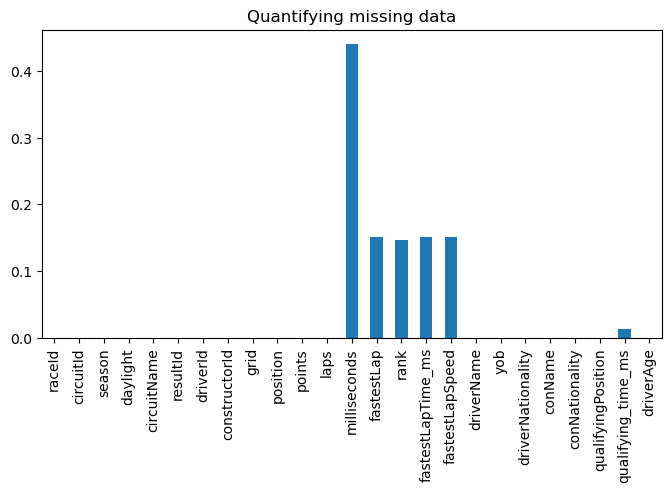

In [63]:
plt.figure(figsize=(8, 4))

f1_df.isna().mean().plot.bar()

plt.title("Quantifying missing data")
plt.show()

### 2.9.2 Checking Distribution and Outliers in numerical columns

In [64]:
# The function plots a Histogram & KDE, Q-Q plot, and Boxplot. 
# This function serves to show the distribution of numerical columns, and helps us identify any outliers.

def diagnostic_plots(df, variable):
    
    # function to plot a histogram, a Q-Q plot, Boxplot
    # side by side, for a certain variable
    
    fig, ax = plt.subplots(1, 3, figsize=(15,6))
    
    # Histogram & KDE
    sns.histplot(df[variable], ax=ax[0], kde=True)
    
    # Q-Q Plot
    stats.probplot(df[variable], dist="norm", plot=ax[1])
    
    # Boxplot
    df[variable].plot.box(ax=ax[2])

    plt.show()

season


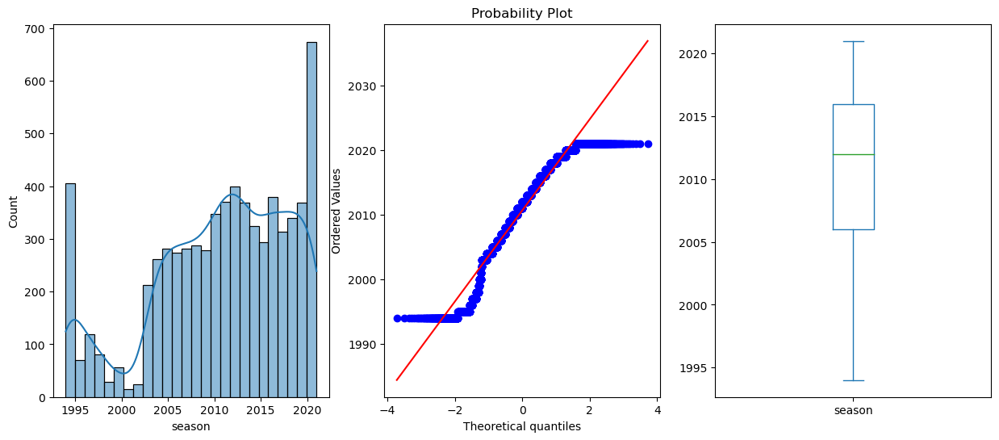

grid


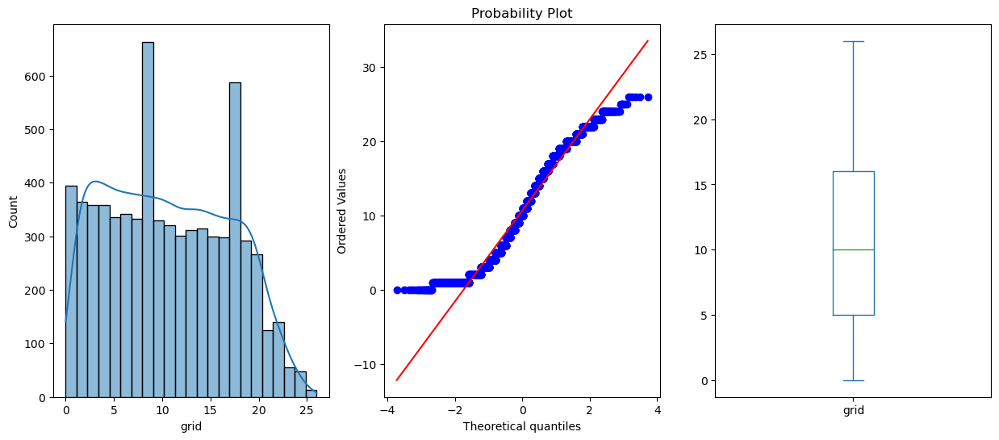

position


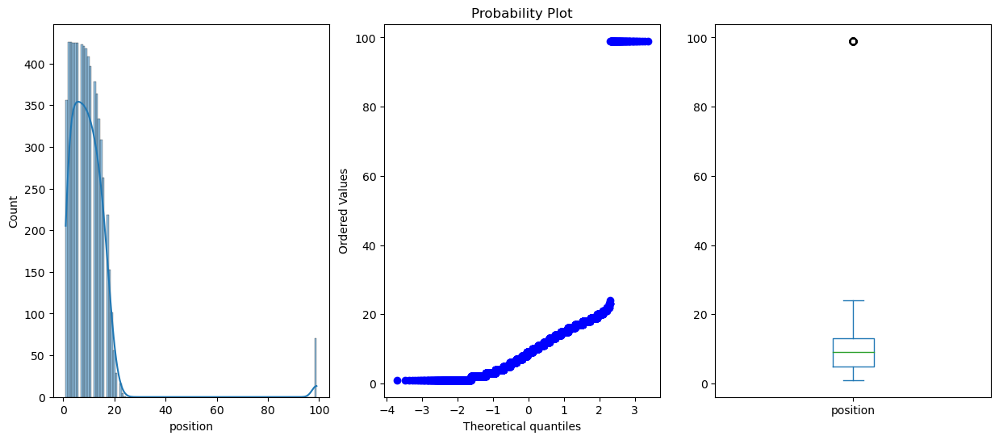

points


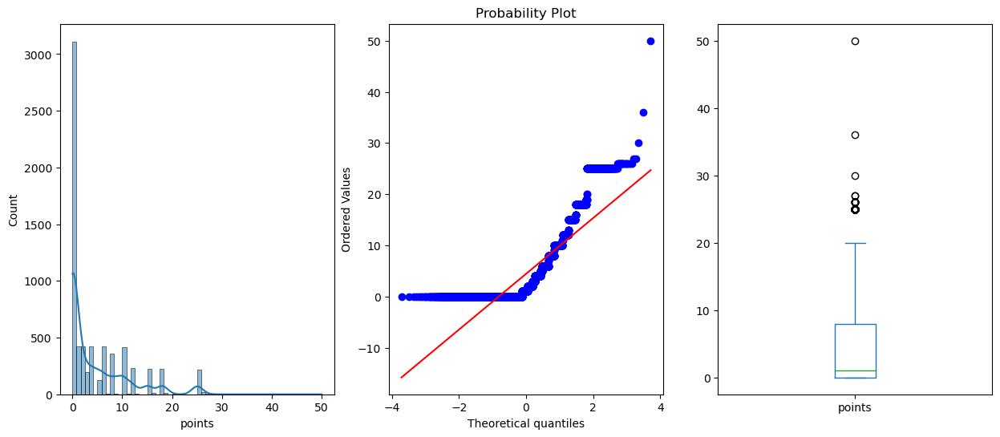

laps


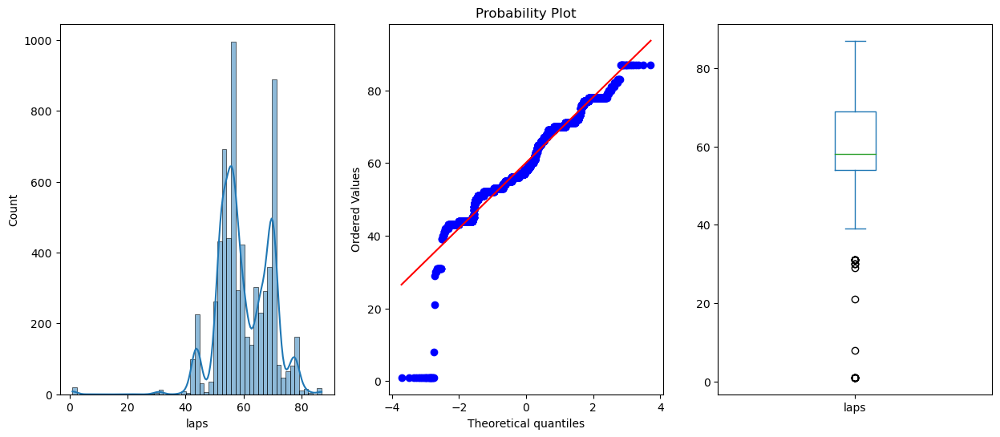

milliseconds


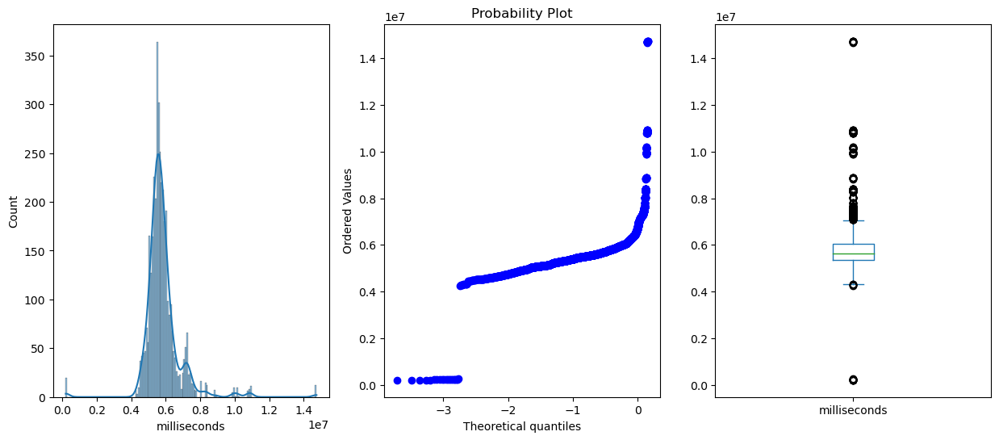

fastestLap


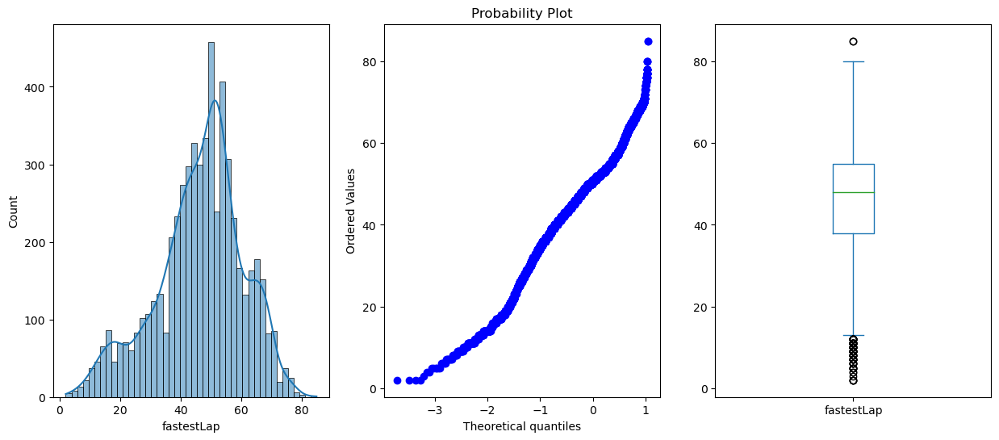

rank


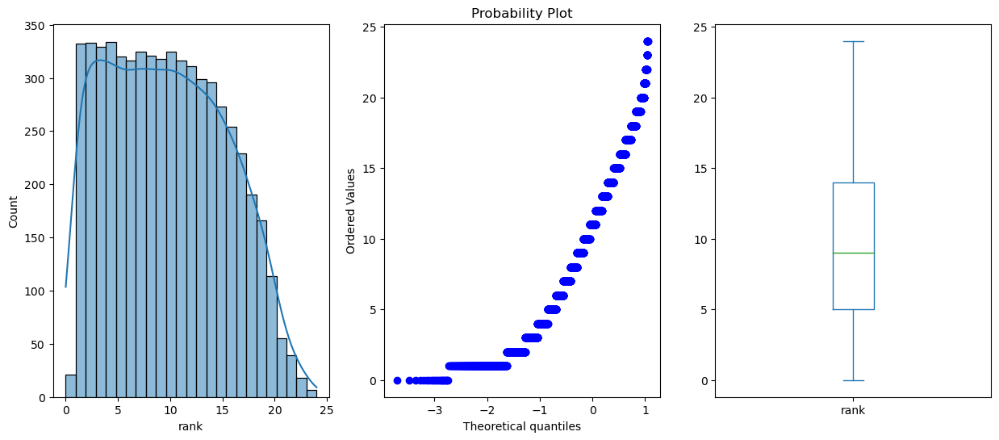

fastestLapTime_ms


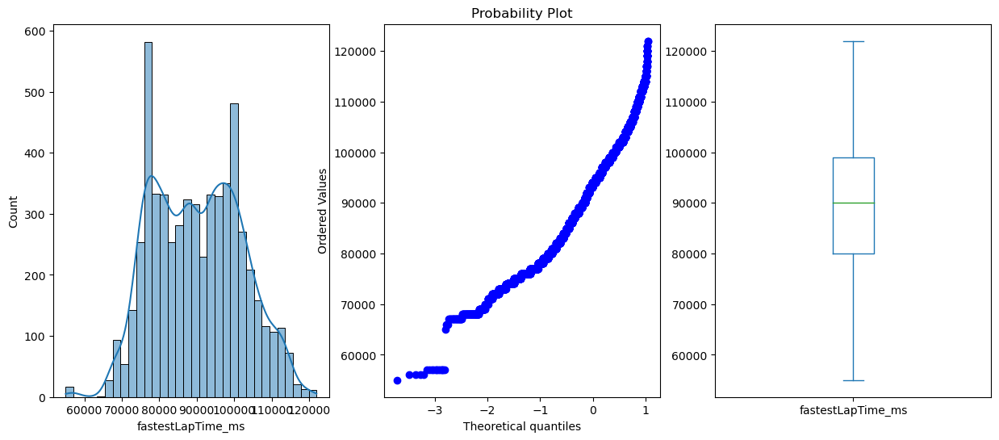

fastestLapSpeed


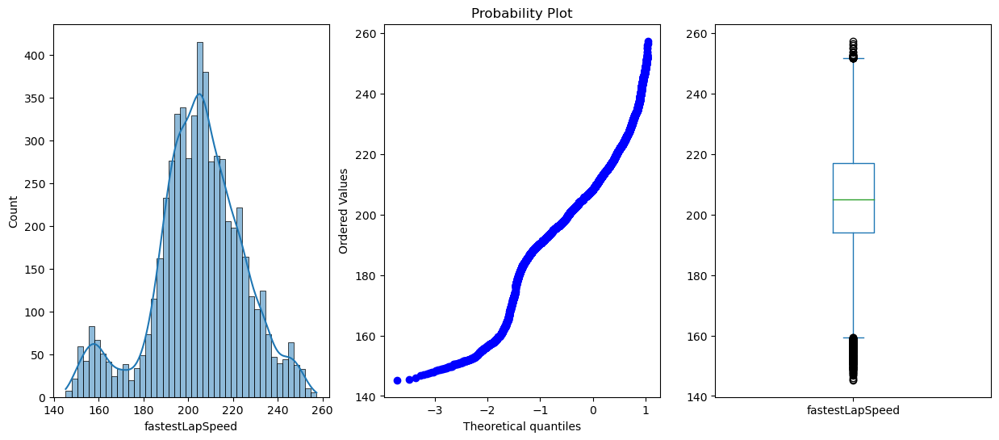

yob


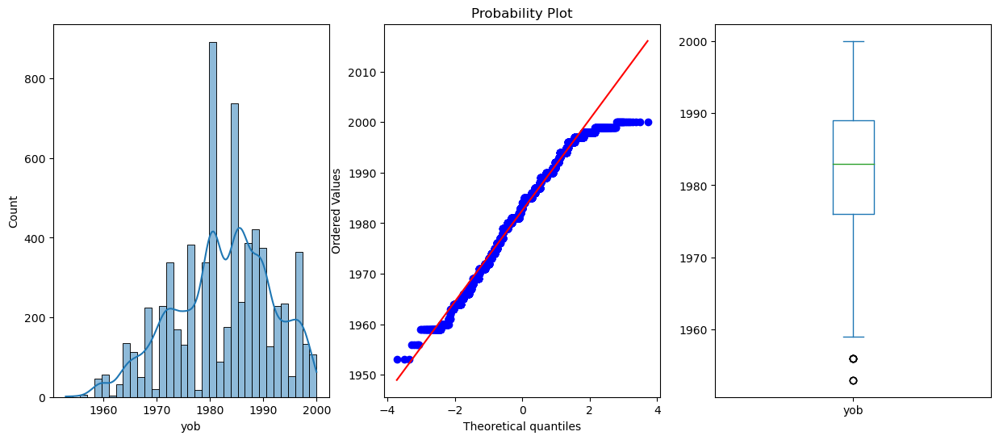

qualifyingPosition


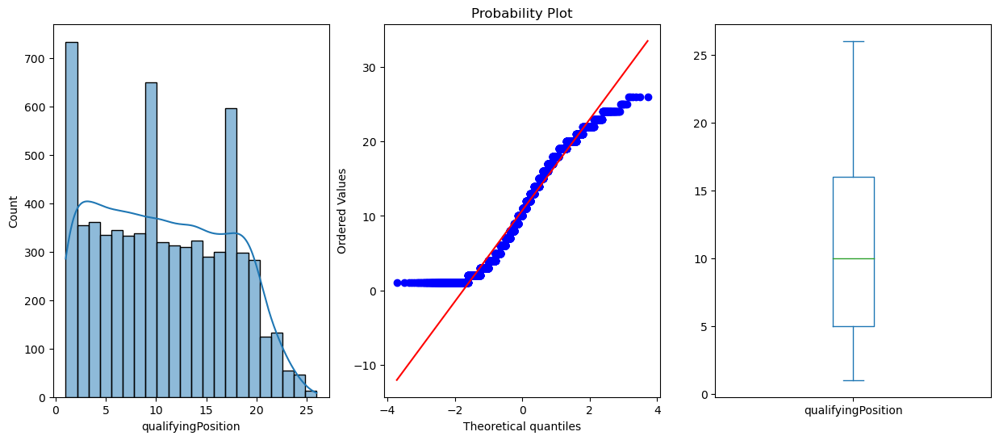

qualifying_time_ms


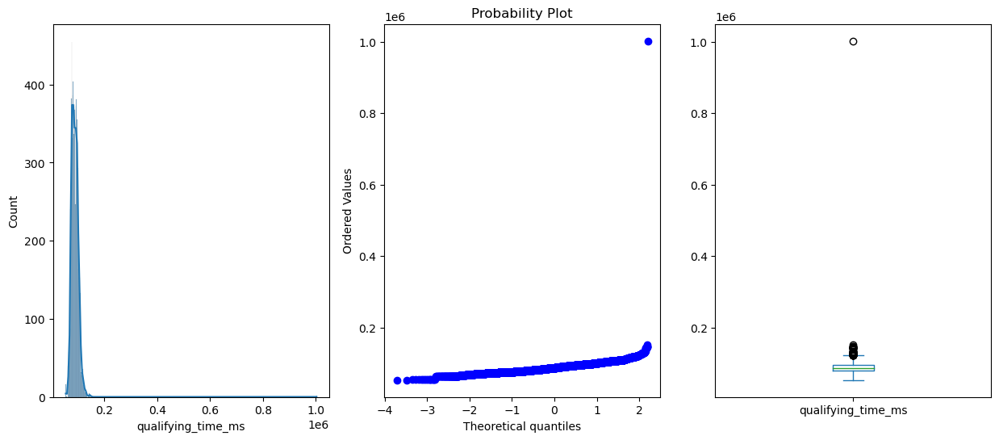

driverAge


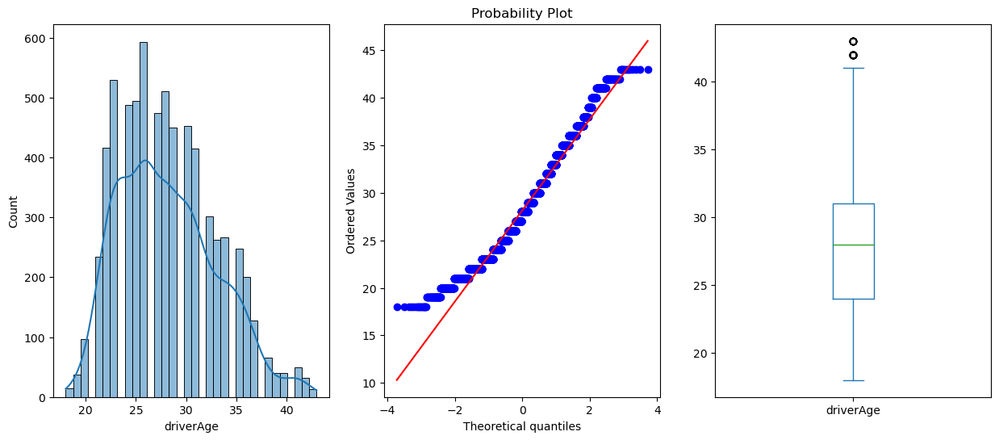

In [65]:
# Get numerical columns
num_cols = [x for x in f1_df.columns if f1_df[x].dtype != "O" and x not in f1_df.filter(regex="Id").columns]
# Remove daylight as it is a True False column
num_cols.remove('daylight')

# Diagnostic Plots for each numerical column
for x in num_cols:    
    print(x)
    diagnostic_plots(f1_df, x)

### 2.9.3 Cardinality of Categorical Columns

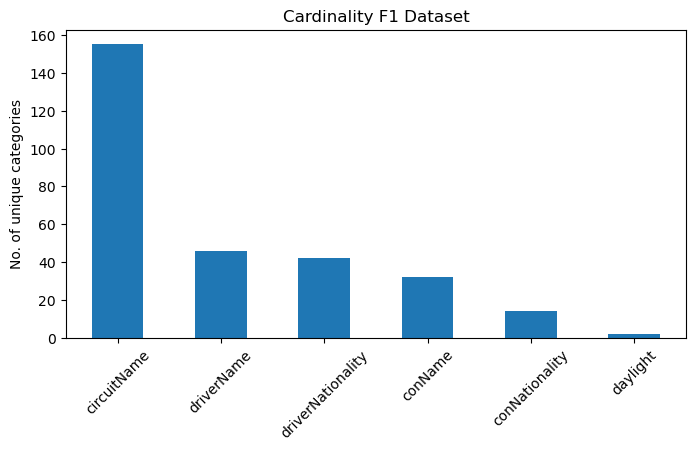

In [66]:
cat_cols = [x for x in f1_df.columns if f1_df[x].dtype == "O"]
cat_cols.append("daylight")

# Figure
fig, ax = plt.subplots(figsize=(12,6))

# "1:" as we want to avoid the "Iten_Identifier" column
f1_df[cat_cols].nunique().sort_values(ascending=False).plot.bar(figsize=(8,4))

# Title and Lables
ax.set_title("Cardinality F1 Dataset")
ax.set_ylabel("No. of unique categories")
ax.set_xticklabels(cat_cols,rotation=45)

plt.show()

### 2.8.4 Pearson Correlation Heatmap

C:\Users\Tristan Sim\AppData\Local\Temp\ipykernel_69464\4192722543.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(f1_df.drop("fastestLapTime_ms", axis=1).corr(), annot=True)


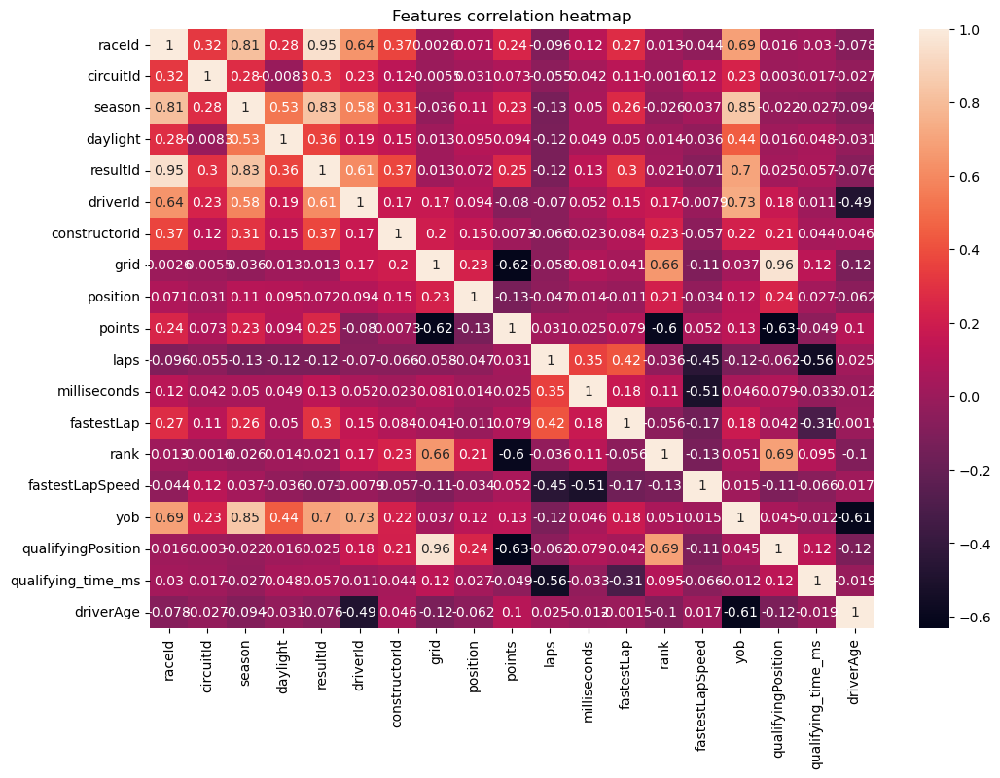

In [67]:
plt.figure(figsize=(12, 8))
sns.heatmap(f1_df.drop("fastestLapTime_ms", axis=1).corr(), annot=True)

plt.title("Features correlation heatmap")
plt.show()

# 3 Data Cleansing and Transformation

In [68]:
# Drop null values in target column
f1_df = f1_df.dropna(subset=["fastestLapTime_ms"])

f1_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5820 entries, 0 to 6849
Data columns (total 25 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   raceId              5820 non-null   int64  
 1   circuitId           5820 non-null   int64  
 2   season              5820 non-null   float64
 3   daylight            5820 non-null   bool   
 4   circuitName         5820 non-null   object 
 5   resultId            5820 non-null   int64  
 6   driverId            5820 non-null   int64  
 7   constructorId       5820 non-null   int64  
 8   grid                5820 non-null   int64  
 9   position            5818 non-null   float64
 10  points              5820 non-null   float64
 11  laps                5820 non-null   int64  
 12  milliseconds        3396 non-null   float64
 13  fastestLap          5820 non-null   float64
 14  rank                5820 non-null   float64
 15  fastestLapTime_ms   5820 non-null   float64
 16  fastes

## 3.1 Outlier Handling

### 3.1.1 Functions

In [69]:
# Count outliers 
def count_outliers(df, variable):
    IQR = df[variable].quantile(0.75) - df[variable].quantile(0.25)

    lower_boundary = df[variable].quantile(0.25) - (IQR * 1.5)
    upper_boundary = df[variable].quantile(0.75) + (IQR * 1.5)
    
    outliers = np.where(df[variable] > upper_boundary, 1, 
                        np.where(df[variable] < lower_boundary, 1, 0))
    return (variable, np.sum(outliers))

# Outlier Trimming
def find_boundaries(df, variable):
    IQR = df[variable].quantile(0.75) - df[variable].quantile(0.25)

    lower_boundary = df[variable].quantile(0.25) - (IQR * 1.5)
    upper_boundary = df[variable].quantile(0.75) + (IQR * 1.5)

    return df.loc[(df[variable] > upper_boundary) | (df[variable] < lower_boundary)]

# Winsorisation
def winsorise(df, variable):
    IQR = df[variable].quantile(0.75) - df[variable].quantile(0.25)

    lower_boundary = df[variable].quantile(0.25) - (IQR * 1.5)
    upper_boundary = df[variable].quantile(0.75) + (IQR * 1.5)
    
    return np.where(df[variable] > upper_boundary, upper_boundary, 
                    np.where(df[variable] < lower_boundary, lower_boundary, df[variable]))

### 3.1.2 Identify columns with Outliers

In [70]:
# Identify number of outliers in each column

count_outliers_list = []
# Get count of outlier in each column
for i in num_cols:
    count_outliers_list.append(count_outliers(f1_df, i))

# If there exists outliers, append to this list
num_cols_outlier = [x for x in count_outliers_list  if x[1] > 0]

# Print columns with outliers
for x in num_cols_outlier:
    print(x)

('position', 69)
('points', 238)
('laps', 6)
('milliseconds', 334)
('fastestLap', 105)
('fastestLapSpeed', 267)
('qualifying_time_ms', 39)
('driverAge', 43)


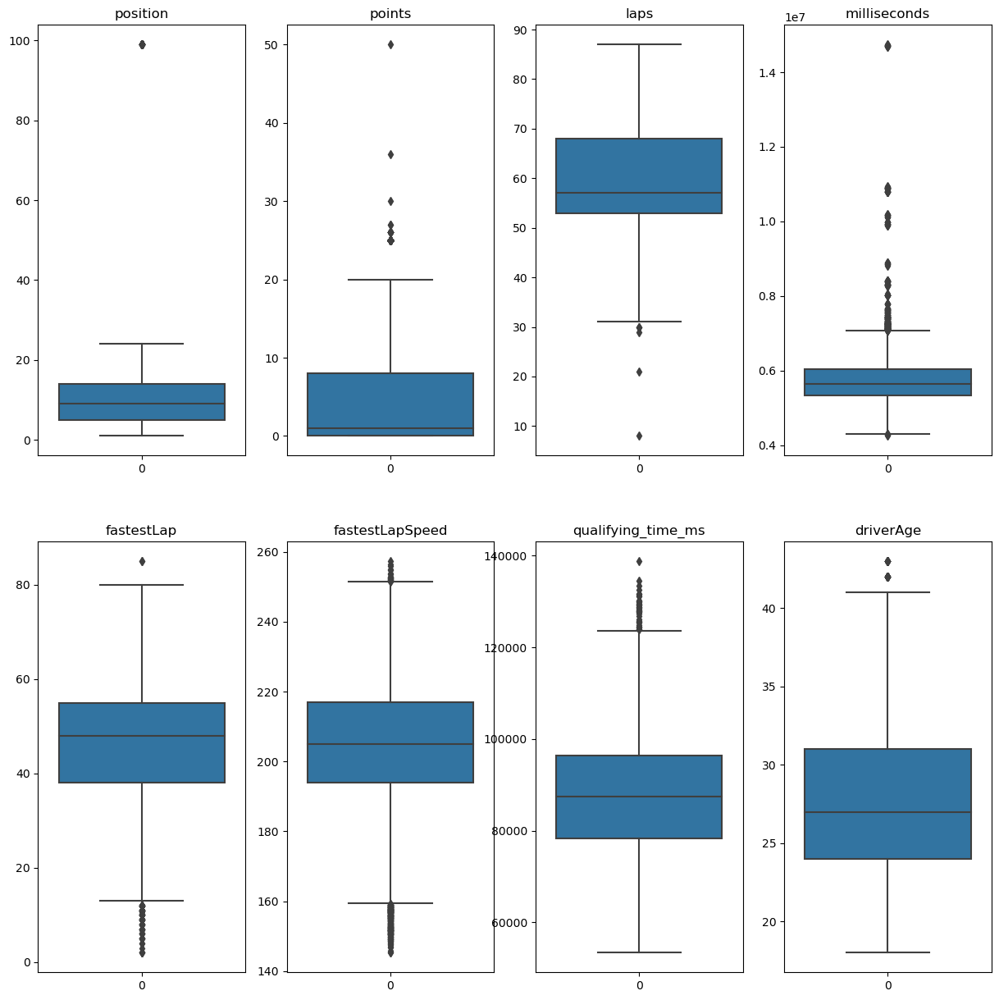

In [71]:
# Plotting distribution of each numerical column
fig, ax = plt.subplots(2, 4, figsize=(15, 15))

for i, x in enumerate(ax.ravel()):
    x.set_title(num_cols_outlier[i][0])
    sns.boxplot(f1_df[num_cols_outlier[i][0]], ax=x)
    
plt.show()

### 3.1.3 Investigating Outliers for each column

In [72]:
# Position column

# After manual research in wikipedia, I found that position 99 usually is the winner, and in some rare cases the runner up
position_outliers = find_boundaries(f1_df, "position")
position_outliers.sample(5)

,raceId,circuitId,season,daylight,circuitName,resultId,driverId,constructorId,grid,position,points,laps,milliseconds,fastestLap,rank,fastestLapTime_ms,fastestLapSpeed,driverName,yob,driverNationality,conName,conNationality,qualifyingPosition,qualifying_time_ms,driverAge
4577,932,7,2015.0,False,Circuit Gilles Villeneuve,22656,1,131,1,99.0,25.0,70,5513145.0,64.0,3.0,77005.0,202.648,Lewis Hamilton,1985,British,Mercedes,German,1,74393.0,30.0
6766,1070,32,2021.0,False,Autódromo Hermanos Rodríguez,25306,830,9,3,99.0,25.0,71,5919086.0,52.0,2.0,79000.0,196.134,Max Verstappen,1997,Dutch,Red Bull,Austrian,3,76225.0,24.0
6626,1061,9,2021.0,True,Silverstone Circuit,25146,1,131,2,99.0,27.0,52,7103284.0,45.0,2.0,89007.0,236.430,Lewis Hamilton,1985,British,Mercedes,German,1,86023.0,36.0
4416,915,71,2014.0,True,Sochi Autodrom,22461,1,131,1,99.0,25.0,53,5510744.0,48.0,3.0,101006.0,207.200,Lewis Hamilton,1985,British,Mercedes,German,1,98338.0,29.0
6498,1054,75,2021.0,True,Autódromo Internacional do Algarve,25006,1,131,2,99.0,25.0,66,5671421.0,47.0,4.0,80009.0,206.971,Lewis Hamilton,1985,British,Mercedes,German,2,77968.0,36.0


In [73]:
# Points column

# Max points a driver can get is 26
points_outliers = find_boundaries(f1_df, "points")
points_outliers.sample(5)

,raceId,circuitId,season,daylight,circuitName,resultId,driverId,constructorId,grid,position,points,laps,milliseconds,fastestLap,rank,fastestLapTime_ms,fastestLapSpeed,driverName,yob,driverNationality,conName,conNationality,qualifyingPosition,qualifying_time_ms,driverAge
2720,340,17,2010.0,True,Shanghai International Circuit,20395,18,1,5,1.0,25.0,56,6402163.0,14.0,4.0,102009.0,190.731,Jenson Button,1980,British,McLaren,British,5,94979.0,30.0
4435,916,69,2014.0,False,Circuit of the Americas,22482,1,131,2,99.0,25.0,56,6004785.0,49.0,4.0,101009.0,194.712,Lewis Hamilton,1985,British,Mercedes,German,2,96443.0,29.0
5910,1016,7,2019.0,False,Circuit Gilles Villeneuve,24326,1,131,2,1.0,25.0,70,5347084.0,62.0,4.0,74008.0,209.851,Lewis Hamilton,1985,British,Mercedes,German,2,70446.0,34.0
6070,1025,71,2019.0,True,Sochi Autodrom,24506,1,131,2,1.0,26.0,53,5618992.0,51.0,1.0,95008.0,219.847,Lewis Hamilton,1985,British,Mercedes,German,2,92030.0,34.0
6444,1047,24,2020.0,True,Yas Marina Circuit,24946,830,9,1,1.0,25.0,55,5788645.0,14.0,2.0,101000.0,198.046,Max Verstappen,1997,Dutch,Red Bull,Austrian,1,95246.0,23.0


In [74]:
# Laps column

# I manually researched these races online, and crossed check to confirm that these laps were indeed correct
# Since they do not deviate TOO far from the general values, I will leave this column alone
laps_outliers = find_boundaries(f1_df, "laps")
laps_outliers

,raceId,circuitId,season,daylight,circuitName,resultId,driverId,constructorId,grid,position,points,laps,milliseconds,fastestLap,rank,fastestLapTime_ms,fastestLapSpeed,driverName,yob,driverNationality,conName,conNationality,qualifyingPosition,qualifying_time_ms,driverAge
2422,2,2,2009.0,True,Sepang International Circuit,7588,20,9,13,15.0,0.0,30,NaN,10.0,6.0,98004.0,202.737,Sebastian Vettel,1987,German,Red Bull,Austrian,3,94276.0,22.0
2423,2,2,2009.0,True,Sepang International Circuit,7589,67,5,20,16.0,0.0,30,NaN,16.0,8.0,98009.0,201.689,Sébastien Buemi,1988,Swiss,Toro Rosso,Italian,20,96107.0,21.0
2424,2,2,2009.0,True,Sepang International Circuit,7590,16,10,19,17.0,0.0,30,NaN,17.0,18.0,99005.0,200.623,Adrian Sutil,1983,German,Force India,Indian,19,95951.0,26.0
2425,2,2,2009.0,True,Sepang International Circuit,7591,21,10,18,18.0,0.0,29,NaN,16.0,17.0,99004.0,200.738,Giancarlo Fisichella,1973,Italian,Force India,Indian,18,95908.0,36.0
3883,884,4,2013.0,True,Circuit de Barcelona-Catalunya,21820,823,207,18,21.0,0.0,21,NaN,11.0,21.0,90006.0,184.973,Giedo van der Garde,1985,Dutch,Caterham,Malaysian,19,84661.0,28.0
3884,884,4,2013.0,True,Circuit de Barcelona-Catalunya,21821,154,208,6,22.0,0.0,8,NaN,5.0,22.0,91001.0,183.879,Romain Grosjean,1986,French,Lotus F1,British,7,81308.0,27.0


In [75]:
milliseconds_outliers = find_boundaries(f1_df, "milliseconds")

milliseconds_outliers.sample(5)

,raceId,circuitId,season,daylight,circuitName,resultId,driverId,constructorId,grid,position,points,laps,milliseconds,fastestLap,rank,fastestLapTime_ms,fastestLapSpeed,driverName,yob,driverNationality,conName,conNationality,qualifyingPosition,qualifying_time_ms,driverAge
6493,1053,21,2021.0,True,Autodromo Enzo e Dino Ferrari,24998,8,51,16,13.0,0.0,63,7449371.0,62.0,5.0,78004.0,225.548,Kimi Räikkönen,1979,Finnish,Alfa Romeo,Swiss,16,75974.0,42.0
2962,353,35,2010.0,False,Korean International Circuit,20708,1,1,4,2.0,18.0,55,10115809.0,42.0,3.0,110004.0,183.048,Lewis Hamilton,1985,British,McLaren,British,4,96062.0,25.0
433,45,20,2007.0,True,Nürburgring,567,4,1,2,99.0,10.0,60,7586358.0,35.0,2.0,93002.0,198.783,Fernando Alonso,1981,Spanish,McLaren,British,2,90983.0,26.0
6485,1053,21,2021.0,True,Autodromo Enzo e Dino Ferrari,24990,832,6,11,5.0,10.0,63,7381634.0,60.0,7.0,78005.0,225.154,Carlos Sainz,1994,Spanish,Ferrari,Italian,11,75199.0,27.0
435,45,20,2007.0,True,Nürburgring,569,17,9,6,3.0,6.0,60,7652032.0,29.0,8.0,94004.0,196.220,Mark Webber,1976,Australian,Red Bull,Austrian,6,91661.0,31.0


In [76]:
# a drivers fastestLap can happen anytime
# Leave this column alone
fastestLap_outliers = find_boundaries(f1_df, "fastestLap")

fastestLap_outliers.sample(5)

,raceId,circuitId,season,daylight,circuitName,resultId,driverId,constructorId,grid,position,points,laps,milliseconds,fastestLap,rank,fastestLapTime_ms,fastestLapSpeed,driverName,yob,driverNationality,conName,conNationality,qualifyingPosition,qualifying_time_ms,driverAge
471,47,5,2007.0,True,Istanbul Park,618,9,2,5,8.0,1.0,58,5258868.0,11.0,11.0,88009.0,216.118,Robert Kubica,1984,Polish,BMW Sauber,German,5,87253.0,23.0
622,56,21,2006.0,True,Autodromo Enzo e Dino Ferrari,818,22,11,3,10.0,0.0,62,5544337.0,12.0,13.0,86001.0,207.275,Rubens Barrichello,1972,Brazilian,Honda,Japanese,3,83242.0,34.0
1264,100,9,2004.0,False,Silverstone Circuit,1718,18,16,3,4.0,5.0,60,5093383.0,10.0,3.0,79005.0,232.835,Jenson Button,1980,British,BAR,British,3,78580.0,24.0
1188,94,4,2004.0,False,Circuit de Barcelona-Catalunya,1597,15,4,4,3.0,6.0,66,5285135.0,12.0,6.0,78002.0,213.067,Jarno Trulli,1974,Italian,Renault,French,4,76144.0,30.0
1153,92,3,2004.0,False,Bahrain International Circuit,1555,30,6,1,1.0,10.0,57,5314875.0,7.0,1.0,90003.0,216.074,Michael Schumacher,1969,German,Ferrari,Italian,1,90139.0,35.0


In [77]:
fastestLapSpeed_outliers = find_boundaries(f1_df, "fastestLapSpeed")
fastestLapSpeed_outliers.sample(5)

,raceId,circuitId,season,daylight,circuitName,resultId,driverId,constructorId,grid,position,points,laps,milliseconds,fastestLap,rank,fastestLapTime_ms,fastestLapSpeed,driverName,yob,driverNationality,conName,conNationality,qualifyingPosition,qualifying_time_ms,driverAge
5560,994,6,2018.0,True,Circuit de Monaco,23895,838,1,12,14.0,0.0,77,NaN,76.0,11.0,76009.0,156.291,Stoffel Vandoorne,1992,Belgian,McLaren,British,12,72440.0,26.0
1323,104,14,2004.0,False,Autodromo Nazionale di Monza,1798,11,16,5,4.0,5.0,53,4533818.0,32.0,5.0,82007.0,252.296,Takuma Sato,1977,Japanese,BAR,British,5,80715.0,27.0
1327,104,14,2004.0,False,Autodromo Nazionale di Monza,1802,21,15,15,8.0,1.0,53,4553879.0,51.0,4.0,82006.0,252.433,Giancarlo Fisichella,1973,Italian,Sauber,Swiss,15,82239.0,31.0
2766,342,6,2010.0,True,Circuit de Monaco,20453,153,5,17,11.0,0.0,78,6622490.0,73.0,11.0,76004.0,157.421,Jaime Alguersuari,1990,Spanish,Toro Rosso,Italian,17,76021.0,20.0
2489,6,6,2009.0,True,Circuit de Monaco,7667,16,10,15,14.0,0.0,77,NaN,66.0,14.0,76002.0,157.702,Adrian Sutil,1983,German,Force India,Indian,15,76248.0,26.0


In [78]:
qualTime_outliers = find_boundaries(f1_df, "qualifying_time_ms")
qualTime_outliers.sample(5)

,raceId,circuitId,season,daylight,circuitName,resultId,driverId,constructorId,grid,position,points,laps,milliseconds,fastestLap,rank,fastestLapTime_ms,fastestLapSpeed,driverName,yob,driverNationality,conName,conNationality,qualifyingPosition,qualifying_time_ms,driverAge
4184,901,2,2014.0,True,Sepang International Circuit,22166,820,206,21,15.0,0.0,54,NaN,49.0,18.0,108002.0,184.341,Max Chilton,1991,British,Marussia,Russian,21,124388.0,23.0
4356,911,13,2014.0,True,Circuit de Spa-Francorchamps,22389,828,207,22,17.0,0.0,43,NaN,26.0,19.0,115009.0,217.553,Marcus Ericsson,1990,Swedish,Caterham,Malaysian,22,134438.0,24.0
2908,349,13,2010.0,True,Circuit de Spa-Francorchamps,20630,29,164,19,20.0,0.0,42,NaN,31.0,20.0,115005.0,218.336,Sakon Yamamoto,1982,Japanese,HRT,Spanish,21,123941.0,28.0
3245,852,13,2011.0,True,Circuit de Spa-Francorchamps,21053,15,205,18,14.0,0.0,43,NaN,38.0,17.0,114006.0,220.076,Jarno Trulli,1974,Italian,Lotus,Malaysian,19,128773.0,37.0
4342,911,13,2014.0,True,Circuit de Spa-Francorchamps,22375,822,3,6,3.0,15.0,44,5104588.0,40.0,4.0,112007.0,223.698,Valtteri Bottas,1989,Finnish,Williams,British,6,128049.0,25.0


### 3.1.4 Outlier Handling for each column

#### Position

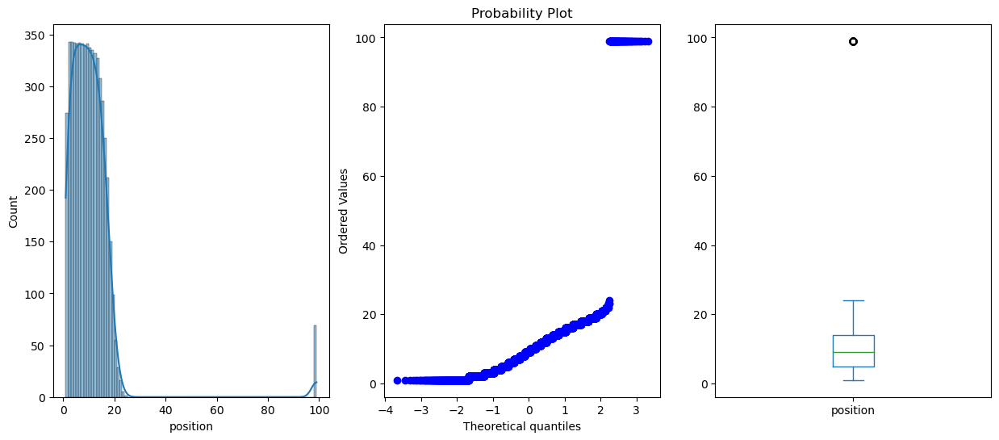

In [79]:
# Position column - Before
diagnostic_plots(f1_df, "position")

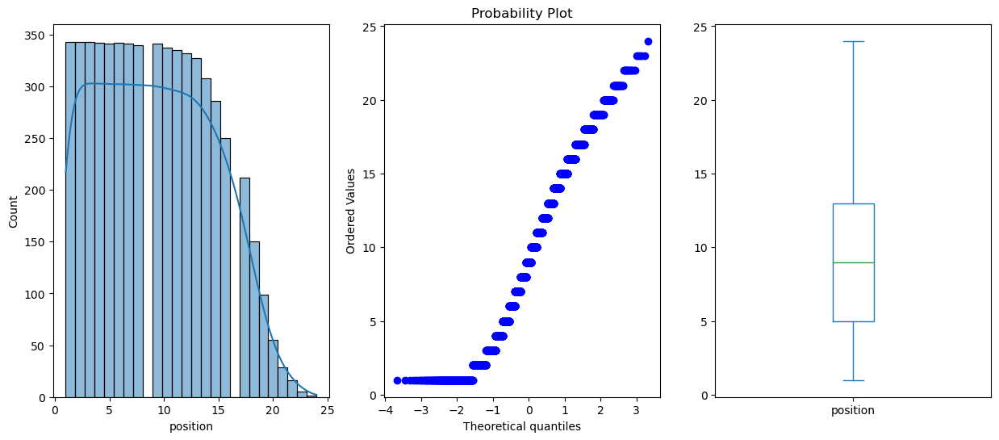

In [80]:
# Position column - After

# Replacing 99 with 1
f1_df["position"] = f1_df["position"].replace({99 : 1})

# No more spike in values at 99
diagnostic_plots(f1_df, "position")

#### Points

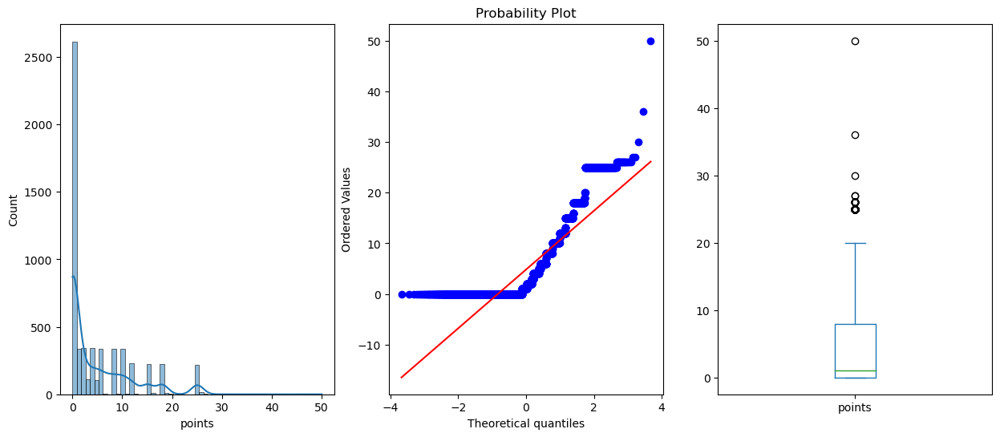

In [81]:
# Points column - Before
diagnostic_plots(f1_df, "points")

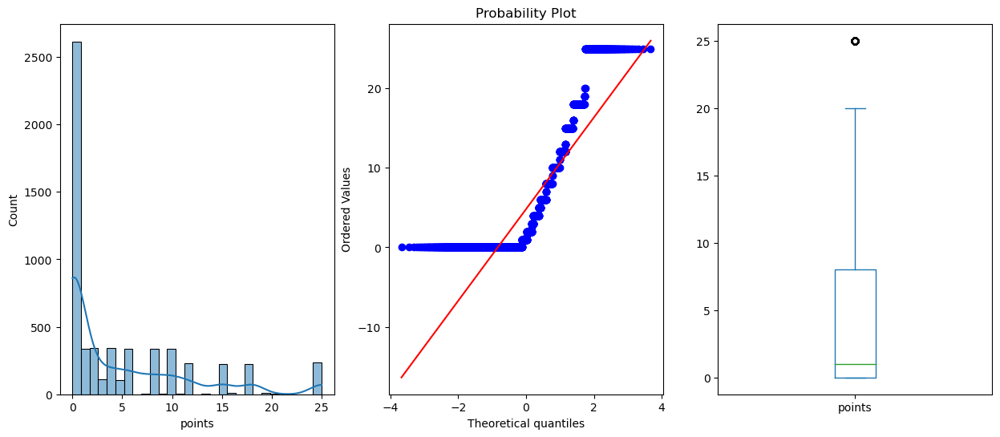

In [82]:
# Points column - After
f1_df["points"] = np.where(f1_df["points"] > 25, 25, f1_df["points"])

diagnostic_plots(f1_df, "points")

#### Winsorise milliseconds

<Axes: xlabel='milliseconds', ylabel='Count'>

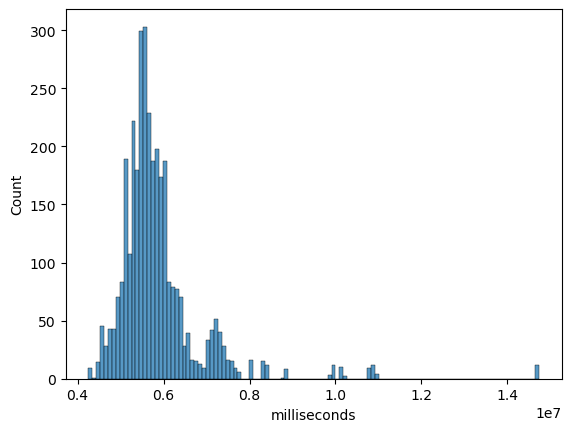

In [83]:
sns.histplot(f1_df["milliseconds"])

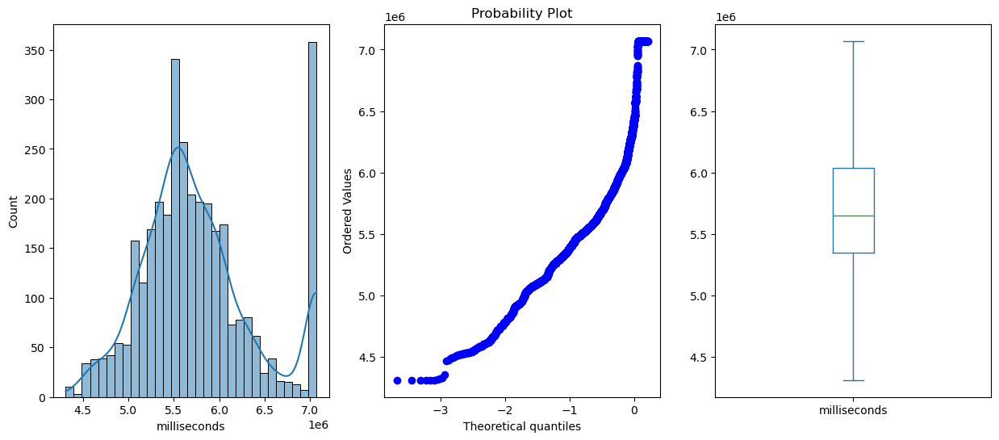

In [84]:
# After winsorizing
f1_df["milliseconds"] = winsorise(f1_df, "milliseconds")

diagnostic_plots(f1_df, "milliseconds")

## Train Test Split

In [85]:
X_train, X_test, y_train, y_test = train_test_split(
    f1_df.drop('fastestLapTime_ms', axis=1), f1_df['fastestLapTime_ms'], test_size=0.3, random_state=0)

X_train.shape, X_test.shape

((4074, 24), (1746, 24))

## 3.2 Imputing missing values

### 3.2.1 Identifying columns with missing data

In [86]:
X_train.isna().sum().sort_values(ascending=False)

milliseconds          1719
qualifying_time_ms      62
position                 1
fastestLap               0
qualifyingPosition       0
conNationality           0
conName                  0
driverNationality        0
yob                      0
driverName               0
fastestLapSpeed          0
rank                     0
raceId                   0
circuitId                0
laps                     0
points                   0
grid                     0
constructorId            0
driverId                 0
resultId                 0
circuitName              0
daylight                 0
season                   0
driverAge                0
dtype: int64

In [87]:
X_test.isna().sum().sort_values(ascending=False)

milliseconds          705
qualifying_time_ms     16
position                1
fastestLap              0
qualifyingPosition      0
conNationality          0
conName                 0
driverNationality       0
yob                     0
driverName              0
fastestLapSpeed         0
rank                    0
raceId                  0
circuitId               0
laps                    0
points                  0
grid                    0
constructorId           0
driverId                0
resultId                0
circuitName             0
daylight                0
season                  0
driverAge               0
dtype: int64

### 3.2.2 Dropping rows of columns with low missing values (< 5%)

In [88]:
# Position column and 
# 1 missing row in train and test, drop

# Create new copy of X_train and X_test
X_train_imputed = X_train.copy()
X_test_imputed = X_test.copy()

train_with_missing_values = X_train_imputed[X_train_imputed["position"].isna() | X_train_imputed["qualifying_time_ms"].isna()]

X_train_imputed = X_train_imputed.dropna(subset=["position", "qualifying_time_ms"])
y_train = y_train.drop(index=train_with_missing_values.index)

test_with_missing_values = X_test_imputed[X_test_imputed["position"].isna() | X_test_imputed["qualifying_time_ms"].isna()]

X_test_imputed = X_test_imputed.dropna(subset=["position", "qualifying_time_ms"])
y_test = y_test.drop(index=test_with_missing_values.index)

### 3.2.3 Missing values in milliseconds column

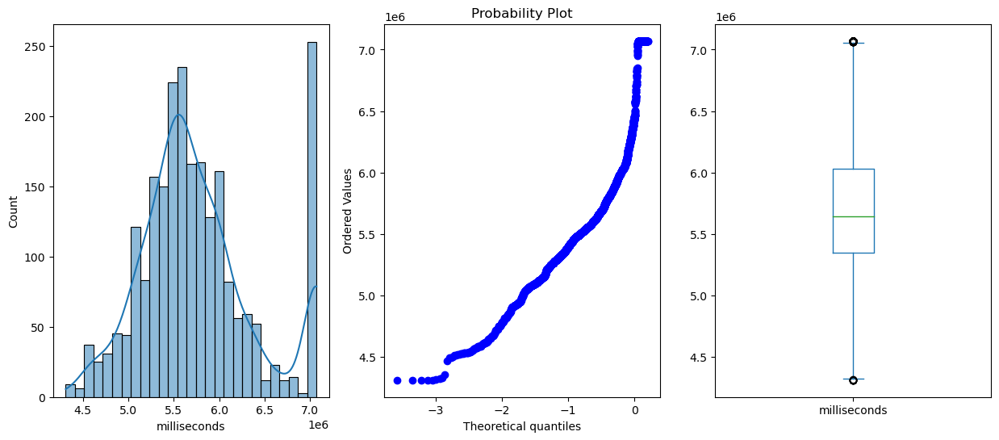

In [89]:
# Checking distribution and existence of outliers before imputation
diagnostic_plots(X_train, "milliseconds")

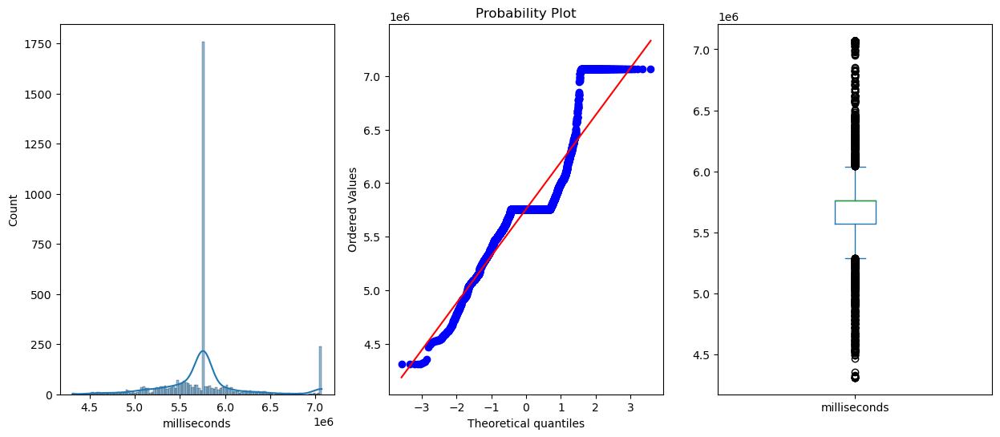

In [90]:
# Mean Imputation
X_train_mean = X_train.copy()

imputer_mean = MeanMedianImputer(imputation_method='mean',
                                 variables=['milliseconds'])
imputer_mean.fit(X_train_mean)

X_train_mean = imputer_mean.transform(X_train_mean)

diagnostic_plots(X_train_mean, 'milliseconds')

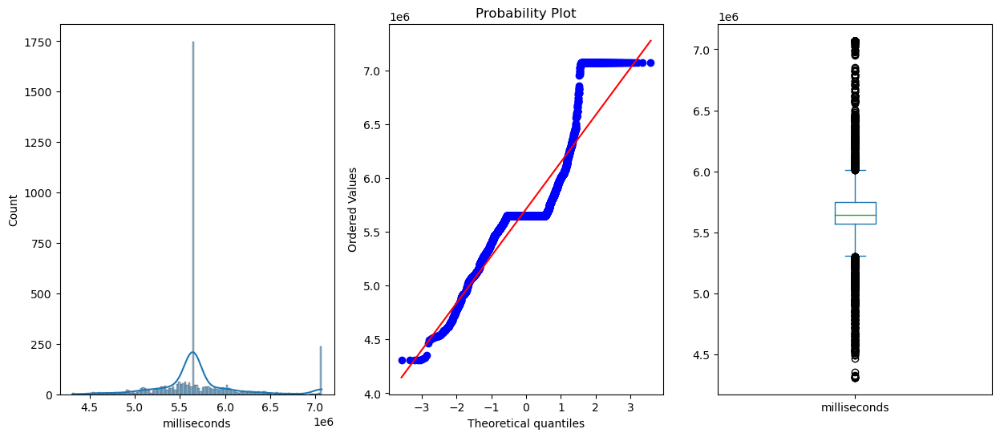

In [91]:
# Median Imputation
X_train_median = X_train.copy()

imputer_median = MeanMedianImputer(imputation_method='median',
                                 variables=['milliseconds'])
imputer_median.fit(X_train_median)

X_train_median = imputer_median.transform(X_train_median)

diagnostic_plots(X_train_median, 'milliseconds')

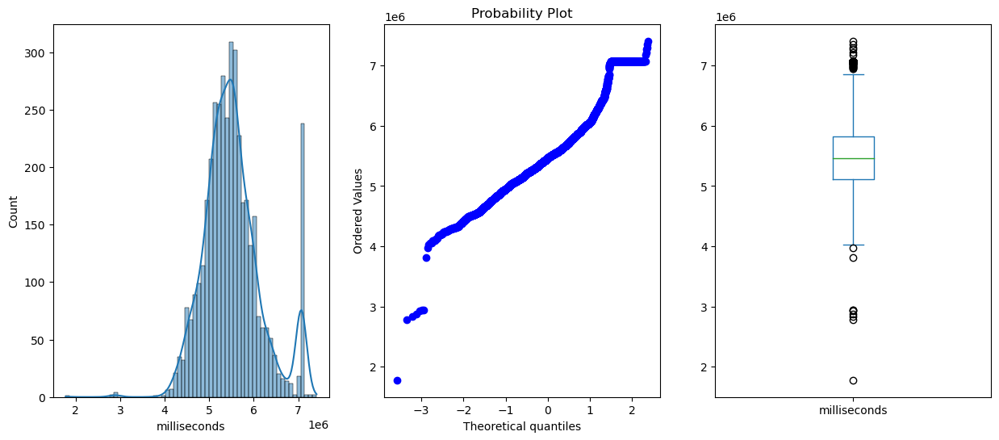

In [92]:
# Using qualifying time * laps as milliseconds
X_train_quali = X_train.copy()
X_train_quali["quali_est_time"] = X_train_quali["qualifying_time_ms"] * X_train_quali["laps"]
X_train_quali["milliseconds"] = np.where(X_train_quali["milliseconds"].isna(), 
                                         X_train_quali["quali_est_time"], X_train_quali["milliseconds"])

diagnostic_plots(X_train_quali, "milliseconds")

In [93]:
# Hence, I will be using qualifying_time * laps to impute the missing values in X_train and X_test

# Create new column for qualifying time * laps
X_train_imputed["quali_est_time"] = X_train_imputed["qualifying_time_ms"] * X_train_imputed["laps"]
# Use np.where() to fill in the missing values
X_train_imputed["milliseconds"] = np.where(X_train_imputed["milliseconds"].isna(), 
                                         X_train_imputed["quali_est_time"], X_train_imputed["milliseconds"])

# Winsorise again due to new outliers
X_train_imputed["milliseconds"] = winsorise(X_train_imputed, "milliseconds")

# Drop the quali_est_time column
X_train_imputed = X_train_imputed.drop("quali_est_time", axis=1)

In [94]:
# Same thing to X_test

X_test_imputed["quali_est_time"] = X_test_imputed["qualifying_time_ms"] * X_test_imputed["laps"]
X_test_imputed["milliseconds"] = np.where(X_test_imputed["milliseconds"].isna(), 
                                         X_test_imputed["quali_est_time"], X_test_imputed["milliseconds"])

# Winsorise again
X_test_imputed["milliseconds"] = winsorise(X_test_imputed, "milliseconds")

X_test_imputed = X_test_imputed.drop("quali_est_time", axis=1)

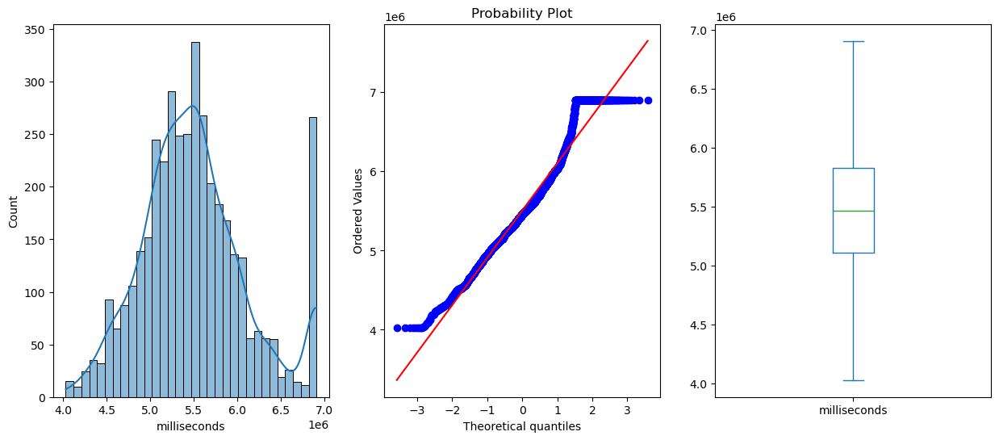

In [95]:
diagnostic_plots(X_train_imputed, "milliseconds")

### 3.2.4 Last check for missing values 

In [96]:
# No more missing values
X_train_imputed.isna().sum()

raceId                0
circuitId             0
season                0
daylight              0
circuitName           0
resultId              0
driverId              0
constructorId         0
grid                  0
position              0
points                0
laps                  0
milliseconds          0
fastestLap            0
rank                  0
fastestLapSpeed       0
driverName            0
yob                   0
driverNationality     0
conName               0
conNationality        0
qualifyingPosition    0
qualifying_time_ms    0
driverAge             0
dtype: int64

In [97]:
# No more missing values
X_test_imputed.isna().sum()

raceId                0
circuitId             0
season                0
daylight              0
circuitName           0
resultId              0
driverId              0
constructorId         0
grid                  0
position              0
points                0
laps                  0
milliseconds          0
fastestLap            0
rank                  0
fastestLapSpeed       0
driverName            0
yob                   0
driverNationality     0
conName               0
conNationality        0
qualifyingPosition    0
qualifying_time_ms    0
driverAge             0
dtype: int64

## 3.3 Categorical Data Encoding

### 3.3.1 Observing Cardinality of Categorical Columns

In [98]:
cat_cols.remove('daylight')

cat_cols

['circuitName', 'driverName', 'driverNationality', 'conName', 'conNationality']

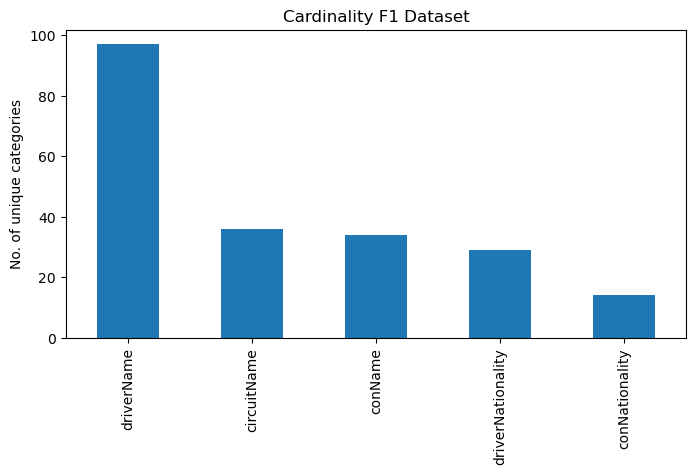

driverName           97
circuitName          36
conName              34
driverNationality    29
conNationality       14
dtype: int64

In [99]:
# Figure
fig, ax = plt.subplots(figsize=(12,6))

# "1:" as we want to avoid the "Iten_Identifier" column
X_train_imputed[cat_cols].nunique().sort_values(ascending=False).plot.bar(figsize=(8,4))

# Title and Lables
ax.set_title("Cardinality F1 Dataset")
ax.set_ylabel("No. of unique categories")

plt.show()

X_train_imputed[cat_cols].nunique().sort_values(ascending=False)

### 3.3.2 Leave-One-Out Encoding

In [100]:
X_train_enc = X_train_imputed.copy()
X_test_enc = X_test_imputed.copy()

X_train_y_train = pd.concat([X_train_enc, y_train], axis=1)
X_test_y_test = pd.concat([X_test_enc, y_test], axis=1)

# Instantiate LOOE with these columns, set sigma to 0.2
LOOE = LeaveOneOutEncoder(cols=["driverName", "circuitName", "conName"], sigma=0)

# Fit features and target
LOOE.fit(X_train_y_train[["driverName", "circuitName", "conName"]], X_train_y_train["fastestLapTime_ms"])

# Transform features in train and test
X_train_enc[["driverName", "circuitName", "conName"]] = LOOE.transform(X_train_y_train[["driverName", "circuitName", "conName"]],
                                                                       X_train_y_train["fastestLapTime_ms"])

X_test_enc[["driverName", "circuitName", "conName"]] = LOOE.transform(X_test_y_test[["driverName", "circuitName", "conName"]],
                                                                       X_test_y_test["fastestLapTime_ms"])   


### 3.3.4 Frequency Encoding

In [101]:
for i in ["driverNationality", "conNationality"]:
    frequency_train = (X_train_enc.groupby(i).size() / len(X_train_enc[i])).to_dict()
    frequency_test = (X_train_enc.groupby(i).size() / len(X_train_enc[i])).to_dict()

    # Map dictionary values to respective keys in the column
    X_train_enc[i] = X_train_enc[i].map(frequency_train)
    X_test_enc[i] = X_test_enc[i].map(frequency_test)

X_train_enc

,raceId,circuitId,season,daylight,circuitName,resultId,driverId,constructorId,grid,position,points,laps,milliseconds,fastestLap,rank,fastestLapSpeed,driverName,yob,driverNationality,conName,conNationality,qualifyingPosition,qualifying_time_ms,driverAge
3435,862,17,2012.0,True,99994.800995,21288,4,6,9,9.0,2.0,56,5824185.0,41.0,12.0,194.001,89703.976879,1981,0.073031,89430.096154,0.188435,9,95982.0,31.0
3733,877,24,2012.0,True,102192.064327,21643,18,1,5,4.0,12.0,55,6366454.0,50.0,4.0,191.273,90026.507353,1980,0.134347,89983.160000,0.257976,6,101290.0,32.0
4305,908,9,2014.0,True,90601.100917,22322,813,208,20,17.0,0.0,49,5090708.0,48.0,16.0,211.412,93217.787234,1985,0.011964,93966.556962,0.257976,15,103892.0,29.0
4039,894,35,2013.0,True,104542.307692,21999,8,208,9,2.0,18.0,55,6197925.0,51.0,3.0,198.225,88786.678788,1979,0.084497,93941.278481,0.257976,10,98181.0,34.0
2825,345,12,2010.0,True,101122.411765,20530,24,10,14,16.0,0.0,57,6080461.0,52.0,14.0,194.490,91241.236842,1980,0.053589,91905.053640,0.065304,14,98884.0,30.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5941,1017,34,2019.0,True,95593.000000,24359,826,5,19,14.0,0.0,52,4761328.0,43.0,16.0,220.857,91306.000000,1994,0.029661,90944.550562,0.188435,16,91564.0,25.0
4273,907,70,2014.0,True,69121.258333,22287,13,3,1,4.0,12.0,71,5292334.0,63.0,4.0,214.553,91200.525316,1981,0.081505,90681.098143,0.257976,1,68759.0,33.0
2662,17,24,2009.0,True,102209.637427,16075,3,3,9,9.0,0.0,55,5689355.0,49.0,15.0,197.970,91609.379032,1985,0.177717,90604.190981,0.257976,9,100661.0,24.0
3616,871,13,2012.0,True,110507.568862,21500,13,6,14,5.0,10.0,44,5378375.0,30.0,3.0,222.223,90941.037975,1981,0.081505,89401.242788,0.188435,14,109147.0,31.0


### 3.3.4 Model Performance after Encoding

In [102]:
# Build Linear Regression Model
linear_enc = LinearRegression()
linear_enc.fit(X_train_enc, y_train)

print('train_rmse:', mean_squared_error(y_train, linear_enc.predict(X_train_enc), squared=False), 
      '\ntest_rmse:', mean_squared_error(y_test, linear_enc.predict(X_test_enc), squared=False))

print('train_mae:', mean_absolute_error(y_train, linear_enc.predict(X_train_enc)))
print('test_mae:', mean_absolute_error(y_test, linear_enc.predict(X_test_enc)))

print('train_r-sq:', r2_score(y_train, linear_enc.predict(X_train_enc)), 
      '\ntest_r-sq:', r2_score(y_test, linear_enc.predict(X_test_enc)))

train_rmse: 2126.740568426295 
test_rmse: 2231.3397020502525
train_mae: 1388.8558824407519
test_mae: 1406.072893393778
train_r-sq: 0.9673317505183083 
test_r-sq: 0.9651929780689267


### 3.3.5 EXTRA - Target Mean Encoding

In [103]:
# Mean target per category
#X_train_enc = X_train_imputed.copy()
#X_test_enc = X_test_imputed.copy()
#
#X_train_y_train = pd.concat([X_train_enc, y_train], axis=1)
#X_test_y_test = pd.concat([X_test_enc, y_test], axis=1)
#
## Loop through these columns
#for i in ["driverName", "circuitName", "conName"]:
#    # Group by the column, get the mean fastestlaptime and make it a dictionary
#    ordered_labels_train = X_train_y_train.groupby(i)['fastestLapTime_ms'].mean().to_dict()
#    ordered_labels_test = X_test_y_test.groupby(i)['fastestLapTime_ms'].mean().to_dict()
#
#    # Map dictionary values to respective keys in the column
#    X_train_enc[i] = X_train_enc[i].map(ordered_labels_train)
#    X_test_enc[i] = X_test_enc[i].map(ordered_labels_test)
#    

### 3.3.6 EXTRA - Testing One Hot encoding

In [104]:
ohe_enc = OneHotEncoder()

# Fitting the encoder to the train set
X_train_ohe = X_train_imputed.copy()
X_test_ohe = X_test_imputed.copy()

ohe_enc.fit(X_train_ohe)

# Transforming the dataset
X_train_ohe = ohe_enc.transform(X_train_ohe)
X_test_ohe = ohe_enc.transform(X_test_ohe)

C:\Users\Tristan Sim\AppData\Roaming\Python\Python311\site-packages\feature_engine\encoding\one_hot.py:277: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X[f"{feature}_{category}"] = np.where(X[feature] == category, 1, 0)
C:\Users\Tristan Sim\AppData\Roaming\Python\Python311\site-packages\feature_engine\encoding\one_hot.py:277: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X[f"{feature}_{category}"] = np.where(X[feature] == category, 1, 0)
C:\Users\Tristan Sim\AppData\Roaming\Python\Python311\site-packages\feature_engine\encodin

In [105]:
linear_ohe = LinearRegression()
linear_ohe.fit(X_train_ohe, y_train)

print('train_r-sq:', r2_score(y_train, linear_ohe.predict(X_train_ohe)), 
      '\ntest_r-sq:', r2_score(y_test, linear_ohe.predict(X_test_ohe)))

train_r-sq: 0.9838571318553226 
test_r-sq: 0.6589472990138886


## 3.4 Numerical Transformation

### 3.4.1 Distribution of numerical variables

In [106]:
num_cols.remove("fastestLapTime_ms")

In [107]:
num_cols

['season',
 'grid',
 'position',
 'points',
 'laps',
 'milliseconds',
 'fastestLap',
 'rank',
 'fastestLapSpeed',
 'yob',
 'qualifyingPosition',
 'qualifying_time_ms',
 'driverAge']

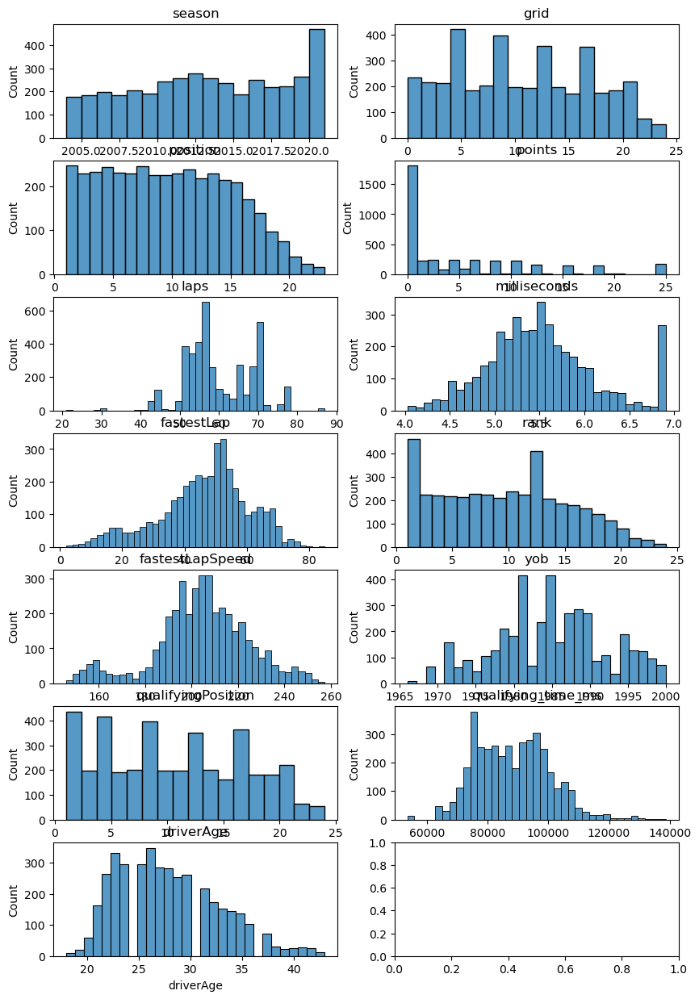

In [108]:
fig, ax = plt.subplots(7, 2, figsize=(10, 15))
for x, ax in zip(num_cols, ax.ravel()):
    ax.set_title(x)
    sns.histplot(X_train_enc[x],ax=ax)

In [109]:
columns_tf = ["grid", "points", "laps", "rank", "qualifyingPosition", "driverAge"]

X_train_tf = X_train_enc.copy()
X_test_tf = X_test_enc.copy()

def plot_tf(variable):
    col_tf = X_train_enc[variable]

    fig, ax = plt.subplots(2, 4, figsize=(15, 8))

    sns.histplot(col_tf, ax=ax[0, 0], kde=True)
    ax[0, 0].set_title("Default")
    
    sns.histplot(np.log(col_tf), ax=ax[0, 1], kde=True)
    ax[0, 1].set_title("log")
    
    sns.histplot(np.reciprocal(col_tf), ax=ax[0, 2], kde=True)
    ax[0, 2].set_title("reciprocal")
    
    sns.histplot(np.sqrt(col_tf), ax=ax[0, 3], kde=True)
    ax[0, 3].set_title("sqrt")
    
    sns.histplot(np.cbrt(col_tf) , ax=ax[1, 0], kde=True)
    ax[1, 0].set_title("cbrt")
    
    sns.histplot(np.power(col_tf, 0.3), ax=ax[1, 1], kde=True)
    ax[1, 1].set_title("power")
    
    sns.histplot(stats.yeojohnson(col_tf) , ax=ax[1, 2], kde=True)
    ax[1, 2].set_title("yeo")

    plt.show()

### 3.4.2 Comparing Transformations 

C:\ProgramData\anaconda3\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\ProgramData\anaconda3\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in reciprocal
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\ProgramData\anaconda3\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: invalid value encountered in reciprocal
  result = getattr(ufunc, method)(*inputs, **kwargs)


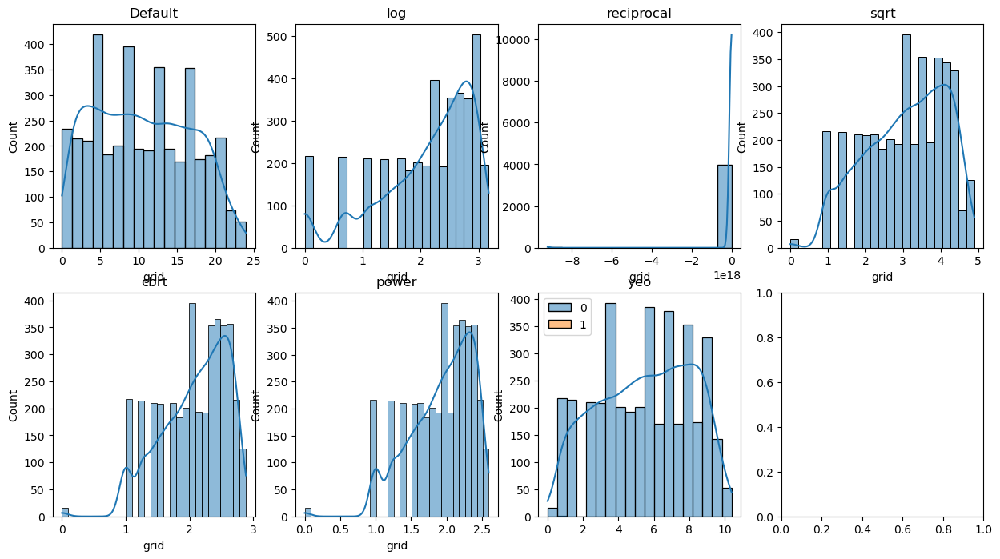

In [110]:
# Grid
plot_tf("grid")

# leave alone

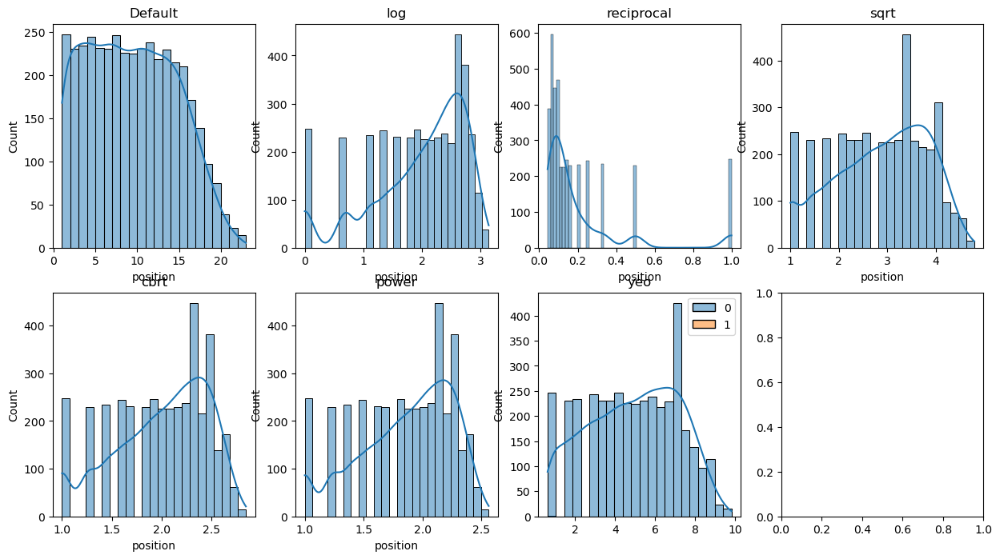

In [111]:
# Position
plot_tf("position")

# leave alone

C:\ProgramData\anaconda3\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
C:\ProgramData\anaconda3\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in reciprocal
  result = getattr(ufunc, method)(*inputs, **kwargs)


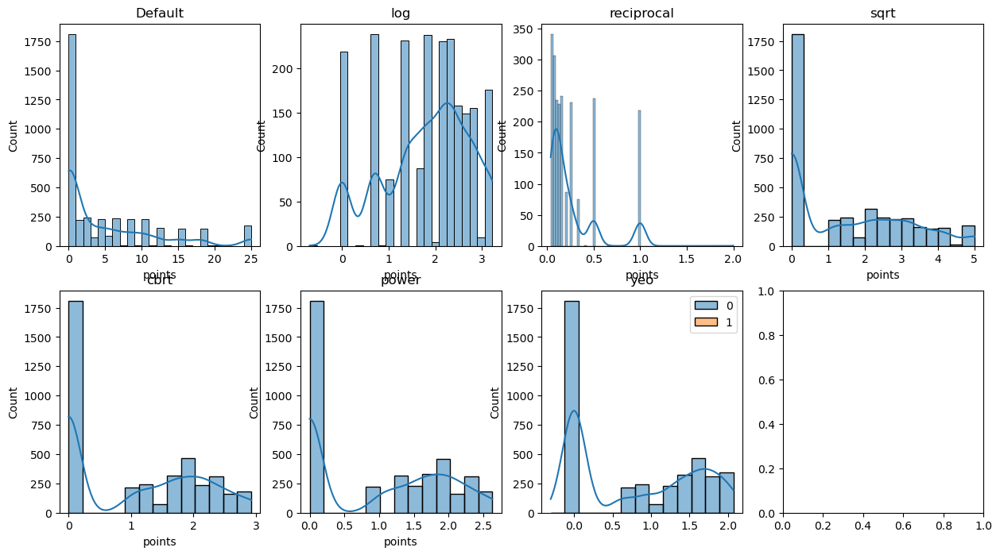

In [112]:
# Points
plot_tf("points")

# leave alone

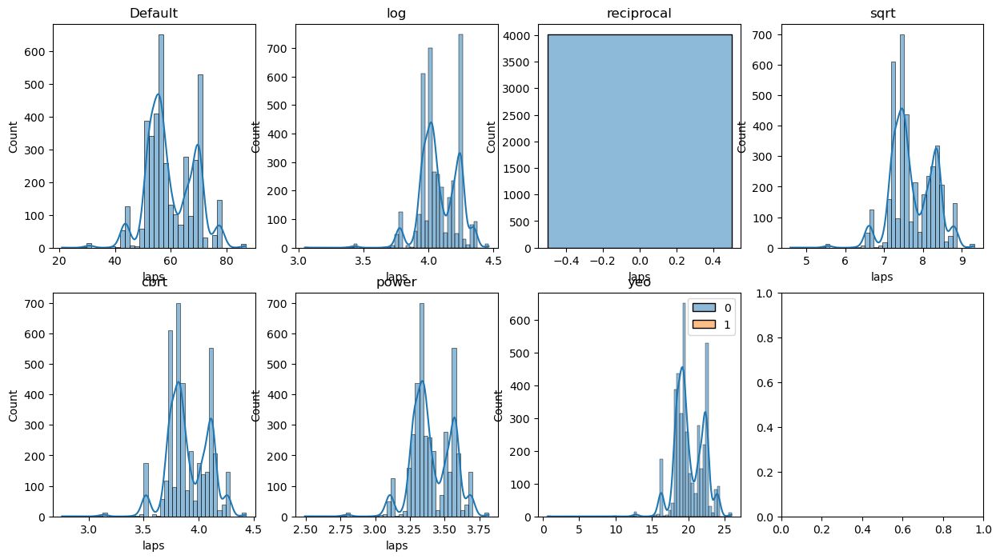

In [113]:
# Laps
plot_tf("laps")
# Best to leave alone

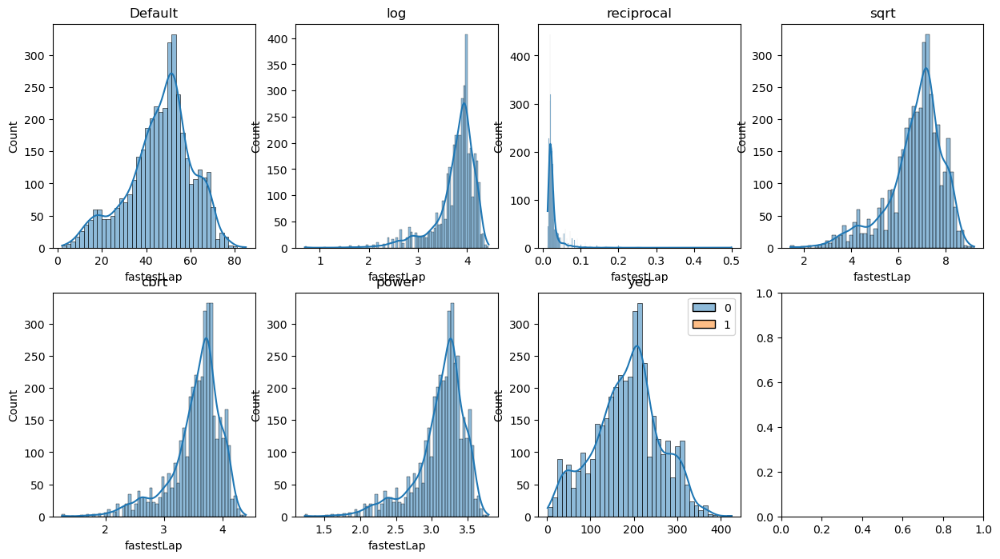

In [114]:
# fastestLap 
plot_tf("fastestLap")
# yeo

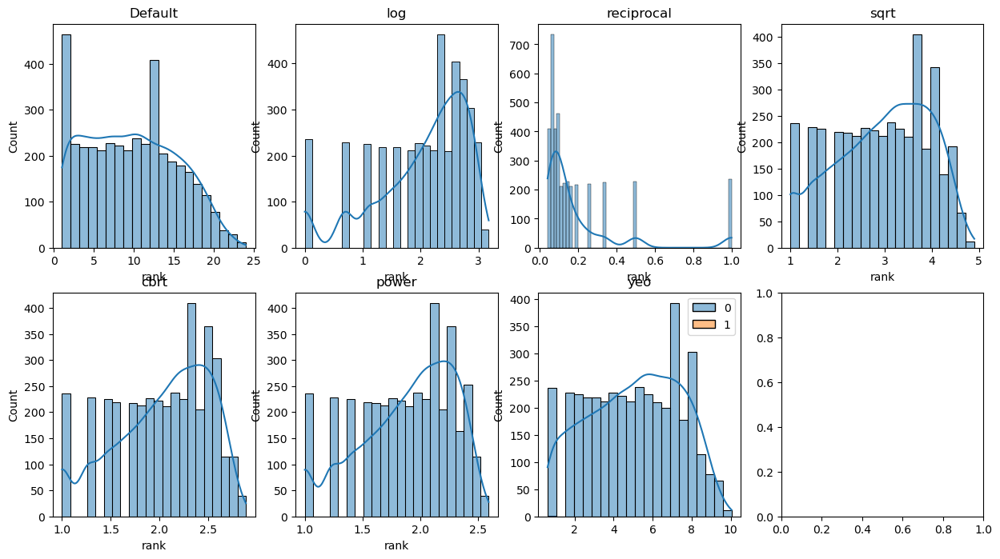

In [115]:
# laps 
plot_tf("rank")
# leave alone

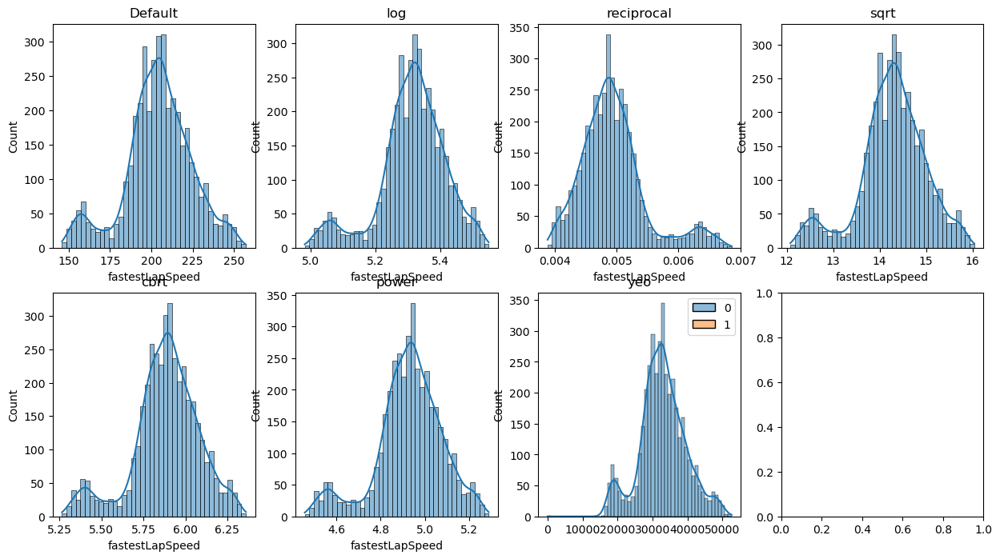

In [116]:
# fastestLapSpeed
plot_tf("fastestLapSpeed")
# best to leave alone

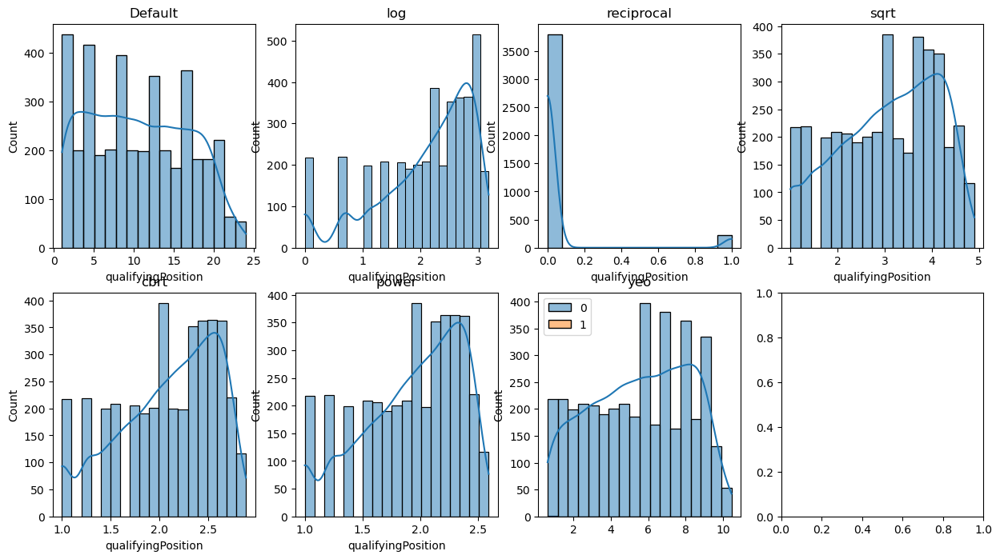

In [117]:
# qualifyingPosition
plot_tf("qualifyingPosition")
# leave alone

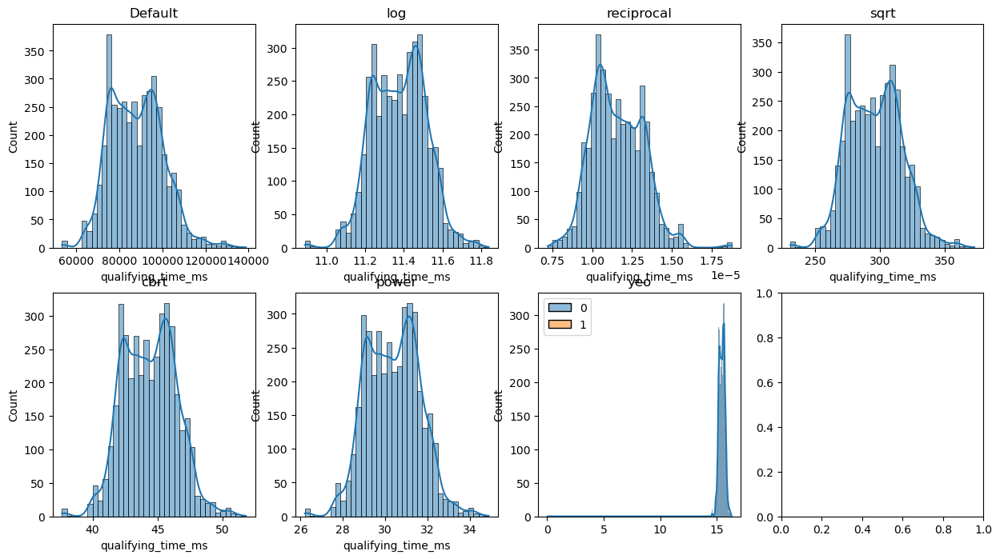

In [118]:
# qualifying_time_ms
plot_tf("qualifying_time_ms")
# log

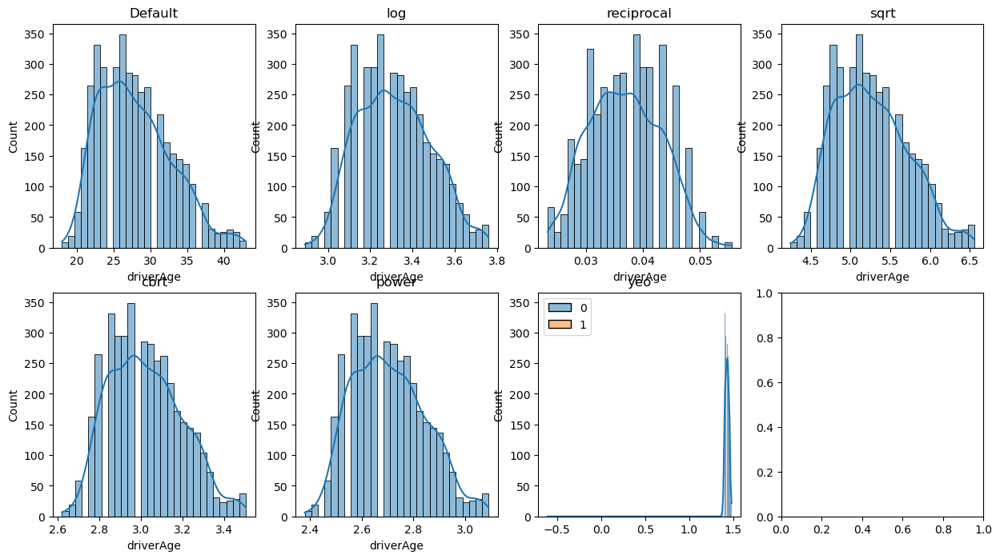

In [119]:
# driverAge
plot_tf("driverAge")
# Reciprocal

### 3.4.3 Transforming columns

In [120]:
# points
X_train_tf["points"] = np.cbrt(X_train_tf["points"])
X_test_tf["points"] = np.cbrt(X_test_tf["points"])

In [121]:
# fastestLap
X_train_tf["fastestLap"] = stats.yeojohnson(X_train_tf["fastestLap"])[0]
X_test_tf["fastestLap"] = stats.yeojohnson(X_test_tf["fastestLap"])[0]

In [122]:
# Rank
X_train_tf["rank"] = stats.yeojohnson(X_train_tf["rank"])[0]
X_test_tf["rank"] = stats.yeojohnson(X_test_tf["rank"])[0]

In [123]:
# qualifying_time_ms
X_train_tf["qualifying_time_ms"] = np.log(X_train_tf["qualifying_time_ms"])
X_test_tf["qualifying_time_ms"] = np.log(X_test_tf["qualifying_time_ms"])

In [124]:
# driverAge
X_train_tf["driverAge"] = np.reciprocal(X_train_tf["driverAge"])
X_test_tf["driverAge"] = np.reciprocal(X_test_tf["driverAge"])

In [125]:
X_train_tf

,raceId,circuitId,season,daylight,circuitName,resultId,driverId,constructorId,grid,position,points,laps,milliseconds,fastestLap,rank,fastestLapSpeed,driverName,yob,driverNationality,conName,conNationality,qualifyingPosition,qualifying_time_ms,driverAge
3435,862,17,2012.0,True,99994.800995,21288,4,6,9,9.0,1.259921,56,5824185.0,150.779982,6.199979,194.001,89703.976879,1981,0.073031,89430.096154,0.188435,9,11.471916,0.032258
3733,877,24,2012.0,True,102192.064327,21643,18,1,5,4.0,2.289428,55,6366454.0,199.678467,2.736776,191.273,90026.507353,1980,0.134347,89983.160000,0.257976,6,11.525743,0.031250
4305,908,9,2014.0,True,90601.100917,22322,813,208,20,17.0,0.000000,49,5090708.0,188.454669,7.594117,211.412,93217.787234,1985,0.011964,93966.556962,0.257976,15,11.551107,0.034483
4039,894,35,2013.0,True,104542.307692,21999,8,208,9,2.0,2.620741,55,6197925.0,205.364057,2.179776,198.225,88786.678788,1979,0.084497,93941.278481,0.257976,10,11.494568,0.029412
2825,345,12,2010.0,True,101122.411765,20530,24,10,14,16.0,0.000000,57,6080461.0,211.098064,6.915223,194.490,91241.236842,1980,0.053589,91905.053640,0.065304,14,11.501703,0.033333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5941,1017,34,2019.0,True,95593.000000,24359,826,5,19,14.0,0.000000,52,4761328.0,161.281597,7.594117,220.857,91306.000000,1994,0.029661,90944.550562,0.188435,16,11.424793,0.040000
4273,907,70,2014.0,True,69121.258333,22287,13,3,1,4.0,2.289428,71,5292334.0,277.230791,2.736776,214.553,91200.525316,1981,0.081505,90681.098143,0.257976,1,11.138363,0.030303
2662,17,24,2009.0,True,102209.637427,16075,3,3,9,9.0,0.000000,55,5689355.0,194.041823,7.258808,197.970,91609.379032,1985,0.177717,90604.190981,0.257976,9,11.519514,0.041667
3616,871,13,2012.0,True,110507.568862,21500,13,6,14,5.0,2.154435,44,5378375.0,97.096804,2.179776,222.223,90941.037975,1981,0.081505,89401.242788,0.188435,14,11.600451,0.032258


### 3.4.4 Evaluating Model after transformation

In [126]:
# Build Linear Regression Model
linear_tf = LinearRegression()
linear_tf.fit(X_train_tf, y_train)

print('train_rmse:', mean_squared_error(y_train, linear_tf.predict(X_train_tf), squared=False), 
      '\ntest_rmse:', mean_squared_error(y_test, linear_tf.predict(X_test_tf), squared=False))

print('train_mae:', mean_absolute_error(y_train, linear_tf.predict(X_train_tf)))
print('test_mae:', mean_absolute_error(y_test, linear_tf.predict(X_test_tf)))

print('train_r-sq:', r2_score(y_train, linear_tf.predict(X_train_tf)), 
      '\ntest_r-sq:', r2_score(y_test, linear_tf.predict(X_test_tf)))

train_rmse: 2123.657087807578 
test_rmse: 2234.9576840189225
train_mae: 1398.5810017200577
test_mae: 1426.9555493451892
train_r-sq: 0.9674264107621807 
test_r-sq: 0.965080011609811


## 3.5 Variable Discretisation

### 3.5.1 Equal Width Discretisation

In [127]:
# Variables to be discretised
disc_vars = ["season", "yob"]

# Creating the Equal Width Discretiser
disc_width = EqualWidthDiscretiser(bins=8, variables=disc_vars)

# Fitting the X_train
disc_width.fit(X_train_tf)

EqualWidthDiscretiser(bins=8, variables=['season', 'yob'])

In [128]:
# Discretisation
X_train_disc_width = disc_width.transform(X_train_tf)
X_test_disc_width = disc_width.transform(X_test_tf)

Text(0.5, 1.0, 'Equal Width Discretisation')

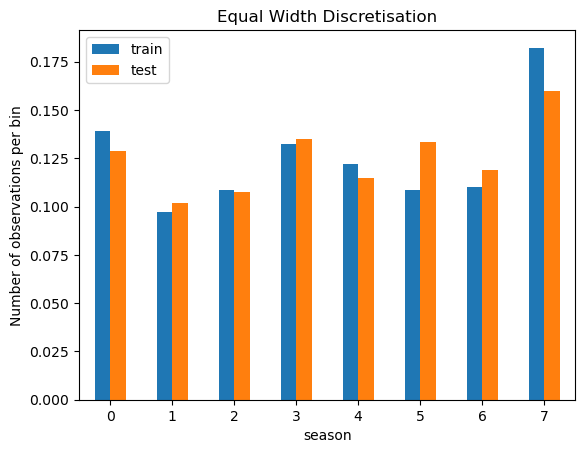

In [129]:
# Plotting frequency distributions of Train and Test set.
test = X_train_disc_width.groupby(['season'])['season'].count() / len(X_train_disc_width)
train = X_test_disc_width.groupby(['season'])['season'].count() / len(X_test_disc_width)

# concatenate aggregated views
tmp = pd.concat([test, train], axis=1)
tmp.columns = ['train', 'test']

# plot
tmp.plot.bar()
plt.xticks(rotation=0)
plt.ylabel('Number of observations per bin')
plt.title("Equal Width Discretisation")

### 3.5.2 Equal Frequency Discretisation

In [130]:
# Creating the Equal Width Discretiser
disc_frequency = EqualFrequencyDiscretiser(q=10, variables=disc_vars)

# Fitting the X_train
disc_frequency.fit(X_train_tf)

EqualFrequencyDiscretiser(variables=['season', 'yob'])

In [131]:
# Discretisation
X_train_disc_frequency = disc_frequency.transform(X_train_tf)
X_test_disc_frequency = disc_frequency.transform(X_test_tf)

Text(0.5, 1.0, 'Equal Frequency Discretisation')

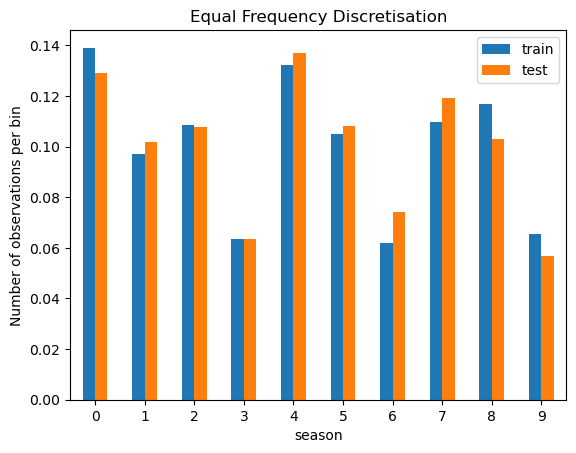

In [132]:
# Plotting frequency distributions of Train and Test set.
test = X_train_disc_frequency.groupby(['season'])['season'].count() / len(X_train_disc_frequency)
train = X_test_disc_frequency.groupby(['season'])['season'].count() / len(X_test_disc_frequency)

# concatenate aggregated views
tmp = pd.concat([test, train], axis=1)
tmp.columns = ['train', 'test']

# plot
tmp.plot.bar()
plt.xticks(rotation=0)
plt.ylabel('Number of observations per bin')
plt.title("Equal Frequency Discretisation")

### 3.5.3 Evaluating model performance after discretisation between Equal Width and Equal Frequency

In [133]:
# Equal Width Discretisation

# Build Linear Regression Model
linear_disc_width = LinearRegression()
linear_disc_width.fit(X_train_disc_width, y_train)

print("Equal Width Discretisation: ")

print('train_rmse:', mean_squared_error(y_train, linear_disc_width.predict(X_train_disc_width), squared=False), 
      '\ntest_rmse:', mean_squared_error(y_test, linear_disc_width.predict(X_test_disc_width), squared=False))

print('train_mae:', mean_absolute_error(y_train, linear_disc_width.predict(X_train_disc_width)))
print('test_mae:', mean_absolute_error(y_test, linear_disc_width.predict(X_test_disc_width)))

print('train_r-sq:', r2_score(y_train, linear_disc_width.predict(X_train_disc_width)), 
      '\ntest_r-sq:', r2_score(y_test, linear_disc_width.predict(X_test_disc_width)))

Equal Width Discretisation: 
train_rmse: 2112.2983770278192 
test_rmse: 2228.03165285467
train_mae: 1392.4633450550768
test_mae: 1423.637873573604
train_r-sq: 0.9677739287264602 
test_r-sq: 0.9652961071339631


In [134]:
# Equal Frequency Discretisation

# Build Linear Regression Model
linear_disc_freq = LinearRegression()
linear_disc_freq.fit(X_train_disc_frequency, y_train)

print("Equal Frequency Discretisation: ")

print('train_rmse:', mean_squared_error(y_train, linear_disc_freq.predict(X_train_disc_frequency), squared=False), 
      '\ntest_rmse:', mean_squared_error(y_test, linear_disc_freq.predict(X_test_disc_frequency), squared=False))

print('train_mae:', mean_absolute_error(y_train, linear_disc_freq.predict(X_train_disc_frequency)))
print('test_mae:', mean_absolute_error(y_test, linear_disc_freq.predict(X_test_disc_frequency)))

print('train_r-sq:', r2_score(y_train, linear_disc_freq.predict(X_train_disc_frequency)), 
      '\ntest_r-sq:', r2_score(y_test, linear_disc_freq.predict(X_test_disc_frequency)))

Equal Frequency Discretisation: 
train_rmse: 2112.8917011465073 
test_rmse: 2233.335169458342
train_mae: 1389.569364676043
test_mae: 1419.1727836976943
train_r-sq: 0.9677558222023751 
test_r-sq: 0.9651306950065669


## 3.6 Feature Creation

In [135]:
X_train_fe = X_train_disc_width.copy()
X_test_fe = X_test_disc_width.copy()

### 3.6.1 Average Lap Time 

In [136]:
avg_lap_time_ms_train = X_train_imputed["milliseconds"] / X_train_imputed["laps"]
avg_lap_time_ms_test = X_test_imputed["milliseconds"] / X_test_imputed["laps"]


avg_lap_time_ms_train[:5]

3435    104003.303571
3733    115753.709091
4305    103892.000000
4039    112689.545455
2825    106674.754386
dtype: float64

In [137]:
# Creating the column in current dataset
X_train_fe["avg_lap_time_ms"] = avg_lap_time_ms_train
X_test_fe["avg_lap_time_ms"] = avg_lap_time_ms_test

### 3.6.2 Driver Experience

In [138]:
driver_experience_train = []
driver_experience_test = []

for index, row in X_train_imputed.iterrows():
    driver = row["driverName"]
    season = row["season"]

    # Get the number of races that the driver has participated in previous seasons
    driver_experience_train.append(X_train_imputed.loc[(X_train_imputed["driverName"] == driver) & (X_train_imputed["season"] < season)].shape[0])

for index, row in X_test_imputed.iterrows():
    driver = row["driverName"]
    season = row["season"]

    # Get the number of races that the driver has participated in previous seasons
    driver_experience_test.append(X_test_imputed.loc[(X_test_imputed["driverName"] == driver) & (X_test_imputed["season"] < season)].shape[0])

driver_experience_train[:5]

[89, 80, 31, 72, 24]

In [139]:
# Double checking with first row
X_train_imputed.loc[(X_train_imputed["driverName"] == "Fernando Alonso") & (X_train_imputed["season"] < 2012)].shape[0]

89

In [140]:
# Creating the column in current dataset
X_train_fe["driverExperience"] = driver_experience_train
X_test_fe["driverExperience"] = driver_experience_test

### 3.6.3 Evaluating Model Performance after Feature Engineering

In [141]:
linear_engineer = LinearRegression()
linear_engineer.fit(X_train_fe, y_train)

print("Model performance after Feature Engineering: ")

print('train_rmse:', mean_squared_error(y_train, linear_engineer.predict(X_train_fe), squared=False)) 
print('test_rmse:', mean_squared_error(y_test, linear_engineer.predict(X_test_fe), squared=False))

print('train_mae:', mean_absolute_error(y_train, linear_engineer.predict(X_train_fe)))
print('test_mae:', mean_absolute_error(y_test, linear_engineer.predict(X_test_fe)))

print('train_r-sq:', r2_score(y_train, linear_engineer.predict(X_train_fe))) 
print('test_r-sq:', r2_score(y_test, linear_engineer.predict(X_test_fe)))

Model performance after Feature Engineering: 
train_rmse: 2073.544944080591
test_rmse: 2215.5965775695613
train_mae: 1413.761648613829
test_mae: 1453.8433849549153
train_r-sq: 0.9689455573715658
test_r-sq: 0.9656824043846731


## 3.7 Feature Scaling

In [142]:
# Function to plot before and after scaling

def plot_scaling(after, scaling):
    # Comparing variable distributions before and after Standard Scaling
    
    fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 5))

    fig.suptitle(scaling)
    
    # before scaling
    ax1.set_title('Before Scaling')
    sns.kdeplot(X_train_fe['milliseconds'], ax=ax1, label ='milliseconds')
    sns.kdeplot(X_train_fe['qualifying_time_ms'], ax=ax1, label ='qualifying_time_ms')
    sns.kdeplot(X_train_fe['fastestLapSpeed'], ax=ax1, label ='fastestLapSpeed')
    ax1.legend()
    
    # after scaling
    ax2.set_title('After Scaling')
    sns.kdeplot(after['milliseconds'], ax=ax2, label ='milliseconds')
    sns.kdeplot(after['qualifying_time_ms'], ax=ax2, label ='qualifying_time_ms')
    sns.kdeplot(after['fastestLapSpeed'], ax=ax2, label ='fastestLapSpeed')
    ax2.legend()
    plt.show()    

### 3.7.1 Standardisation

In [143]:
# Create an instance of StandardScaler
scaler = StandardScaler()

# Fitting the StandardScaler to continuous variables of X_train
scaler.fit(X_train_fe)

# Transforming the X_train and X_test continuous variables, converting it to DataFrame.
X_train_ss = pd.DataFrame(scaler.transform(X_train_fe), index=X_train_fe.index, columns=X_train_fe.columns)
X_test_ss = pd.DataFrame(scaler.transform(X_test_fe), index=X_test_fe.index, columns=X_test_fe.columns)

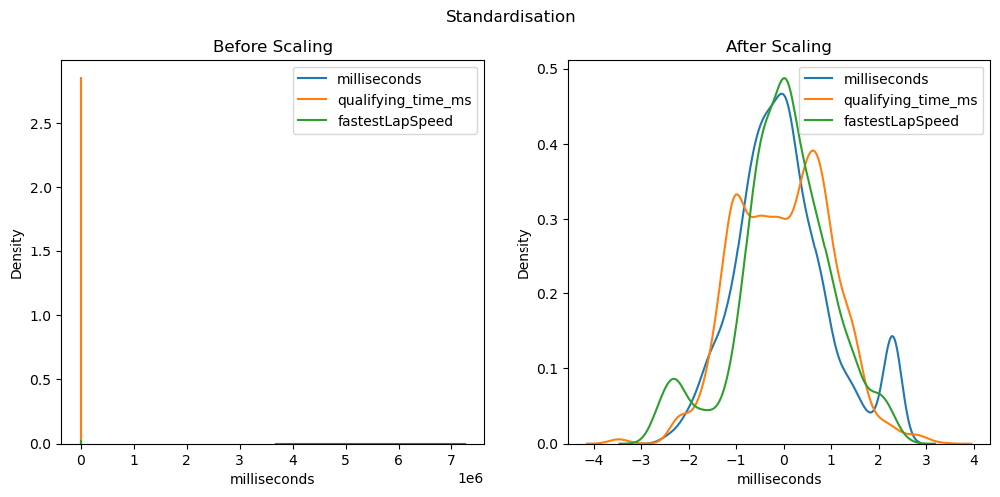

In [144]:
plot_scaling(X_train_ss, "Standardisation")

### 3.7.2 MinMaxScaling

In [145]:
# set up the scaler
mmscaler = MinMaxScaler()

# fit the scaler to the train set, it will learn the parameters
mmscaler.fit(X_train_fe)

# transform train and test sets
X_train_mm = pd.DataFrame(mmscaler.transform(X_train_fe), index=X_train_fe.index, columns=X_train_fe.columns)
X_test_mm = pd.DataFrame(mmscaler.transform(X_test_fe), index=X_test_fe.index, columns=X_test_fe.columns)

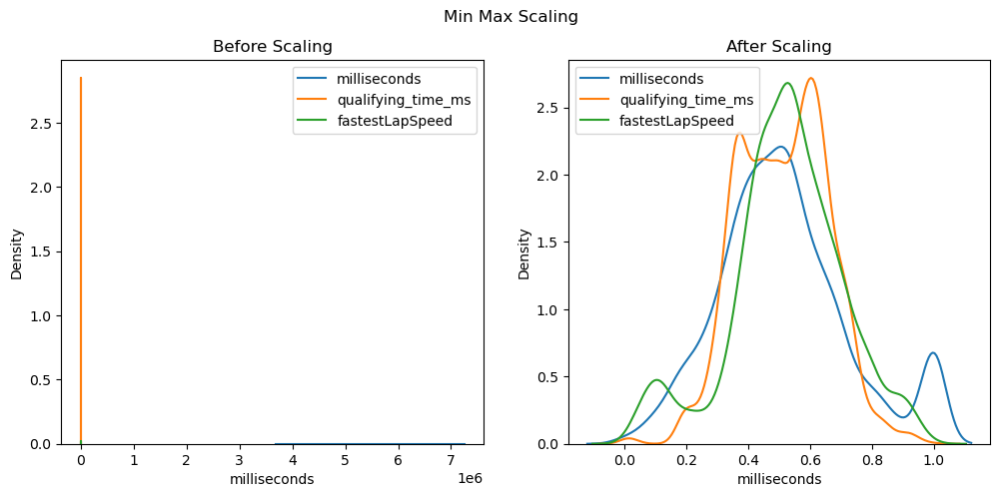

In [146]:
# Plot before and after
plot_scaling(X_train_mm, "Min Max Scaling")

### 3.7.3 Robust-Scaling

In [147]:
# set up the scaler
rsscaler = RobustScaler()

# fit the scaler to the train set, it will learn the parameters
rsscaler.fit(X_train_fe)

# transform train and test sets
X_train_rs = pd.DataFrame(rsscaler.transform(X_train_fe), index=X_train_fe.index, columns=X_train_fe.columns)
X_test_rs = pd.DataFrame(rsscaler.transform(X_test_fe), index=X_test_fe.index, columns=X_test_fe.columns)

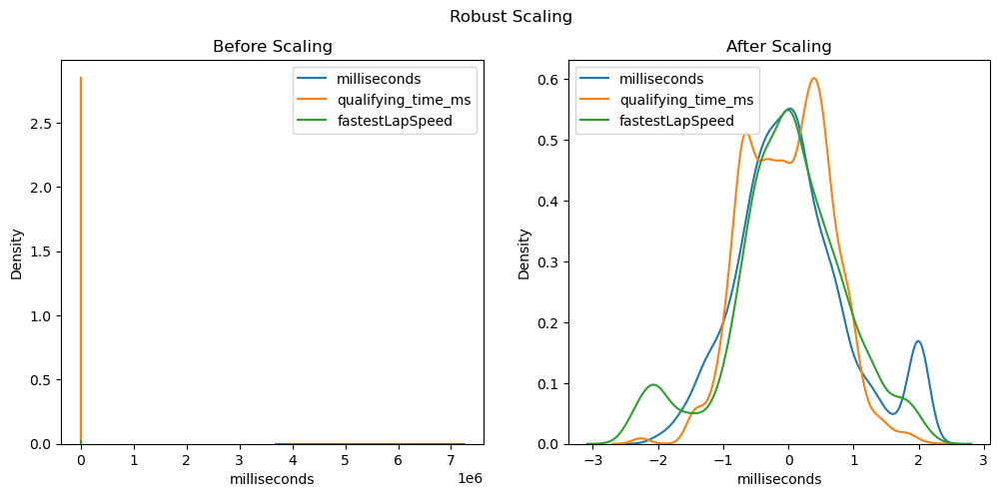

In [148]:
# Plot before and after
plot_scaling(X_train_rs, "Robust Scaling")

### 3.7.4 Evaluating Model performance of different scaling methods

In [149]:
# Create lists of respective scaling method names, train data, test data
names = ["Standardisation", "Min Max Scaling", "Robust Scaling"]
scaled_trains = [X_train_ss, X_train_mm, X_train_rs]
scaled_tests = [X_test_ss, X_test_mm, X_test_rs]

for name, train, test in zip(names, scaled_trains, scaled_tests):
    # Build Linear Regression Model
    linear_scaled = LinearRegression()
    linear_scaled.fit(train, y_train)
    
    print(name + ": ")
    
    print('train_rmse:', mean_squared_error(y_train, linear_scaled.predict(train), squared=False), 
          '\ntest_rmse:', mean_squared_error(y_test, linear_scaled.predict(test), squared=False))
    
    print('train_mae:', mean_absolute_error(y_train, linear_scaled.predict(train)))
    print('test_mae:', mean_absolute_error(y_test, linear_scaled.predict(test)))
    
    print('train_r-sq:', r2_score(y_train, linear_scaled.predict(train)), 
          '\ntest_r-sq:', r2_score(y_test, linear_scaled.predict(test)))

    print("\n")

Standardisation: 
train_rmse: 2073.5449440805905 
test_rmse: 2215.5965775678806
train_mae: 1413.7616486133672
test_mae: 1453.8433849542182
train_r-sq: 0.9689455573715658 
test_r-sq: 0.9656824043847252


Min Max Scaling: 
train_rmse: 2073.544944080591 
test_rmse: 2215.59657756788
train_mae: 1413.7616486133677
test_mae: 1453.8433849542187
train_r-sq: 0.9689455573715658 
test_r-sq: 0.9656824043847252


Robust Scaling: 
train_rmse: 2073.5449440805905 
test_rmse: 2215.5965775678774
train_mae: 1413.7616486133695
test_mae: 1453.8433849542175
train_r-sq: 0.9689455573715658 
test_r-sq: 0.9656824043847253




## 3.8 Polynomial Expansion

### 3.8.1 Identifying features to expand

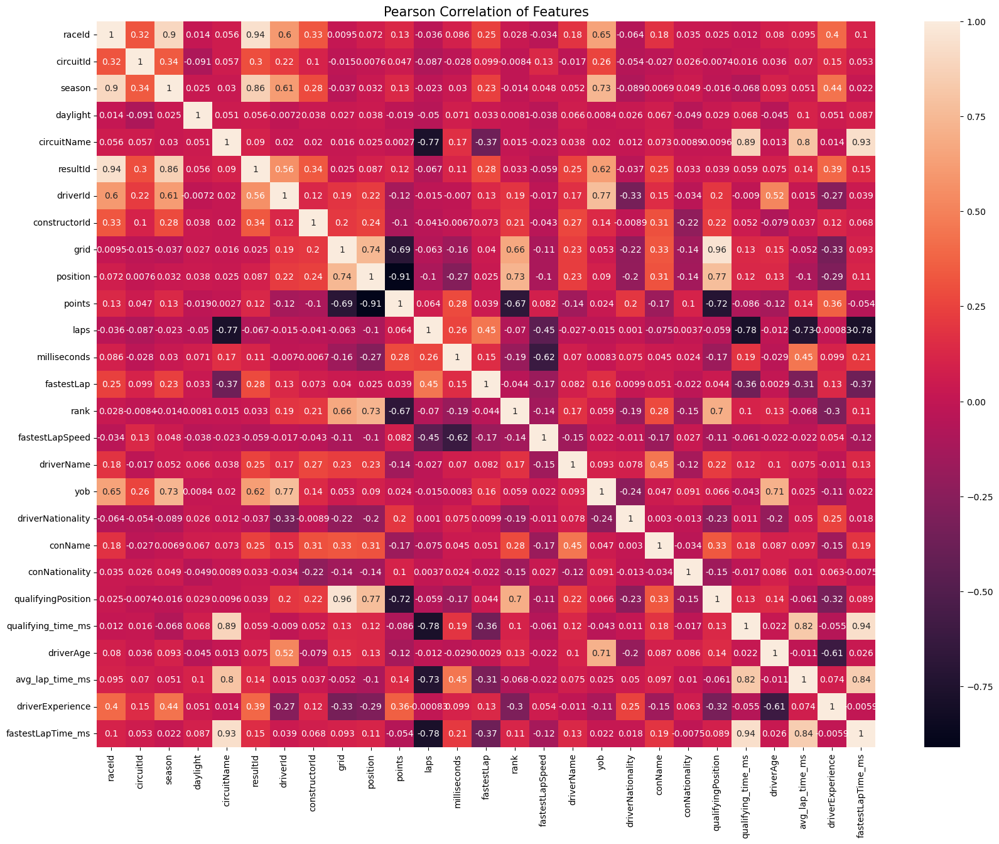

In [150]:
plt.figure(figsize=(20,15))
plt.title('Pearson Correlation of Features', size=15)
ax = sns.heatmap(pd.concat([X_train_rs, y_train], axis=1).corr(), annot=True)

plt.show()

In [151]:
# Dropping columns with high correlation between each other > 0.9
corr = X_train_rs.corr()
m = (corr.mask(np.eye(len(corr), dtype=bool)).abs() > 0.9).any()

X_train_rs.loc[:, m]

,raceId,resultId,grid,position,points,qualifyingPosition
3435,-0.026959,-0.035752,-0.090909,0.000,0.129961,-0.090909
3733,-0.010110,-0.013621,-0.454545,-0.625,0.644714,-0.363636
4305,0.024712,0.028708,0.909091,1.000,-0.500000,0.454545
4039,0.008986,0.008572,-0.090909,-0.875,0.810371,0.000000
2825,-0.607694,-0.083006,0.363636,0.875,-0.500000,0.363636
...,...,...,...,...,...,...
5941,0.147150,0.155695,0.818182,0.625,-0.500000,0.545455
4273,0.023589,0.026526,-0.818182,-0.625,0.644714,-0.818182
2662,-0.976130,-0.360732,-0.090909,0.000,-0.500000,-0.090909
3616,-0.016849,-0.022536,0.363636,-0.500,0.577217,0.363636


In [152]:
X_train_rs = X_train_rs.drop(["raceId", "grid"], axis=1)
X_test_rs = X_test_rs.drop(["raceId", "grid"], axis=1)

<Axes: >

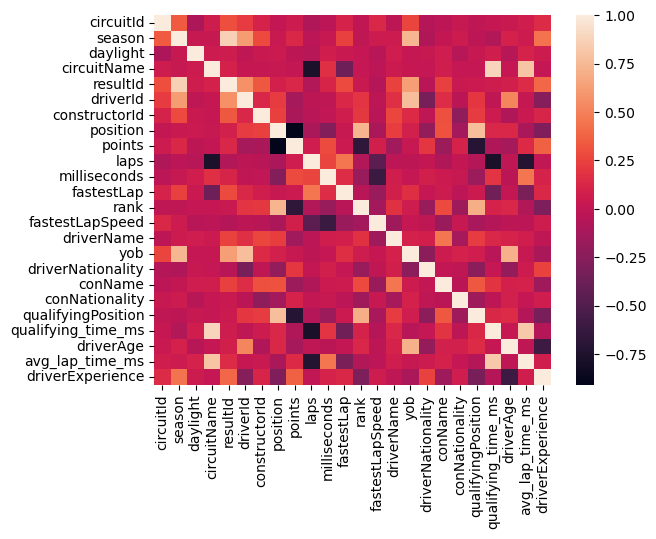

In [153]:
# Correlations between features are lower now!
sns.heatmap(X_train_rs.corr())

### 3.8.2 Understanding relationship of chosen columns with target

In [154]:
cols_to_poly = ["conName", "driverName", "milliseconds", "avg_lap_time_ms", 
                "qualifying_time_ms", "fastestLap", "laps", "circuitName"]

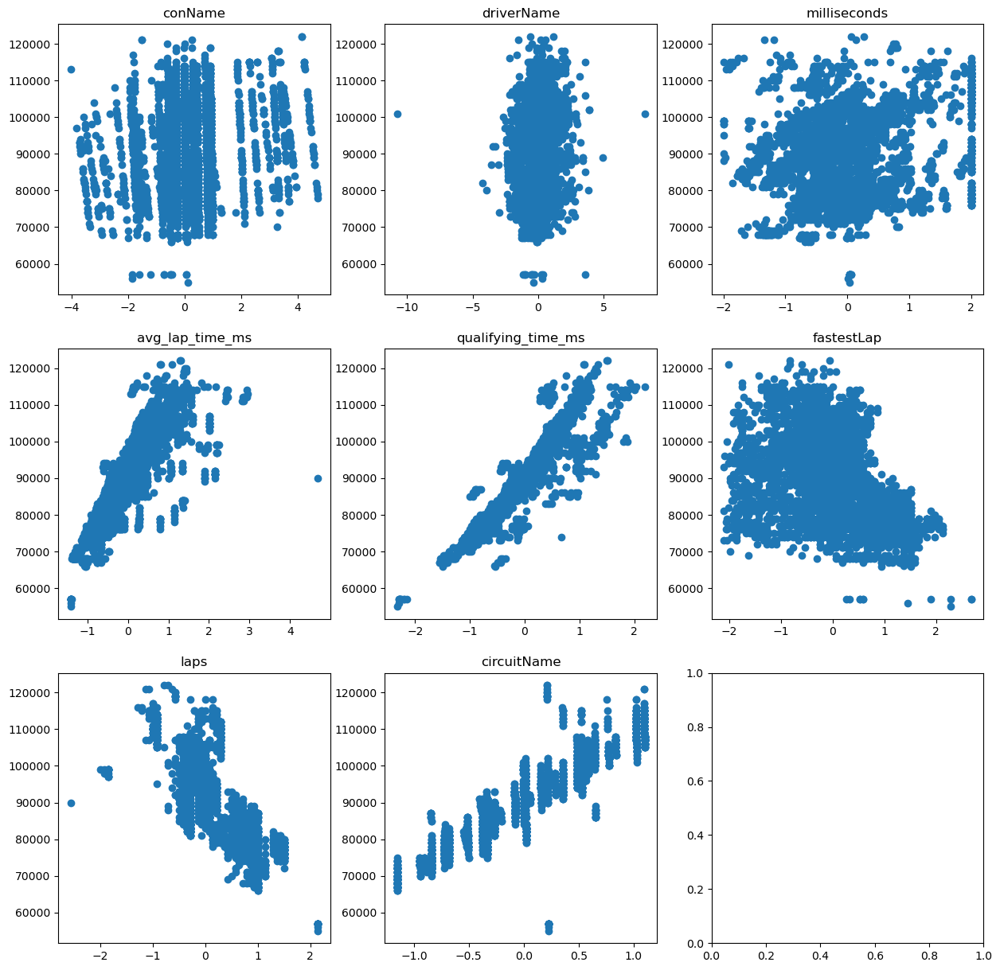

In [155]:
fig, ax = plt.subplots(3, 3, figsize=(15,15))

for c, ax in zip(cols_to_poly, ax.ravel()):
    ax.scatter(X_train_rs[c], y_train)
    ax.set_title(c)

### 3.8.3 Transforming features with PolynomialFeatures

In [156]:
# Create Instance of SK-Learns PolynomialFeatures class
poly = PolynomialFeatures(degree=3, interaction_only=False, include_bias=False)

# Fitting to the X_train
poly.fit(X_train_rs[cols_to_poly])

# 219 new features
poly_cols = poly.get_feature_names_out()
len(poly_cols)

164

In [157]:
# Transforming X_train and X_test, then converting to pandas dataframe
poly_train = pd.DataFrame(poly.transform(X_train_rs[cols_to_poly]),
                          columns=poly_cols, index=X_train_rs.index)

poly_test = pd.DataFrame(poly.transform(X_test_rs[cols_to_poly]),
                         columns=poly_cols, index=X_test_rs.index)

### 3.8.4 Identify and drop polynomial expanded columns with low correlation to target

In [158]:
# Concatenating poly_train and target variable, to see their correlations.
poly_corr_train = pd.concat([poly_train, y_train], axis=1).corr()

# using .loc[] to identify correlations in between -0.8 and 0.8.
least_poly_train = poly_corr_train.loc[(poly_corr_train["fastestLapTime_ms"] > -0.75) & (poly_corr_train["fastestLapTime_ms"] < 0.75)]["fastestLapTime_ms"]

least_poly_train

conName                        0.187662
driverName                     0.132469
milliseconds                   0.211259
fastestLap                    -0.365331
conName^2                      0.073795
                                 ...   
fastestLap laps circuitName    0.393997
fastestLap circuitName^2      -0.461399
laps^3                        -0.532704
laps^2 circuitName             0.703975
laps circuitName^2            -0.732547
Name: fastestLapTime_ms, Length: 157, dtype: float64

In [159]:
# Dropping unimportant features
poly_train = poly_train.drop(least_poly_train.index, axis=1)
poly_test = poly_test.drop(least_poly_train.index, axis=1)

### 3.8.5 Merging expanded columns with original dataframe

In [160]:
X_train_poly = pd.concat([X_train_rs, poly_train], axis=1)
X_test_poly = pd.concat([X_test_rs, poly_test], axis=1)

In [161]:
X_train_poly.head()

,circuitId,season,daylight,circuitName,resultId,driverId,constructorId,position,points,laps,milliseconds,fastestLap,rank,fastestLapSpeed,driverName,yob,driverNationality,conName,conNationality,qualifyingPosition,qualifying_time_ms,driverAge,avg_lap_time_ms,driverExperience,avg_lap_time_ms,qualifying_time_ms,laps,circuitName,avg_lap_time_ms circuitName^2,qualifying_time_ms circuitName^2,circuitName^3
3435,0.266667,-0.25,0.0,0.527207,-0.035752,-0.032178,-0.063830,0.000,0.129961,-0.071429,0.500314,-0.427689,0.207359,-0.471910,-0.107694,-0.5,0.000000,-0.293148,0.491848,-0.090909,0.445437,-0.507937,0.530293,1.30,0.530293,0.445437,-0.071429,0.527207,0.147394,0.123808,0.146536
3733,0.733333,-0.25,0.0,0.646682,-0.013621,-0.014851,-0.170213,-0.625,0.644714,-0.142857,1.253979,0.127414,-0.737955,-0.591316,-0.002508,-0.5,0.668478,-0.020994,0.870924,-0.363636,0.699879,-0.615079,1.086110,1.12,1.086110,0.699879,-0.142857,0.646682,0.454209,0.292688,0.270441
4305,-0.266667,0.00,0.0,0.016430,0.028708,0.969059,4.234043,1.000,-0.500000,-0.571429,-0.519098,0.000000,0.587902,0.290176,1.038259,0.0,-0.665761,1.939170,0.870924,0.454545,0.819776,-0.271483,0.525028,0.14,0.525028,0.819776,-0.571429,0.016430,0.000142,0.000221,0.000004
4039,1.466667,0.00,0.0,0.774476,0.008572,-0.027228,4.234043,-0.875,0.810371,-0.142857,1.019752,0.191958,-0.889994,-0.287024,-0.406851,-0.5,0.125000,1.926731,0.870924,0.000000,0.552514,-0.810458,0.941169,0.96,0.941169,0.552514,-0.142857,0.774476,0.564525,0.331405,0.464540
2825,-0.066667,-0.50,0.0,0.588521,-0.083006,-0.007426,0.021277,0.875,-0.500000,0.000000,0.856496,0.257052,0.402591,-0.450507,0.393650,-0.5,-0.211957,0.924738,-0.179348,0.363636,0.586240,-0.393651,0.656658,0.00,0.656658,0.586240,0.000000,0.588521,0.227438,0.203048,0.203838


### 3.8.6 Evaluating model performance after Polynomial Expansion

In [162]:
linear_poly = LinearRegression()
linear_poly.fit(X_train_poly, y_train)

print("Model performance after Polynomial Expansion: ")

print('train_rmse:', mean_squared_error(y_train, linear_poly.predict(X_train_poly), squared=False)) 
print('test_rmse:', mean_squared_error(y_test, linear_poly.predict(X_test_poly), squared=False))

print('train_mae:', mean_absolute_error(y_train, linear_poly.predict(X_train_poly)))
print('test_mae:', mean_absolute_error(y_test, linear_poly.predict(X_test_poly)))

print('train_r-sq:', r2_score(y_train, linear_poly.predict(X_train_poly))) 
print('test_r-sq:', r2_score(y_test, linear_poly.predict(X_test_poly)))

Model performance after Polynomial Expansion: 
train_rmse: 2029.2598088093903
test_rmse: 2148.473269551023
train_mae: 1378.0447247781065
test_mae: 1391.993102414227
train_r-sq: 0.9702578650143031
test_r-sq: 0.967730265621901


## 3.9 PCA

### 3.9.1 Instantiating PCA

In [163]:
pca_test = PCA()

In [164]:
pca_test.fit(X_train_poly)

PCA()

### 3.9.2 Identifying optimal number of components

Text(0, 0.5, 'Percentage of Variance Explained')

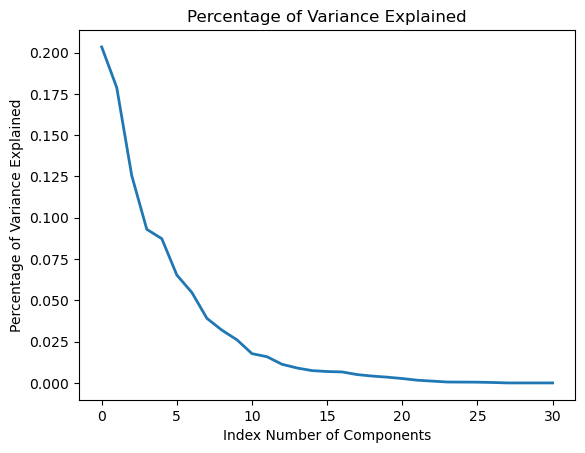

In [165]:
# Identifying the number of informative components

plt.plot(pca_test.explained_variance_ratio_, linewidth=2)
plt.title('Percentage of Variance Explained')
plt.xlabel('Index Number of Components')
plt.ylabel('Percentage of Variance Explained')

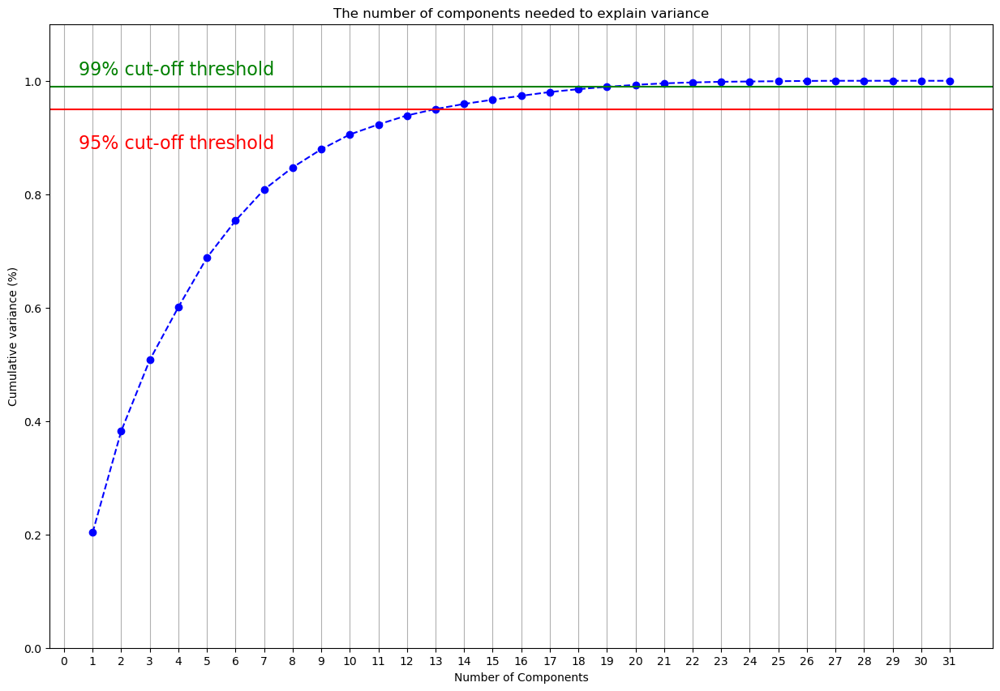

In [166]:
fig, ax = plt.subplots(figsize=(15, 10))
xi = np.arange(1, len(X_train_poly.columns) + 1, step=1)
y = np.cumsum(pca_test.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, y, marker='o', linestyle='--', color='b')

plt.xlabel('Number of Components')
plt.xticks(np.arange(0, len(X_train_poly.columns) + 1, step=1)) #change from 0-based array index to 1-based human-readable label
plt.ylabel('Cumulative variance (%)')
plt.title('The number of components needed to explain variance')

plt.axhline(y=0.95, color='r', linestyle='-')
plt.text(0.5, 0.88, '95% cut-off threshold', color = 'red', fontsize=16)

plt.axhline(y=0.99, color='g', linestyle='-')
plt.text(0.5, 1.01, '99% cut-off threshold', color = 'g', fontsize=16)

ax.grid(axis='x')
plt.show()

### 3.9.3 Instantiating PCA with number of components and Evaluating Model Performance

In [167]:
pca = PCA(14)

pca.fit(X_train_poly)

X_train_pca = pca.transform(X_train_poly)
X_test_pca = pca.transform(X_test_poly)

In [168]:
linear_pca = LinearRegression()
linear_pca.fit(X_train_pca, y_train)

print("Model performance after PCA: ")

print('train_rmse:', mean_squared_error(y_train, linear_pca.predict(X_train_pca), squared=False)) 
print('test_rmse:', mean_squared_error(y_test, linear_pca.predict(X_test_pca), squared=False))

print('train_mae:', mean_absolute_error(y_train, linear_pca.predict(X_train_pca)))
print('test_mae:', mean_absolute_error(y_test, linear_pca.predict(X_test_pca)))

print('train_r-sq:', r2_score(y_train, linear_pca.predict(X_train_pca))) 
print('test_r-sq:', r2_score(y_test, linear_pca.predict(X_test_pca)))

Model performance after PCA: 
train_rmse: 2360.807151799414
test_rmse: 2893.0032114995233
train_mae: 1568.4461281559036
test_mae: 1621.836611264474
train_r-sq: 0.9597451829819902
test_r-sq: 0.9414895669218513


# 4 Machine Learning Modelling

## 4.1 Final Dataframe

In [169]:
X_train_final = X_train_poly.copy()
X_test_final = X_test_poly.copy()

In [170]:
# Shape of train and test dataframes
print(X_train_final.shape, X_test_final.shape)

(4012, 31) (1729, 31)


## 4.2 Naïve Baseline model

### Getting mean of target value

In [171]:
# pick the mean target value from all of train data
mean_target_value = y_train.mean()

print(f"The train mean target value is {mean_target_value}.")

The train mean target value is 90091.11490528415.


In [172]:
y_pred_naive_train = [round(mean_target_value,2) for row in X_train_final.iloc[:,0]]
y_pred_naive_test = [round(mean_target_value,2) for row in X_test_final.iloc[:,0]]

In [173]:
print("Naive Baseline model performance:   ")

print(f"The Naive Baseline Model's MSE on train data is {mean_squared_error(y_train, y_pred_naive_train):.2f}.")
print(f"The Naive Baseline Model's MSE on train data is {mean_squared_error(y_test, y_pred_naive_test):.2f}.")

print(f"The Naive Baseline Model's RMSE on train data is {mean_squared_error(y_train, y_pred_naive_train, squared=False)}.")
print(f"The Naive Baseline Model's RMSE on train data is {mean_squared_error(y_test, y_pred_naive_test, squared=False)}.")

print("The Naive Baseline Models MAE on train data is ", mean_absolute_error(y_train, y_pred_naive_train))
print("The Naive Baseline Models MAE on test data is ", mean_absolute_error(y_test, y_pred_naive_test))

print(f"The Naive Baseline Model's R2 on test data is {r2_score(y_train, y_pred_naive_train)}.")
print(f"The Naive Baseline Model's R2 on test data is {r2_score(y_test, y_pred_naive_test)}.")

Naive Baseline model performance:   
The Naive Baseline Model's MSE on train data is 138453254.07.
The Naive Baseline Model's MSE on train data is 143253890.96.
The Naive Baseline Model's RMSE on train data is 11766.616083918618.
The Naive Baseline Model's RMSE on train data is 11968.871749833255.
The Naive Baseline Models MAE on train data is  9970.875633100699
The Naive Baseline Models MAE on test data is  10055.701486408327
The Naive Baseline Model's R2 on test data is -1.7408297026122455e-13.
The Naive Baseline Model's R2 on test data is -0.0014791405263872015.


## 4.3 Linear Regression Model

In [174]:
linear_reg = LinearRegression()
linear_reg.fit(X_train_final, y_train)

print("Final Model performance: ")

print('train_mse:', mean_squared_error(y_train, linear_reg.predict(X_train_final))) 
print('test_mse:', mean_squared_error(y_test, linear_reg.predict(X_test_final)))

print('train_rmse:', mean_squared_error(y_train, linear_reg.predict(X_train_final), squared=False)) 
print('test_rmse:', mean_squared_error(y_test, linear_reg.predict(X_test_final), squared=False))

print('train_mae:', mean_absolute_error(y_train, linear_reg.predict(X_train_final)))
print('test_mae:', mean_absolute_error(y_test, linear_reg.predict(X_test_final)))

print('train_r-sq:', r2_score(y_train, linear_reg.predict(X_train_final))) 
print('test_r-sq:', r2_score(y_test, linear_reg.predict(X_test_final)))

Final Model performance: 
train_mse: 4117895.3716491233
test_mse: 4615937.389975262
train_rmse: 2029.2598088093903
test_rmse: 2148.473269551023
train_mae: 1378.0447247781065
test_mae: 1391.993102414227
train_r-sq: 0.9702578650143031
test_r-sq: 0.967730265621901


## 4.4 EXTRA - L2 Regularisation

### 4.4.1 Load modules

In [175]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import Ridge
from sklearn.model_selection import KFold

### 4.4.2 HyperParameter Tuning with GridSearchCV

In [176]:
# 5 splits for KFold
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Alpha will range from 0.1 - 1000, in intervals of 10
param_grid = {"alpha": np.arange(0.1, 1000, 20),
							"solver": ["sag", "lsqr"]}

# Instantiate Ridge model
ridge = Ridge()
ridge_cv = GridSearchCV(ridge, param_grid, cv=kf)

# Fit data into model
ridge_cv.fit(X_train_final, y_train)

# Print best parameters
print(ridge_cv.best_params_, ridge_cv.best_score_)

{'alpha': 0.1, 'solver': 'lsqr'} 0.9696308858982615


### 4.4.3 Evaluating Model Performance of Ridge Regression

In [177]:
ridge = Ridge(alpha=0.1, solver='sag')
ridge.fit(X_train_final, y_train)

print("Ridge Regression Model performance: ")

print('train_mse:', mean_squared_error(y_train, ridge.predict(X_train_final))) 
print('test_mse:', mean_squared_error(y_test, ridge.predict(X_test_final)))

print('train_rmse:', mean_squared_error(y_train, ridge.predict(X_train_final), squared=False)) 
print('test_rmse:', mean_squared_error(y_test, ridge.predict(X_test_final), squared=False))

print('train_mae:', mean_absolute_error(y_train, ridge.predict(X_train_final)))
print('test_mae:', mean_absolute_error(y_test, ridge.predict(X_test_final)))

print('train_r-sq:', r2_score(y_train, ridge.predict(X_train_final))) 
print('test_r-sq:', r2_score(y_test, ridge.predict(X_test_final)))

Ridge Regression Model performance: 
train_mse: 4117903.8108816394
test_mse: 4607050.608412094
train_rmse: 2029.2618881952224
test_rmse: 2146.4041111617576
train_mae: 1377.9269124125735
test_mae: 1391.736012985931
train_r-sq: 0.9702578040606435
test_r-sq: 0.9677923925652044


# 5 Report

<a id="top"></a>
## Table of Contents
- [5.1 Introduction](#introduction)
- [5.2 Problem Formulation](#pf)
    - [5.2.1 Data Exploration](#de)
    - [5.2.2 Problem Statement](#ps)
    - [5.2.3 Tables to be used](#tu)
- [5.3 Data Wrangling on Multiple Tables](#dw)
    - [5.3.1 drivers](#drivers)
    - [5.3.2 constructors](#constructors)
    - [5.3.3 circuits](#circuits)
    - [5.3.4 races](#races)
    - [5.3.5 qualifying](#quali)
    - [5.3.6 results](#results)
    - [5.3.7 merging](#merging)
    - [5.3.8 Exploring Final DataFrame](#efd)
- [5.4 Data Cleansing and Transformation](#dct)
    - [5.4.1 Outlier Handling](#oh)
    - [Train Test Split](#tts)
    - [5.4.2 Missing Value Imputation](#mvi)
    - [5.4.3 Categorical Encoding](#ce)
    - [5.4.4 Numerical Transformation](#nt)
    - [5.4.5 Variable Discretisation](#vd)
    - [5.4.6 Feature Creation](#fe)
    - [5.4.7 Feature Scaling](#fs)
    - [5.4.8 Polynomial Expansion](#pe)
    - [5.4.9 PCA](#pca)
- [5.5 Machine Learning Modelling](#mlm)
    - [5.5.1 Naive Baseline](#nb)
    - [5.5.2 Linear Regression](#lr)
    - [5.5.3 Ridge Regression](#rr)
- [5.6 Summary & Further Improvements](#sfi)
    - [5.6.1 Summary](#s)
    - [5.6.1 Further Improvements](#fi)

<a id="introduction"></a>
## 5.1 Introduction

Formula 1, or F1 in short, is a globally recognized and highly competitive form of motorsport that involves high-performance single-seater racing cars. It is considered the pinnacle of motor racing and showcases cutting-edge technology, engineering expertise, and the skills of both drivers and teams. 

This dataset contains data spanning from the year 1950 up until the conclusion of the 2022 season. The dataset comprises of several structured tables that provide intricate insights into f1. These tables include constructors, race drivers, lap timing data, pit stop records, and other relevant information.

In the following report, we will methodically work through the dataset, including extracting relevant information, thoroughly exploring its contents, ensuring data cleanliness, and performing necessary transformations on the dataset, with the ultimate goal of constructing two distinct components: a basic yet functional starting point through a naive baseline model; and second, a simple machine learning model capable of addressing the following problem: How can we improve the performance efficiency of drivers and constructors in F1?.






<a id="pf"></a>
## 5.2 Problem Formulation
[back to top](#top)

<a id="de"></a>
### 5.2.1 Data Exploration
[back to top](#top)

In my data exploration process, I loaded 13 tables into my Jupyter Notebook for data exploration. I used .sample(5) to look at 5 random rows in each table, .info() to check for missing values and data types, and .describe() for numeric spread and top categorical values. This helped me understand the data's content and structure effectively.

These are the insights gained from each table:

##### Circuits
- 79 unique circuits, and 9 columns
- CircuitId -> Unique identifier for each circuit
- Location (city), Country, lat, lng, alt show the geographical locations of each circuit
- No missing values
- Columns are in the correct data type

##### Constructor Results
- Results of constructors for each race (points and status), 11950 rows, 5 columns
- Status has 11933 missing values ("\N"), leaving only 17 rows with a status
- Data Types are in correct format

##### Constructor Standings
- Constructor standings for each race, 12715 rows, 7 columns
- Containts the position, positionText and wins of each constructor for each race
- Data types seem to be in correct format, and doesn't seem to have any missing values

##### Constructors 
- Information of each constructor (name, nationality)
- Data types are in correct format, no missing values

##### Driver Standings
- Driver standings for each race, 33393 rows, 7 columns
- Contains points, position, positionText, and wins of driver for that race
- points is not in the correct dtype, likely due to "\N", it also contains missing values (np.nan)

##### Drivers
- Information of each driver (name, code, dob, nationality)
- 853 rows, 9 columns
- Number and Code have "\N"s
- dob is not in correct format

##### Lap Times
- Contains the lap times of drivers for each lap, in every race (514592 rows, 6 columns)
- raceId, driverId, lap, position of driver, time of lap, and milliseconds
- Supposedly no missing values, columns are in correct dtype

##### Pit Stops
- Information on when a driver goes for a pit stop (8827 rows, 7 columns)
- Contains the raceId, driverId, stop number, lap number, time of stop, duration of stop, and duration of stop in milliseconds
- duration column is in the wrong dtype, no missing values

##### Qualifying
- Information on drivers qualifiers performance for each race (9134 rows, 9 columns)
- raceId, driverId, constructorId, driver number, driver qualifying position, q1, q2, q3 times
- q1, q2 and q3 have missing values, AND "\N"s

##### Races
- Information about individual races (date, time, race name, etc), (1080 rows, 7 columns)
- raceId, round of season, circuitId, name of race, date of race, time that race happens
- date column consists of error dates (e.g. 12009), and has missing values

##### Results
- Information on results of each race, 25399 rows, 18 columns
- raceId, driverId, constructorId, grid starting position, position of driver at the end of race, etc.
- No missing values, but a LARGE proportion of "\N" in several columns
- Main table that connects other tables

##### Seasons
- A table with just a year, and a url to the season for that year
- This table can be derived from the races table from the date column

##### Status
- Status of drivers in each race
- To be merged with results column

<a id="ps"></a>
### 5.2.2 Problem Statement
[back to top](#top)

Using the available dataset, the objective of this report is to predict the fastest lap time for each driver in every race. This predictive capability will empower Formula 1 teams to perform in-depth analyses of their drivers' and cars' performance. It will enable them to identify strengths, weaknesses, and opportunities for enhancement. Moreover, the predictions can be used to fine-tune car setups and refine strategic decisions, leveraging the insights gained from the predictions.

s.

<a id="tu"></a>
### 5.2.3 Tables to be used
[back to top](#top)

The data that I will be using will be derived from 6 tables:


#### Driver:

- The historical performance of drivers plays a pivotal role in predicting lap times.
- Drivers with experience and skill tend to achieve faster lap times.

#### Constructor:

- Distinct constructors manufacture cars with varying performance and attributes.
- Car specifications directly impact lap times.

#### Circuit:

- Each circuit possesses unique characteristics, such as layout, turns, and straights, significantly influencing the fastest lap time.
Races:

#### Races:

- Races differ in starting times, pit stop strategies, and other dynamics that influence the fastest lap time

#### Qualifying:

- Qualifying performance impacts drivers' starting positions on the grid.
- Qualifying times provide insights into a driver's potential race performance.


#### Results:

- The central table containing data about fastest lap times.
- Additional features within this table, like points, position, race time, and fastest lap indicator, hold significant relevance in predicting the fastest lap time.

<a id="dw"></a>
## 5.3 Data Wrangling on Multiple Tables
[back to top](#top)

<a id="drivers"></a>
### 5.3.1 Drivers
[back to top](#top)

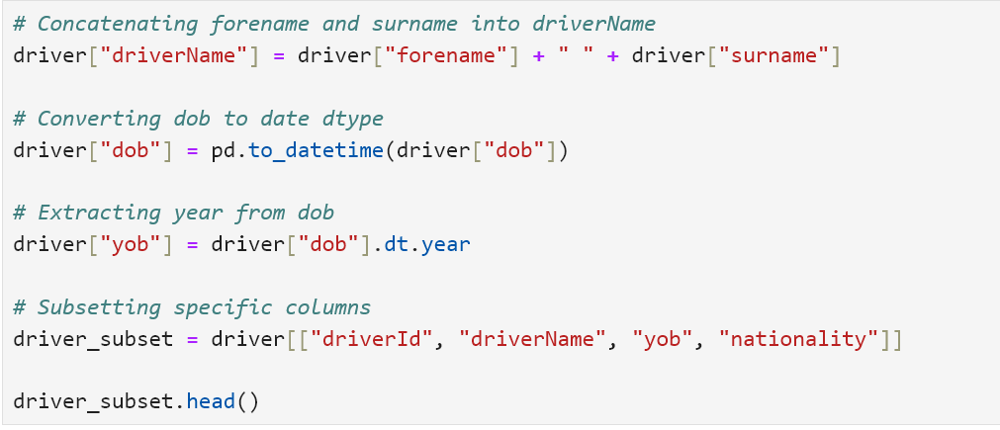
For the Drivers column, I began by merging the driver's forename and surname into a single feature named "driverName." Next, I transformed the "dob" column into datetime format. This enabled me to leverage the pandas datetime .dt accessor, extracting each driver's year of birth, subsequently labeled as "yob."

Lastly, I isolated the "driverName," "yob," and "nationality" columns, "driverName" and "nationality" play a pivotal role in predicting driver performance. Varying skill levels across different drivers and the influence of nationalities on performance were key considerations. Additionally, the "yob" column is utilized to calculate the driver's age at the race time.

I chose not to incorporate "driverRef," "number," and "code" since they functiosimilarakin to "driverName" in serving as uni'que identif' for the driveriers. They didn't bring distinct value beyond differentiation.

Consequently, the Drivers table now presents as follows:
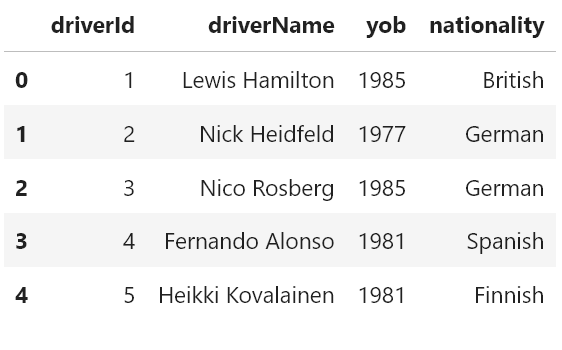

<a id="constructors"></a>
### 5.3.2 Constructors
[back to top](#top)

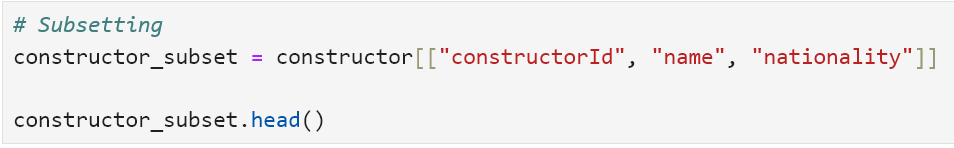
The constructors table encountered no issues with missing values or data inaccuracies. Hence, I focused on subsetting specific columns.

This subset encompassed "constructorId," "name," and "nationality." Distinct constructors bring varied strategies, vehicles, and overall performance. Similarly, much like drivers, the nationality of constructors contributes to their overall performance dynamics.

I excluded "constructorRef" from the subset as it resembled, if not duplicated, the information in the "name" column. Furthermore, the "url" column was omitted as it merely served as a hyperlink redirecting to a Wikipedia page.

Ultimately, the Constructor DataFrame adopts the following stru
cture:
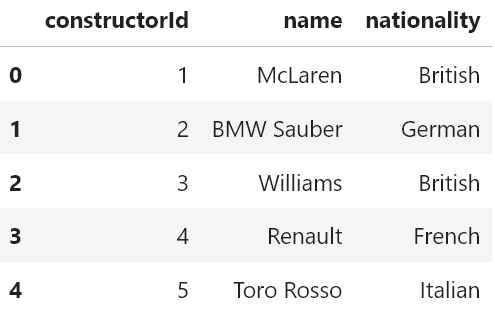

<a id="circuits"></a>
### 5.3.3 Circuits
[back to top](#top)

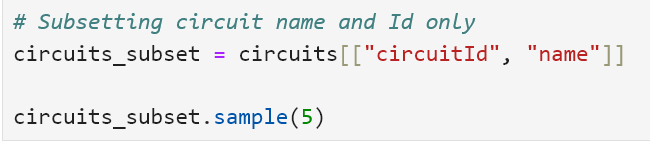 <br>
Like the constructors dataframe, the circuits dataframe did not have any missing values or data errors. Hence, I simply subsetted certain columns

This subset included only 2 columns, "circuitId" and "name". Different circuits possesses unique characteristics, such as layout, turns, and straights, which significantly influence the fastest lap time.

"Location", "country", "lat", "lng", "alt" are not included as the analysis is more centered around factors like lap times, race outcomes, and driver performance rather than the geographical context of the circuits. 

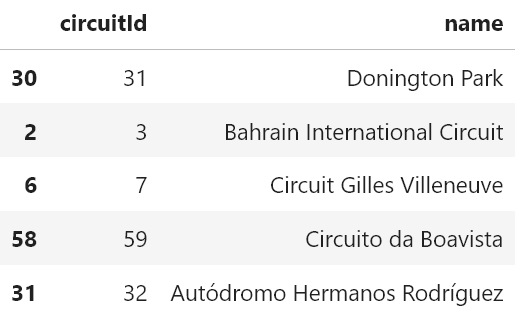

<a id="races"></a>
### 5.3.4 Races
[back to top](#top)

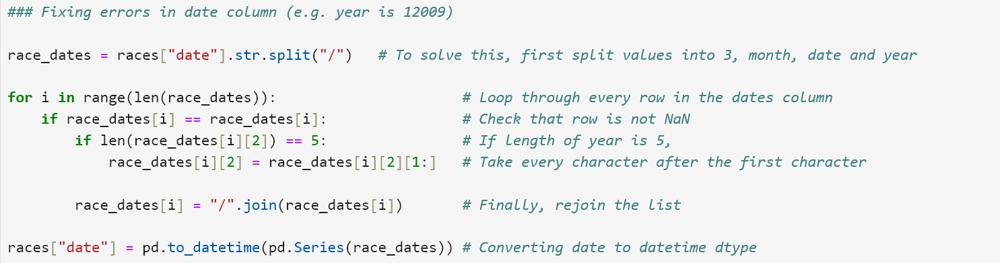

In the races table, I first addressed errors within the "date" column. Specifically, I corrected instances where dates contained an additional "1" at the beginning of the year, resulting in formats like "12009," for example. After fixing this issue, I converted the "date" column to date dtype.

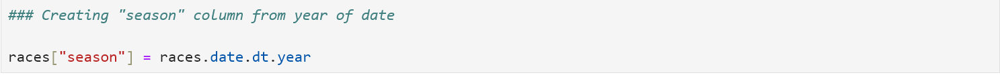

Secondly, I created a new column, called "season", which was derived from the year of the "date" column using pandas .dt accessor. This column, paired with the "yob" column from the Driver table will help me create the "driverAge" column.

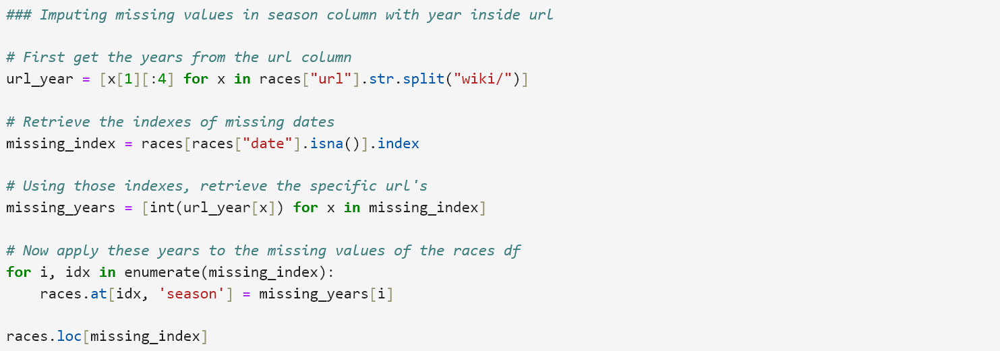

The "date" column had missing values, this reflected in my "season" column. Fortunately, I noticed that the "url" column contained the seasons each race belonged to. These years were then extracted, and used to fill rows with missing "season" values.

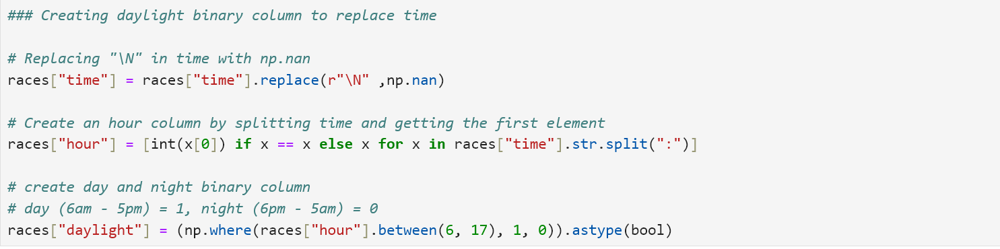

Thirdly, I found that the "time" column itself doesn't give insightful information. Hence, after replacing "\N"s in the time column with np.nan (to be imputed later), I created a "daylight" column that has a value "1" if the time is between 06:00 and 17:00, and "0" if the time is between 17:00 and 6:00. 
<br><br>
Lastly, I subsetted the "raceId", "circuitId", "season", "daylight" columns. "date" was not included as I have included the "season" column to show the period the race occured. "time" was also reflected in "daylight", hence, I also did not include it. The final "Race" table is shown below:
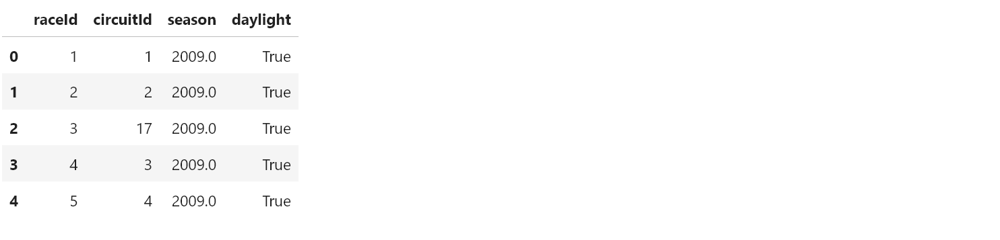




<a id="quali"></a>
### 5.3.5 Qualifying
[back to top](#top)

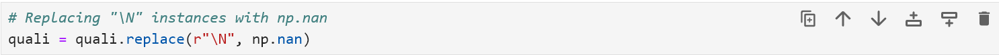
The qualifying dataframe had multiple instances of "\N" in several columns (q1, q2, q3). I replaced these "\N"s with np.nan as they hindered me from converting these columns into numerical values.

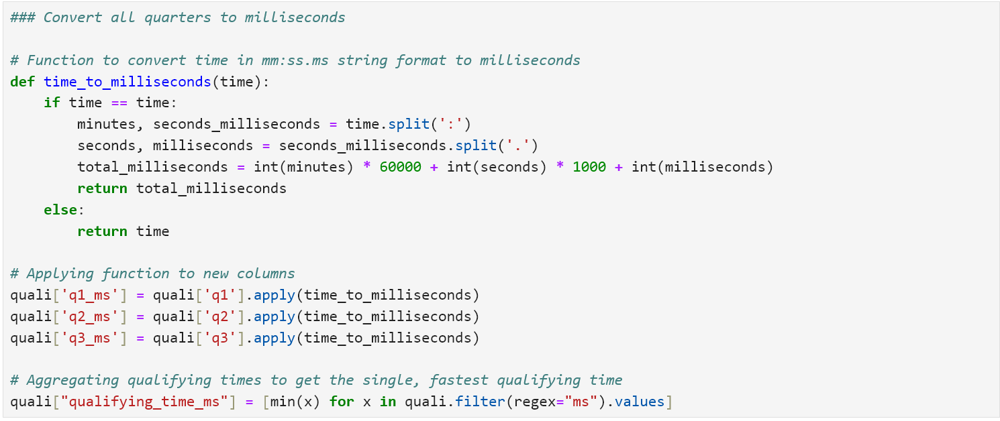
With the "\N" values replaced with NaN, my q1, q2 and q3 columns now had a large proportion of null values. To mitigate as many of these null values as possible, I decided to combine these three qualifying times into one "fastest qualifying time" column. To do so, I first had to convert q1, q2, q3 into milliseconds. Then, I found the min qualifying time between the three qualifying times, and I was left with the fastest qualifying time in milliseconds, which I renamed "qualifying_time_ms".

After this change, the total missing values in my dataframe reduced from 6000+ rows to just 137 rows.

Finally, I subsetted "raceId", "driverId", "constructorId", "position", "qualifying_time_ms". The "position" of the driver for qualifiers ultimately decides the grid starting position of the driver, which is crucial when predicting fastestLapTime. The final Qualifying table is as shown:
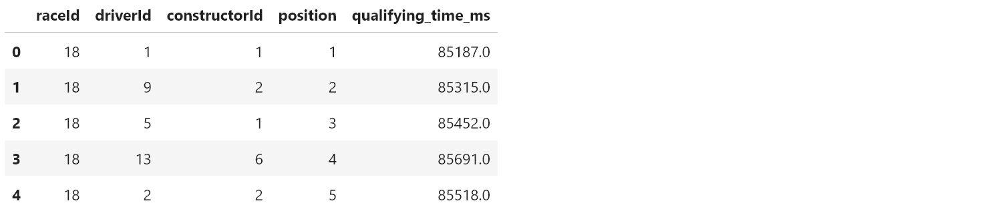

<a id="results"></a>
### 5.3.6 Results
[back to top](#top)

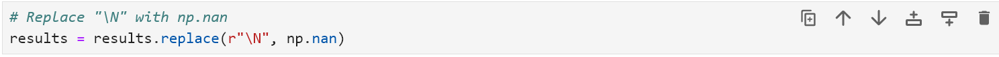
Like the Qualifying dataframe, the Results dataframe had several columns with "\N" values. I decided to replace them with np.nan as several of these columns were numerical but in the wrong dtype because of this issue.

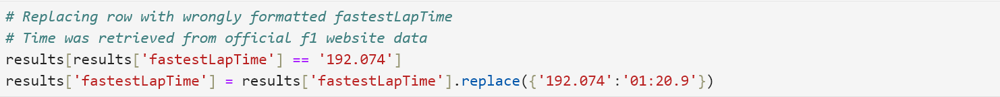
Moving on, my initial plan was to convert the "fastestLapTime" column to milliseconds (to standardise with other columns), however, the plan was quickly impeded when I discovered that there was ONE row with "fastestLapTime" in incorrect format from the others. To solve this, I manually replaced the value with the same value in the correct format.

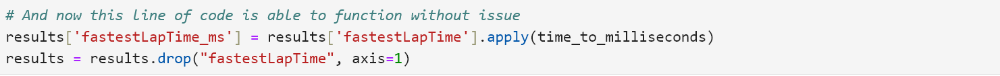
Now I was able to convert "fastestLapTime" to milliseconds!

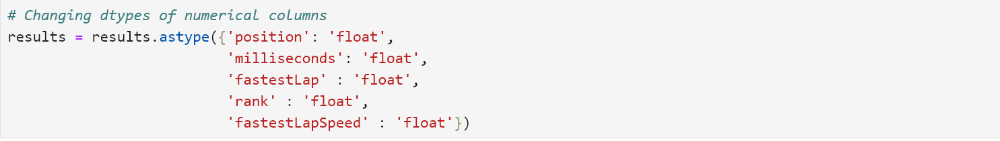
As my "\N"s were now gone, and "fastestLapTime" was in a numerical format, I converted my numerical columns with previously "object" dtype to "float" dtype

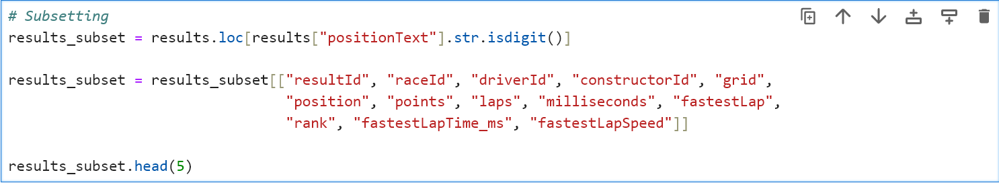

Finally, I subsetted my results rows to only show rows where drivers completed their race. I did this as the column that was going to be my target, "fastestLapTime_ms", had a huge proportion of missing values. Upon inspecting these missing values, I discovered that fastestLapTime cannot be derived if the driver had not finished the race (due to various reasons). 

I also subsetted "resultId", "raceId", "driverId", "constructorId", "grid", "position", "points", "laps", "milliseconds", "fastestLap", "rank", "fastestLapTime_ms", "fastestLapSpeed". "positionText" and "positionOrder" were not included as they were redundant to my "position" column (subsetting to drivers who only finished their race means that positionText is all numeric). StatusId was also not included as I was not going to be using the status table. At the end, the Results DataFrame looks like this:

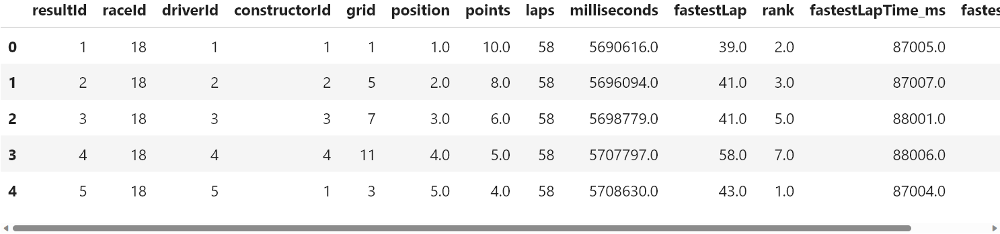

<a id="merging"></a>
### 5.3.7 Merging
[back to top](#top)

With all the tables cleaned up, it was time to merge them together.

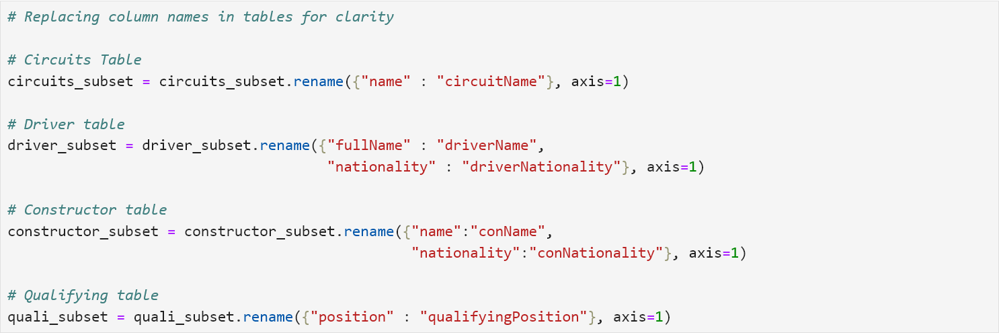

Firstly, I renamed columns in all tables with similar names. This includes: "name", "nationality", "position".

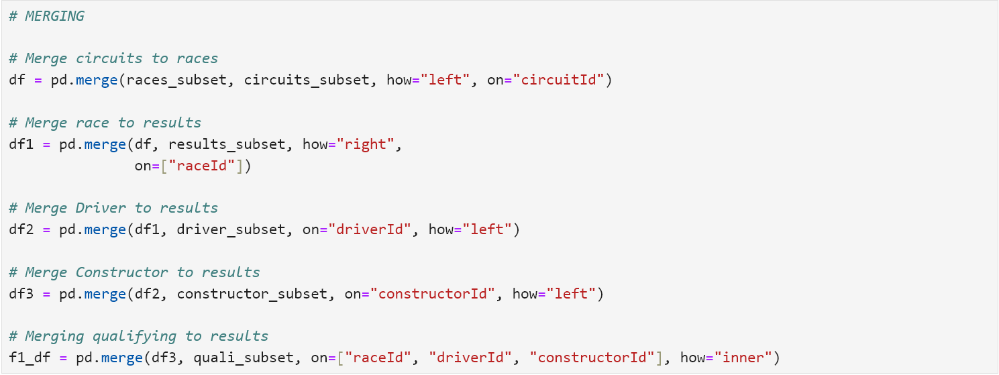

I first merged races to circuits, with a left join on the "circuitId" column, and named this dataframe "df". I used a left join as I wanted to keep all my races information, even if there were races with missing circuit information. 

Secondly, I merged "df" to "results" with a right join on the "raceId" column. Using a right join allowed me to keep all information of my results table, even if I lose information on certain races.

Next, I merged "results" with "driver" and "constructor" using a left join on the "driverId" and "constructorId" columns respectively, maintaining all my rows in the results column.

Finally, I merged "results" with "qualifying" using an inner join on the ["raceId", "driverId", "constructorId"] columns. Originally, I wanted to use a left join to preserve all my results rows, however, the number of races with missing qualifying times was too large, hence, I used an inner join, allowing me to keep most informaton from both tables.

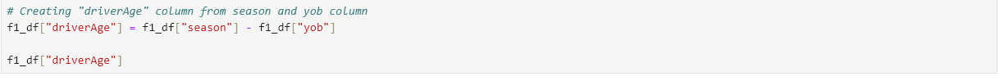
At the end, I was left with 1 table, "f1_df". Which had 6850 rows and 25 columns. As a final touch, I created the "driverAge" column by subtracting "season" by "yob". The final dataframe is shown below: 

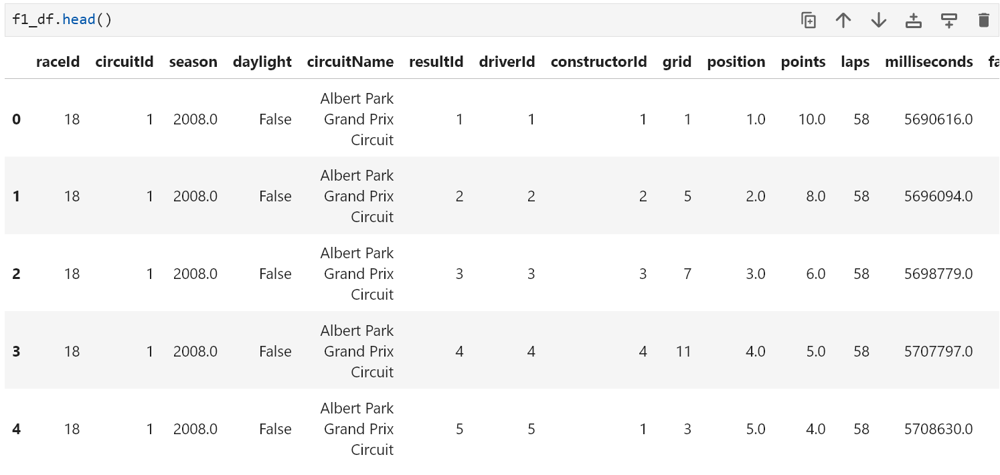

<a id="efd"></a>
### 5.3.8 Exploring the final dataframe
[back to top](#top)

Before jumping into Data Cleansing and Transformation, I wanted to get a better understanding of the features of the dataframe I was working with. 

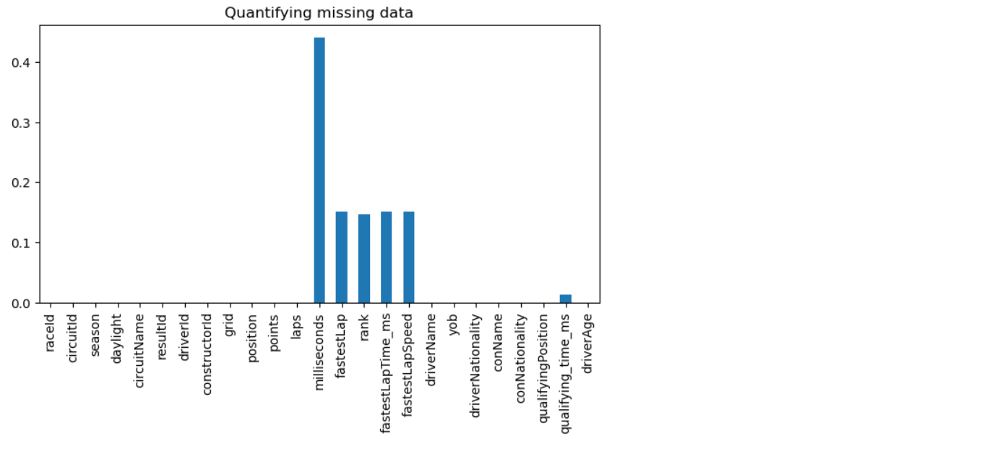
Firstly, I plotted the frequency density of missing values in the DataFrame. 7 columns in my DataFrame consisted of missing values (position, "milliseconds", "fastestLap", "rank", "fastestLapTime_ms" (The target), "fastestLapSpeed" and "qualifying_Time_ms". The "milliseconds" column has nearly 50% of its values missing, whereas other columns have ~ 15% of values missing. "qualifying_time_ms" has a small percentage missing, and "position"s missing values are so small that it can't be seen from the chart.

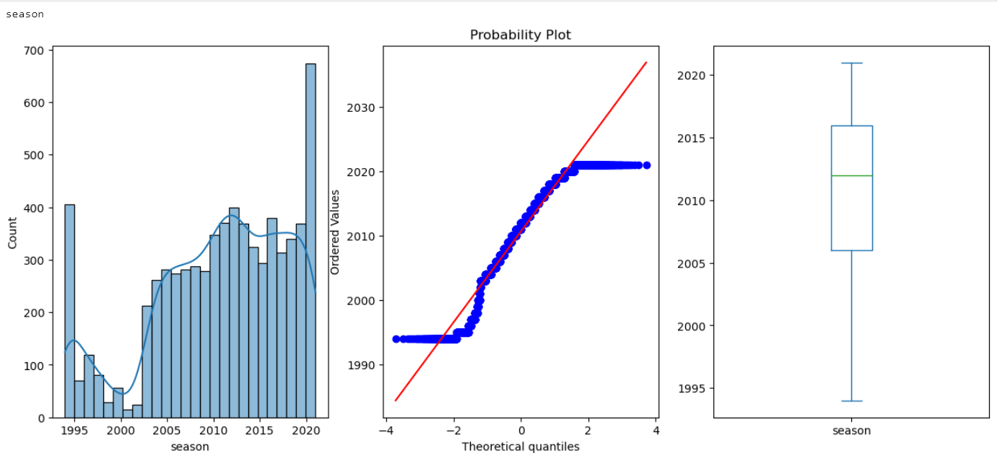

Next, I plotted diagnostic plots for each one of my numerical variables (except "daylight" and "Id" columns). These diagnostic plots consists of a histogram (to view the distribution of the variable), q-q plot (Visualise the skewness of the variable, e.g. normal, left-skewed, right-skewed), and boxplot (Identify the existence of any outliers). From this visualisation, I noticed that several of my distributions were skewed (qualifying_time_ms, etc.). Furthermore there existed several outliers in many of the features (fastestLapSpeed). These issues will have to be handled during Outlier Handling, Numerical Transformation, Discretisation and possible scaling.

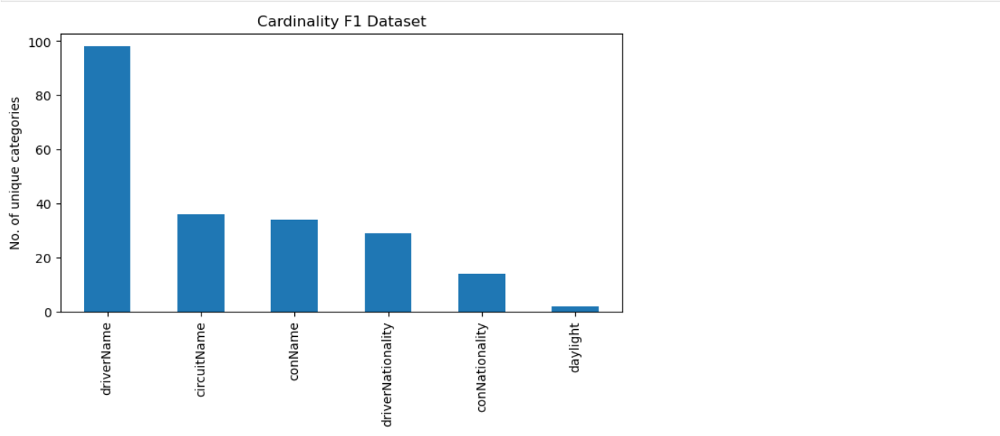

Moving on, I plotted the cardinality of each of the categorical features in my dataset ("circuitName", "driverName", "driverNationality", "conName" and "conNationality"). "driverName" has the highest cardinality, with over 90 different drivers. This was followed by "circuitName", "conName" and "driverNationality", whch have ~ 20 - 30 cardinality. Lastly, "conNationality" had a cardinality of around 10-15. This visualisation allowed me to get a good start to identifying which categorical encoding techniques to apply later on.

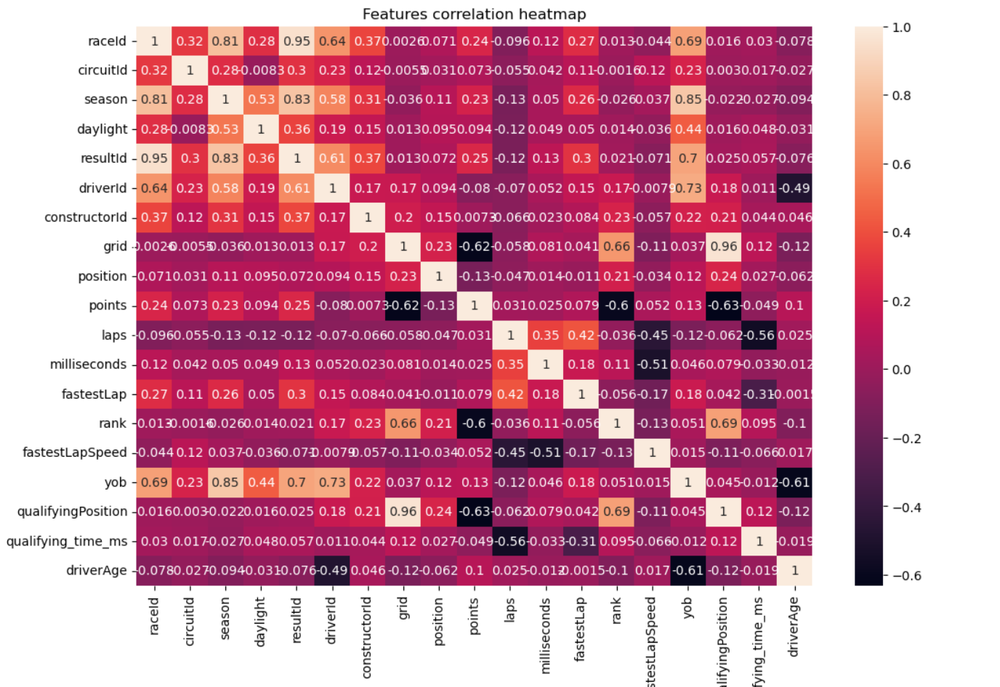

Finally, I plotted a pearson correlation heatmap to identify any high correlations between features. High correlations between features will likely be dropped before modelling, to avoid adding complexity to the dataset which could potentially disrupt model performance. From the visual, we can see several features with correlation > 0.9 with one another. 

<a id="dct"></a>
## 5.4 Data Cleansing and Transformation
[Back to Top](#top)

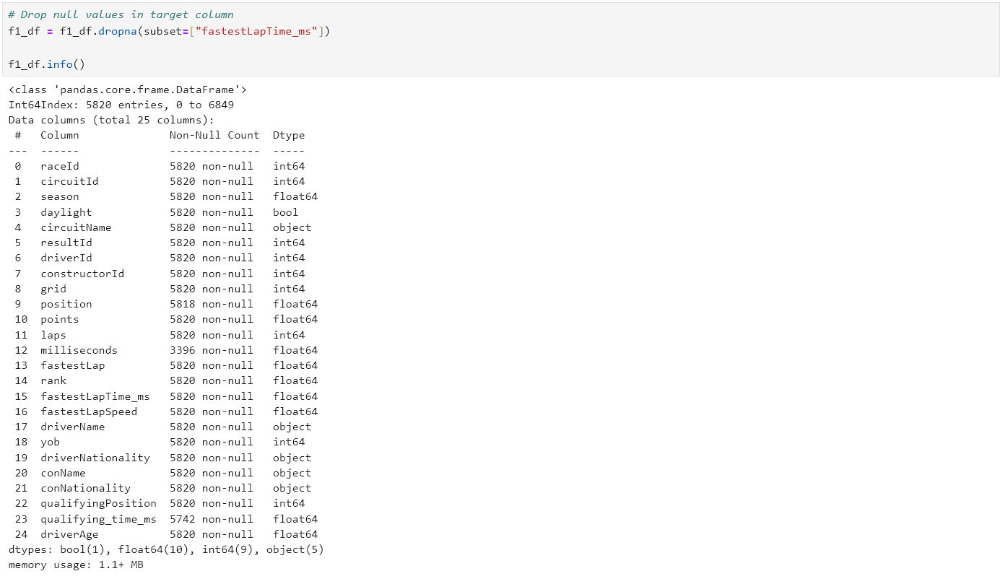

Prior to initiating any data cleansing and transformations, I will proceed by removing null values from my target column, "fastestLapTime_ms." My rationale for this decision stems from the understanding that imputing these missing values might not yield accurate results. Inaccurate fastest lap times would consequently impede the efficacy and precision of my model during the fitting process. By choosing to exclude these null values, I aim to ensure the integrity of my model's performance and safeguard against introducing misleading information that could adversely affect the quality of predictions.

After dropping the nulls in fastestLapTime, I was left with 5820 rows. The number of missing values in my dataset also significantly reduced.

<a id="oh"></a>
### 5.4.1 Outlier Handling
[Back to Top](#top)

#### Why Outlier Handling before Train Test Split

I will be performing outlier handling as the first step of data cleansing and transformation. Earlier when I explored the final datset, I discovered that the target variable "fastestLapTime_ms" does not have outliers. This ensures that I will not be handling any outliers in my target variable, and consequently prevent information leakage from the test set to the training set. Furthermore, handling outliers before splitting ensures that both the training and testing datasets maintain consistency in terms of data distribution and characteristics, which can prevent introducing biases during the modeling process.

#### Functions to be used

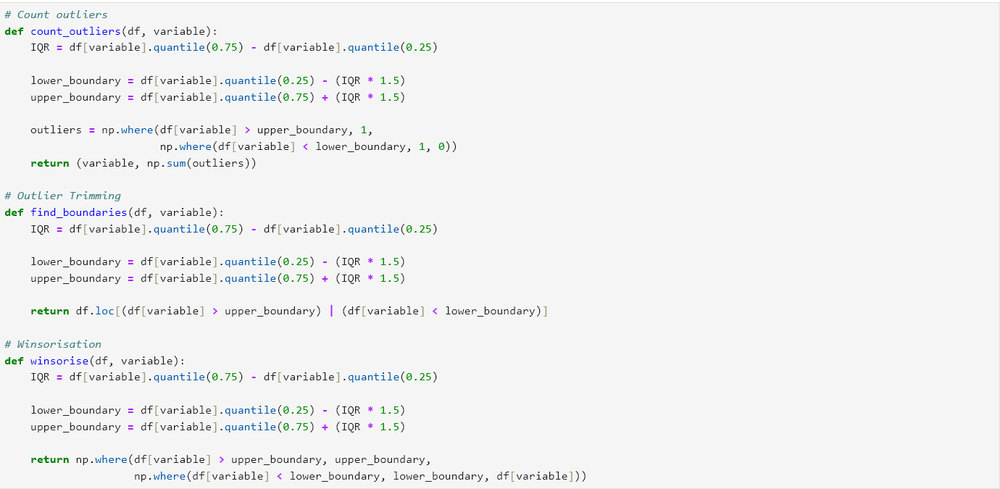

I created three functions to streamline the process of Outlier Handling:
<br><br>
count_outliers(df, variable): Quickly counts outliers in a given variable

find_boundaries(df, variable): Identifies outlier rows for a specific variab


winsorise(df, variable): Applies winsorization to cap outliers at 1.5 times the IQR, improving data stabiity.g them.

#### Identifying columns with Outliers and Plotting them

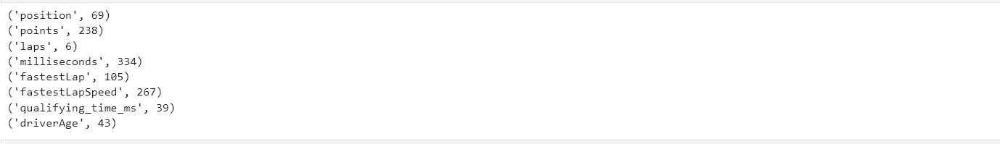
Next, I identified the features with outliers. I was left with 8 features that had outliers. I then plotted these 8 features on a boxplot to get a better view of where these outlier existed. Finally, I took 5 samples from each of the 8 dataframes OUTLIER rows to get a better understanding whether these outliers were errors in data entry, or simply just extreme values.

#### Handling the Outliers

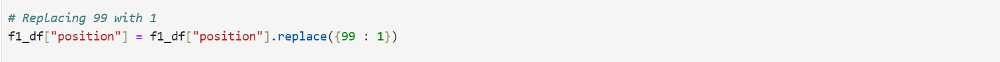 <br>
In the "position" column, oOutliers were isolated with the "99" position. After consulting official F1 race data, it became apparent that "99" indicates race winners or, in some cases, runners-up I will address these outliers by replacing position "99" with position "1".

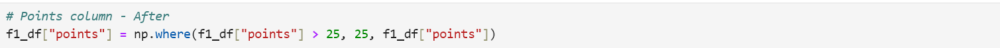 <br>tIn the "points" column, o:
Outliers emerged as points exceeding 25. While I initially believed the F1 points system capped at 26, referencing the official F1 website clarified that values like 50 points were valid. I'll address these outliers by capping them at the current 26-point limit, ensuring conformity with recent F1 regulations.

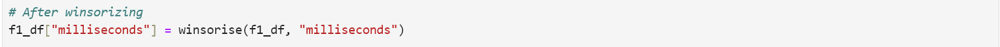 <br>
For the "milliseconds" column, no inherent issues were identified within the values. However, given the presence of over 300 outliers, I made the decision to apply winsorization to curtail their frequency. Capping the values was not my chosen approach since doing so might have led to data loss and potentially skewed the distribution. By winsorizing the outliers, I aimed to achieve a balance between managing extreme values and retaining meaningful data for analysis.

I opted against addressing outliers in the remaining 4 columns due to their overall coherence. After cross-checking some samples with the F1 website, it was evident that the outlier data remained largely accurate and logically aligned (e.g., fastestLapSpeed within realistic range).

After handling outliers in these 3 columns ("position", "points", "milliseconds"), I plotted their distribution before and after. It was evident that the spread of values became much less after outlier handling.

<a id="tts"></a>
### Train-Test Split
[Back to Top](#top)

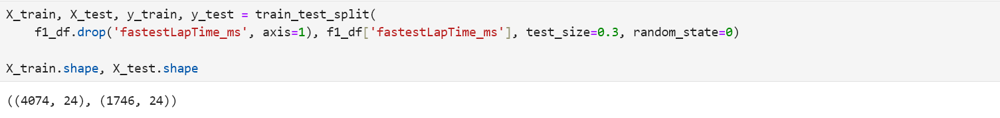
For train-test split, I did a 70-30 data split and set "fastestLapTime_ms" as my y_train and y_test values. I was left with a train set of 4074 rows, and a test set of 1746 rows.

<a id="mvi"></a>
### 5.4.2 Missing Value Imputation
[Back to Top](#top)

#### Identifying columns with missing data

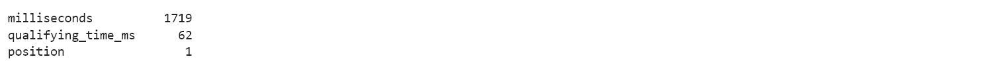
I first printed the total missing values in both the X_train and X_test datasets. I identified 3 columns with missing values, "milliseconds", "qualifying_time_ms", and "position". The "milliseconds" column had over 2400 rows of data missing in total for both train and test, whereas "qualifying_time_ms" and "position" only had 80 and 2 missing values respectively.

#### Complete Case Analysis 

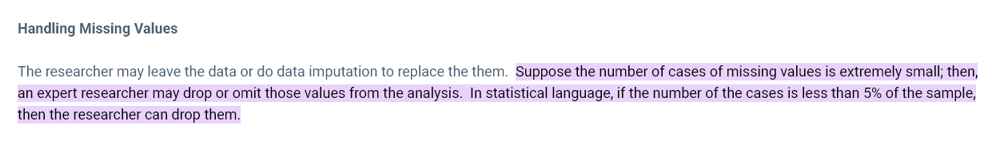
According to this reputable statistics websites, when the instances of missing values are notably minor (comprising less than 5% of the sample), researchers can choose to eliminate these missing values. As the "qualifying_time_ms" and "position" columns fall under this criteria, I will be dropping missing values in these columns. 

It was crucial that I also drop the corresponding rows in "y_train" and "y_test" to maintain an equal sample size in both the train and test sets. 

#### Missing values in milliseconds column

Missing values in the "milliseconds" column totalled to 2400 rows in the train and test sets. Dropping these columns can result in loss of significant amount of information even in data sets that contain a modest number of variables. 

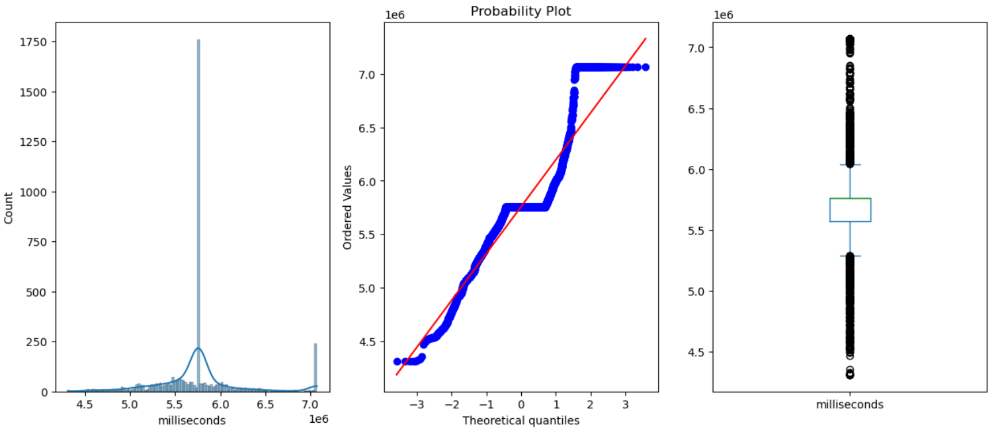
I attempted to fill in the missing values using mean and median imputation through sklearn's SimpleImputer(). However, this approach caused a significant concentration of values around the mean and median, leading other data points to be considered as outliers. Due to this unexpected outcome, I had to discard these imputation methods. The distortion they introduced to the data distribution made them inappropriate for maintaining the accuracy and reliability of my analysis and modeling.

In the end, I devised a solution by multiplying the values in the "qualifying_time_ms" column with those in the "laps" column. This approach allowed me to obtain a reasonably precise estimate of the time a driver would require to complete a race. This derived value served as a substitute to fill in the missing entries within the "milliseconds" column.

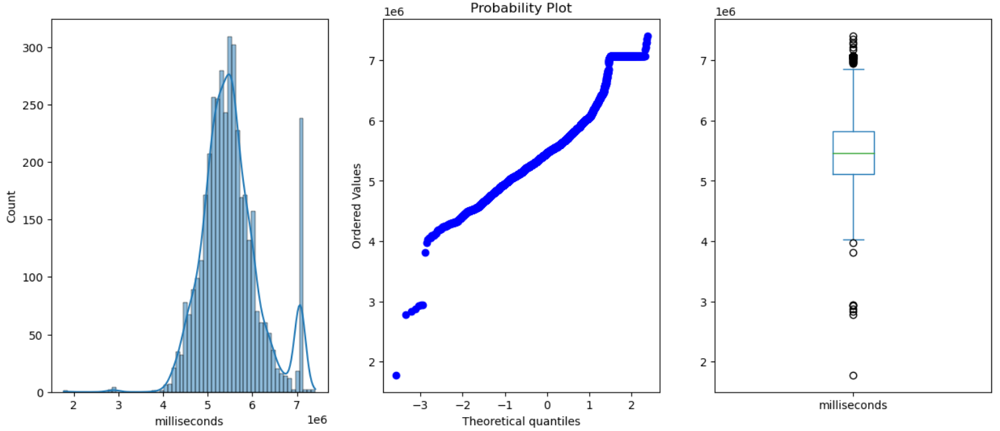

The image above demonstrates the emergence of some outliers. However, another round of winsorization can solve this, resulting in a distribution that closely approximates normality as shown below: 

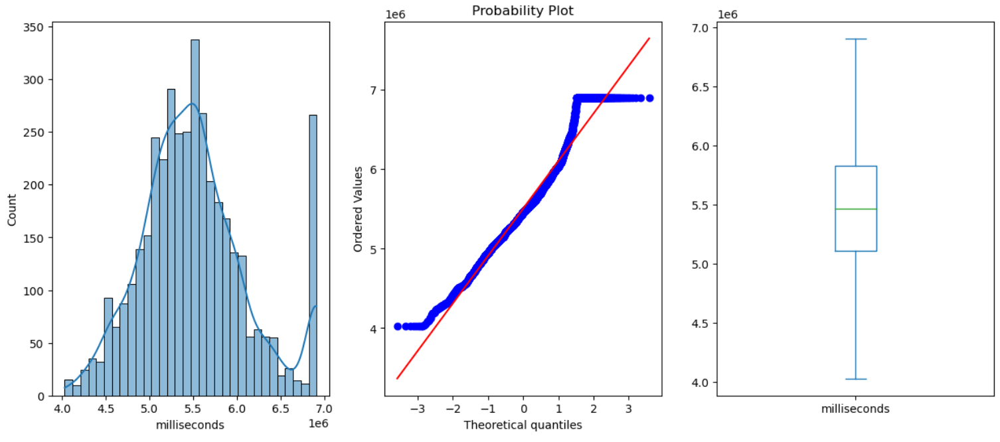





<a id="ce"></a>
### 5.4.3 Categorical Variable Encoding
[Back to Top](#top)

#### Cardinality of Categorical Columns

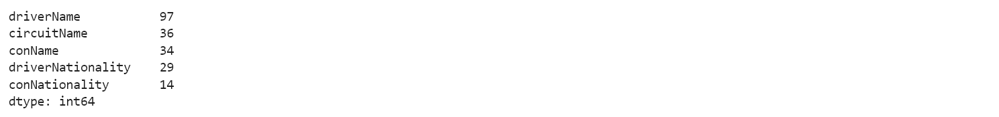
The categorical columns in my dataset all have a relatively high cardinality, ranging from 14 - 96. Due to the high cardinality there are several encoding methods that I should avoid to prevent overfitting of my data such as one hot encoding, label encoding and target mean encoding.

#### Leave One Out Encoding

For driverName, circuitName and conName, I used an encoding method known as Leave One Out Encoding (LOOE). Leave One Out Encoding (LOOE) is an encoding method similar to target encoding but excludes the current row’s target when calculating the mean target. 

The 3 columns have a high number of unique categories, hence traditional encoding methods like one-hot encoding or label encoding can lead to an explosion in dimensionality and potential overfitting, hence, I chose not to use them.

Furthermore, unlike target encoding, LOOE involves encoding a category by calculating the mean of the target variable, while excluding the data point being encoded. This prevents direct influence from the target variable of the data point itself during the encoding process, consequently mitigating data leakage from the target variable to the train set.

#### Frequency Encoding

I chose frequency encoding for the "driverNationality" and "conNationality" columns due to their characteristics. These columns capture the nationalities of drivers and constructors, and their predictive power isn't rooted in ordinal relationships. 

Frequency encoding aligns well with the nature of these categorical variables, as it retains information about the distribution of nationalities without introducing an artificial order. This approach efficiently represents the prevalence of each nationality, contributing relevant insights to the model. 

Additionally, frequency encoding simplifies the data while avoiding dimensionality concerns, making it an effective choice for maintaining the integrity of the data's underlying structure.






#### Evaluating Model Performance after Categorical Encoding

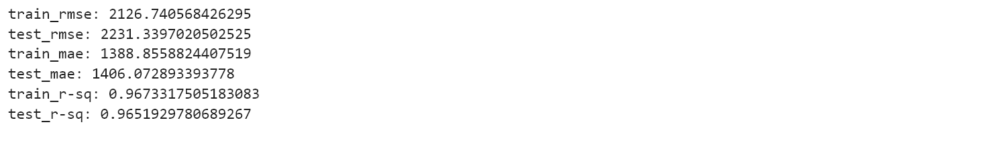
The picture above shows the model performance after Categorical Encoding. As we can see, the score is relatively high, while also being well fitted.

#### Testing other Encoding Methods

Other than LOOE and Frequency Encoding, I tried other encoding techniques to try improve my score. These included Target Mean Encoding and One-Hot encoding. The model results of OHE are shown below:

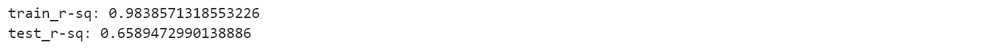
As expected, while the model performs slightly better on the train set, it is completely overfitted, resulting in a much lower score for the test set.

<a id="nt"></a>
### 5.4.4 Numerical Transformation
[Back to Top](#top)

#### Identifying which transformation method to use

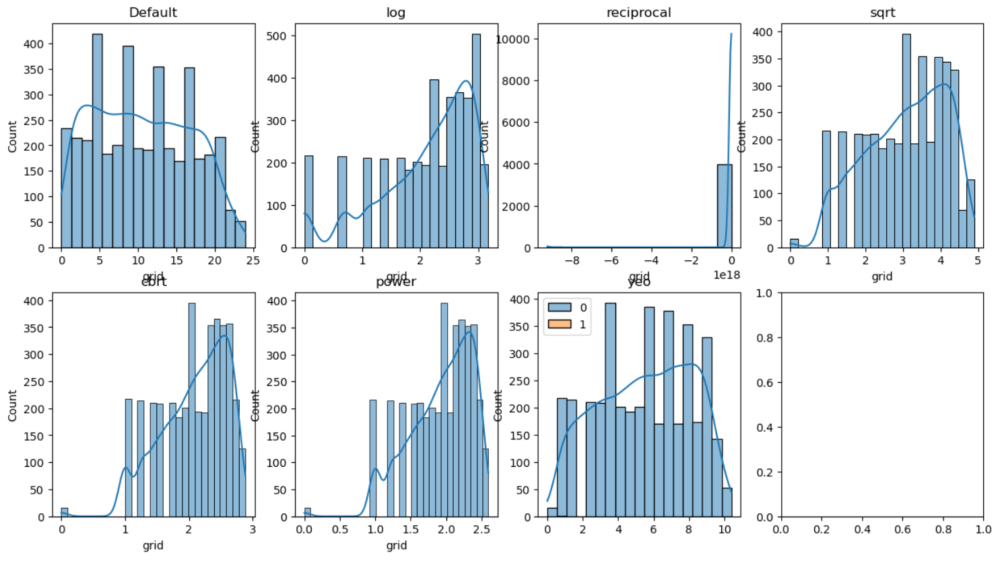
To identify which transformation method was most suitable for my 13 numerical variables, I wanted to quickly see how the shape of my 13 numerical variables' distributions changed with different transformations. So, I created a function called plot_tf() that shows how each variable looks after applying seven different transformations. This helps me choose the transformation that makes the distribution closest to normal. The image above shows an example of this function used on the "grid" variable.






#### Transforming the variables

After analyzing each column and applying different transformation methods, I reached these conclusions:

No Change:
I decided not to transform "grid," "position," "laps," "fastestLapSpeed," and "qualifyingPosition." These columns either had a normal distribution already or transforming them wouldn't improve their distribution.

Cube Root for Points:
I used Cube Root for the "points" column. This choice made the distribution more normal, aside from the spike of 0 points on the left.

Yeo-Johnson for Rank and Fastest Lap:
Yeo-Johnson transformation worked well for "rank" and "fastestLap." It provided the most normal distribution after transformation.

Log for Qualifying Time:
I chose the log transformation for "qualifying_time_ms." While it already had a somewhat normal distribution, applying the log transformation improved it further.

Reciprocal for Driver Age:
To normalize the slightly right-skewed "driverAge" column, I employed the reciprocal transformation. This shift enhanced the distribution's normality.

These transformations were selected based on their ability to align the distributions with a normal shape, optimizing the data for subsequent analysis.

#### Evaluating Model Performance after transformation

After transformation, these were the results of my Linear Regression model:

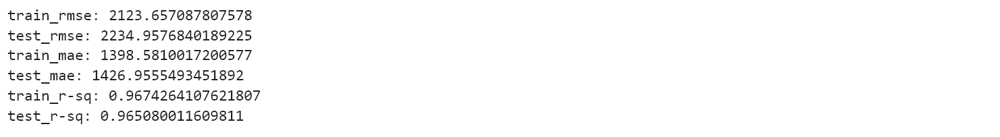

After transforming the data, my Linear Regression model showed only a tiny improvement (0.0001 increase) in performance. Nonetheless, I've decided to keep the transformations. Linear Regression models generally work better when the features have a normal distribution. Despite the small change, sticking with the transformed features aligns well with the model's preferences and can lead to more dependable results.




<a id="vd"></a>
### 5.4.5 Variable Discretisation
[Back to Top](#top)

#### Determining which variables and method of discretization to use

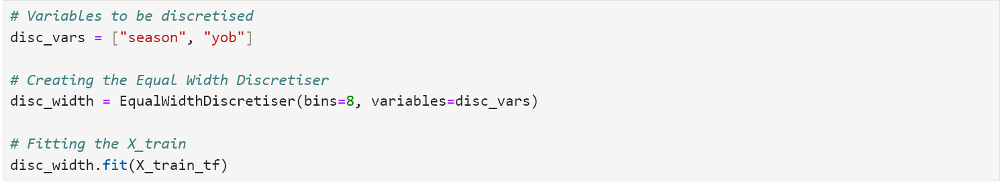
I experimented with various combinations of columns to decide which ones to use for discretization. After several trial and error attempts, I found that incorporating the "season" and "yob" columns led to an enhancement in my model's performance.

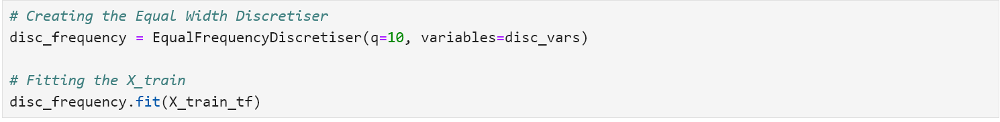
I decided to assess the outcomes of both Equal Width Discretization and Equal Frequency Discretization by applying both methods. In each case, I configured the parameters to establish eight bins for Equal Width Discretization and a "q" value of 10 for Equal Frequency Discretization. This allowed for a comprehensive comparison of the results achieved through these two discretization approaches.







#### Plotting "season" after discretisation

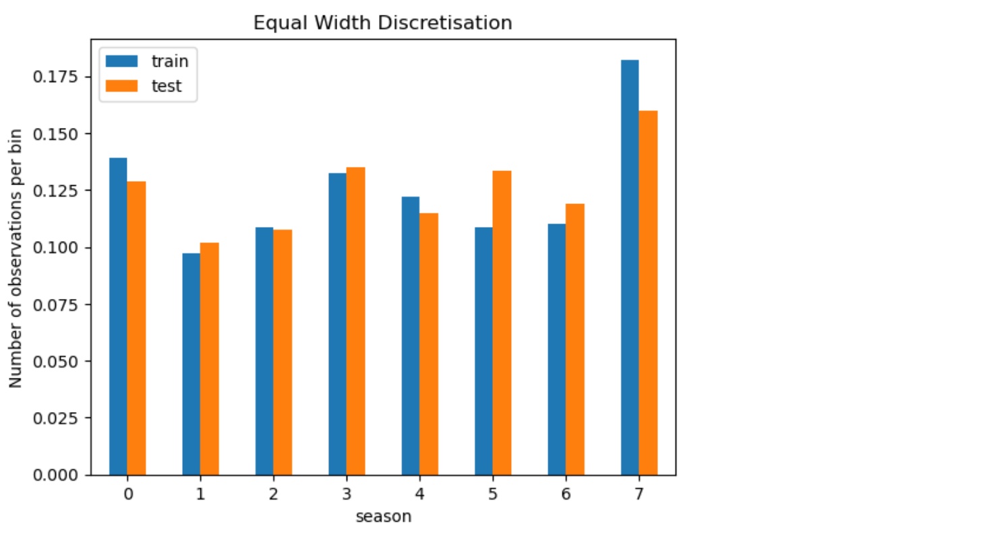

The image displays the outcome of discretizing the "season" column. The values within the "seasons" column have been organized into eight distinct bins. Given that this column represents the year or time period, each bin likely encompasses a range of values, such as "2012 - 2015," and etc. This discretization simplifies the representation of time-related data into manageable and meaningful segments that will be beneficial for the model.




#### Comparing Model Performance of Equal Width VS Equal Frequency discretization

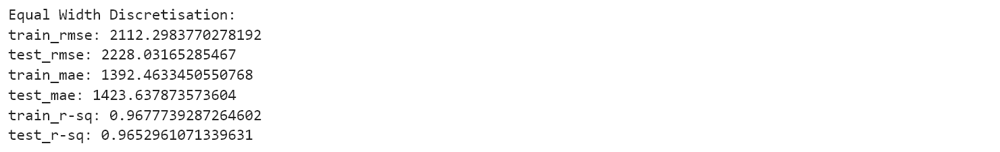
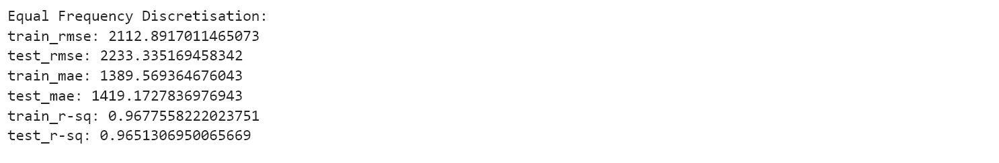

The image above indicates that both discretization techniques resulted in an enhancement of our model's performance. However, when comparing the two, Equal Width discretization emerged as the more effective approach. It outperformed Equal Frequency by a slight margin of 0.00002 in the train set. This outcome underscores the advantage of Equal Width discretization in this particular scenario.






<a id="fe"></a>
### 5.4.6 Feature Creation
[Back to Top](#top)

#### Average Lap Time in milliseconds

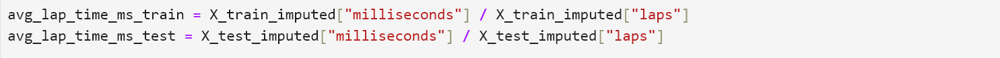
I generated the initial feature called "avg_lap_time_ms" by dividing the values in the "milliseconds" column by the corresponding values in the "laps" column. This metric offers valuable insights into a driver's consistent performance throughout a race, helping to identify patterns and variations in their lap times.


#### Driver Experience

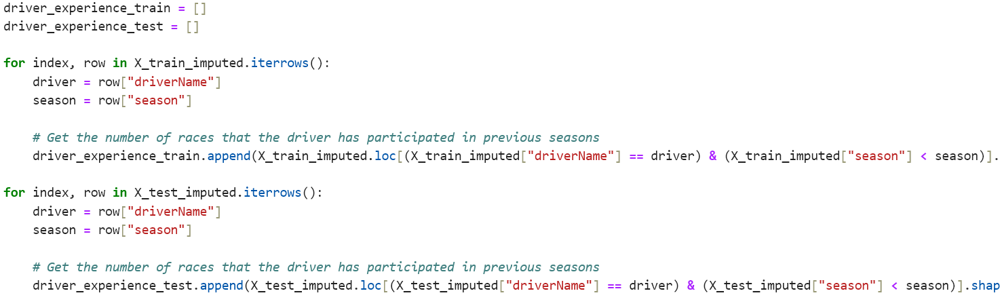
Subsequently, I introduced a new column named "driverExperience." This metric quantifies a driver's accumulated experience by calculating the total count of races they participated in before the current season. To generate this metric, I tallied the number of rows in which the driver took part across preceding seasons up to the present point in time. 

This feature can give us insights into a driver's overall experience and how it might affect their performance and decisions during a race season.


#### Evaluating model performance after Feature Creation

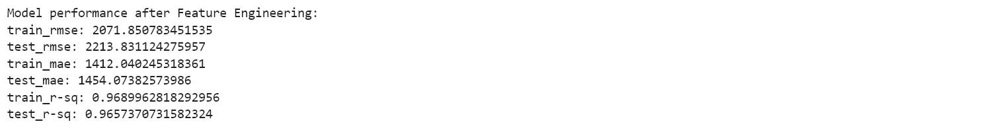
Upon introducing these two features, I observed a significant improvement in the performance of my models. This enhancement was notable across both the training and testing datasets. The addition of the "avg_lap_time_ms" and "driverExperience" features evidently contributed to better predictive capabilities, leading to better model outcomes on both the data used for training and the unseen test data.




<a id="fs"></a>
### 5.4.7 Feature Scaling
[Back to Top](#top)

#### Function to plot before and after

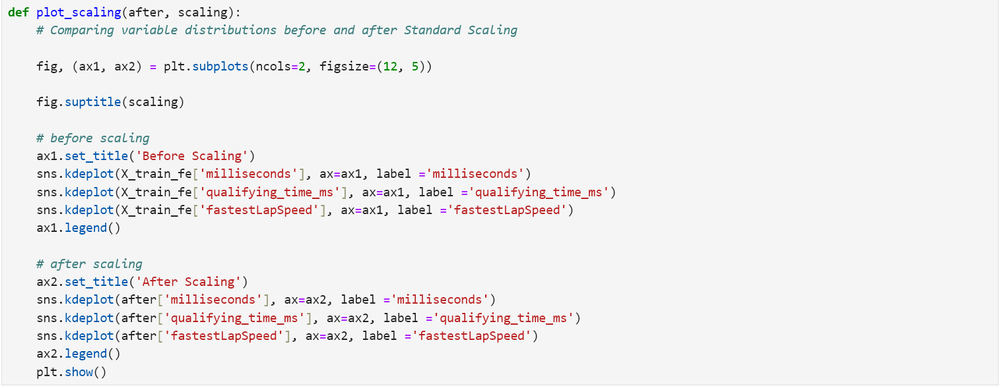
As I would be trying multiple methods of scaling, I streamlined the process by creating a function that plots the before and after depending on the scaling method used. 

#### Standardisation

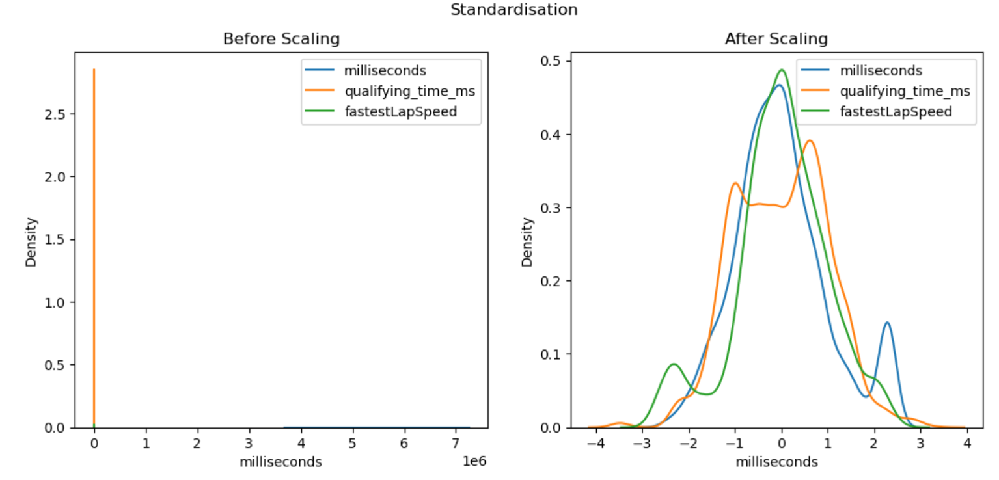

The image above shows the first scaling method I used, standardisation. Standardisation is a data preprocessing technique to transform numerical features such that they have a mean of zero and a standard deviation of one. After plotting, we can see that the 3 variables I selected were centered at their mean (0).

#### MinMaxScaling

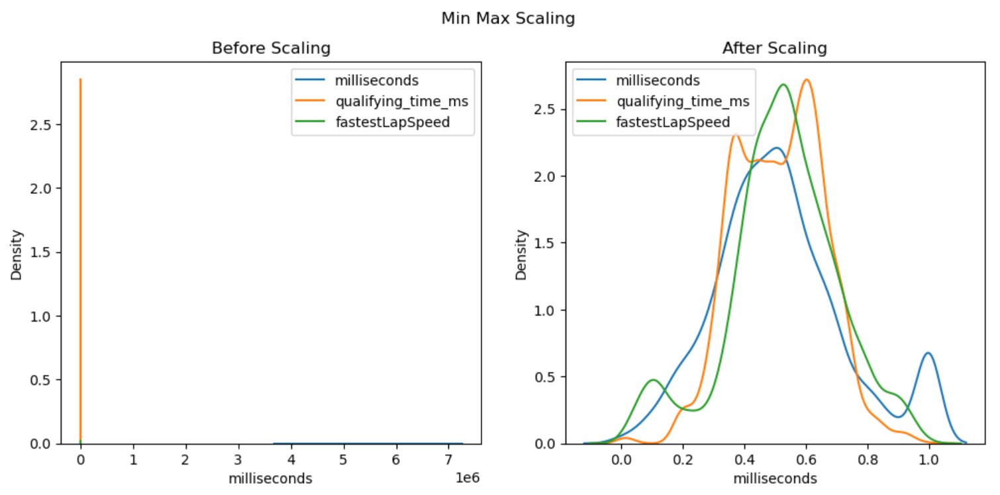

The image above shows the variables "milliseconds", "qualifying_time_ms" and "fastestLapSpeed" after MinMax Scaling. MinMax scaling transforms numerical features so that they are constrained within a specific range, typically between 0 and 1. We can see that after scaling, our variables that were once of different ranges are now of the same scale, within the range of 0 - 1.

#### Robust Scaling

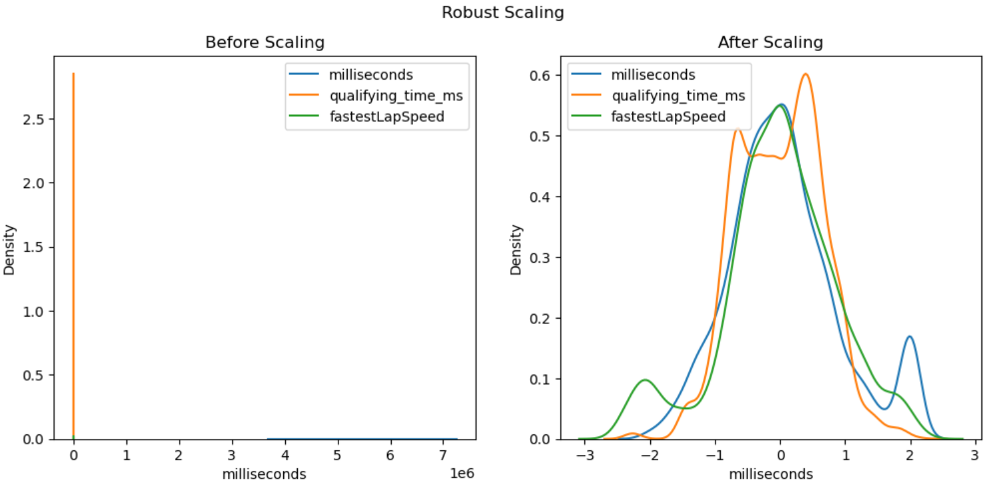

Lastly, the image above shows the same three variables after Robust Scaling. Robust scaling scales numerical features while considering their resilience to outliers. Unlike standard scaling methods that can be influenced by outliers, robust scaling adjusts the features in a way that they are more robust to extreme values.

#### Comparing Model Performance of the three Scaling Methods - No Change?

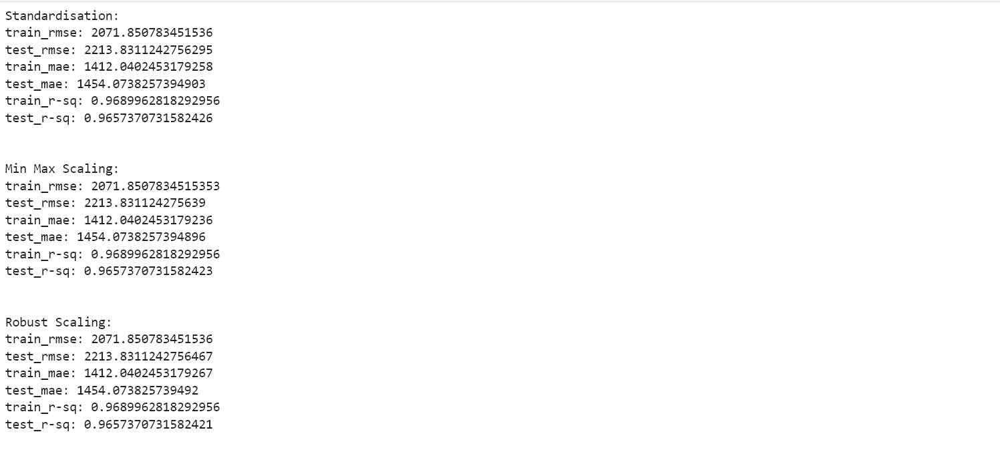

The provided image illustrates the model performance achieved through different scaling methods for each individual feature. It's evident that there is a consistent absence of any change in the model's performance across all the scaling techniques.

After research online, I learnt that sklearn's LinearRegression() uses Normal Equation i.e. closed-form solution to get best parameters for a given solution. Hence, they don’t have iterative loops to find best solution. Therefore, feature scaling will not have an impact on the results of the model. Whereas, algorithms that use gradient decent such as sklearn's SGDRegressor(), scaling is recommended.

Nevertheless, I have decided to proceed with using the RobustScaler for scaling my features moving forward. While I intentionally chose to retain outliers in certain columns due to their accuracy, employing the RobustScaler will allow me to effectively scale the data while accounting for the presence of these outliers. This scaling method aligns well with my objective of maintaining the integrity of the data, particularly in my case where the outliers are genuine representations of the underlying information.

<a id="pe"></a>
### 5.4.8 Polynomial Expansion
[Back to Top](#top)

#### Identifying and Dropping features with high correlation

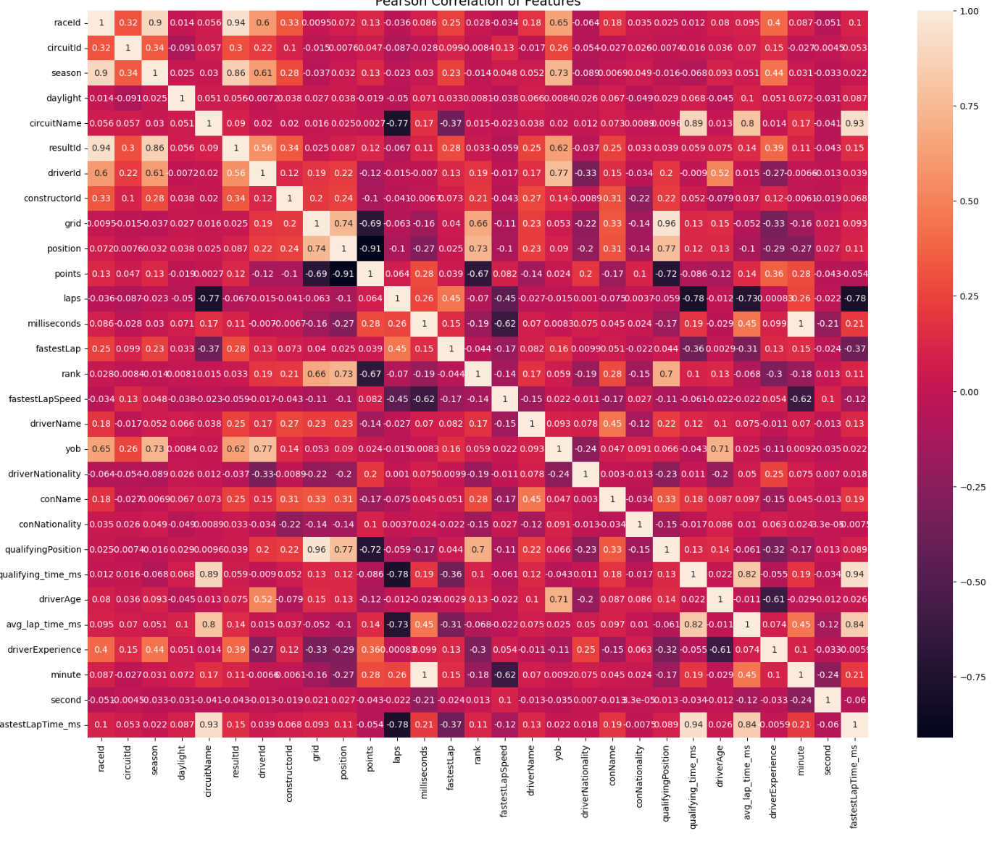
Using a heatmap to plot pearson correlation of my X_train merged with my y_train, I noticed several columns with extremely high (>0.9) correlations to one another. When features are strongly correlated, it can lead to multicollinearity, where the model struggles to differentiate the individual effects of correlated features on the target variable. Thus, I decided to drop these features ("raceId", "grid").

#### Identifying columns with high correlation to target for Polynomial Expansion

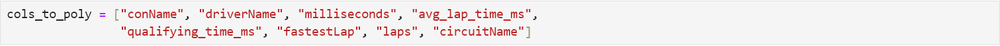
Next, I identified features with high correlation (>0.2, <-0.2) to the target variable. These features were "conName", "driverName", "milliseconds", "avg_lap_time_ms", "qualifying_time_ms", "fastestLap", "laps" and "circuitName". 

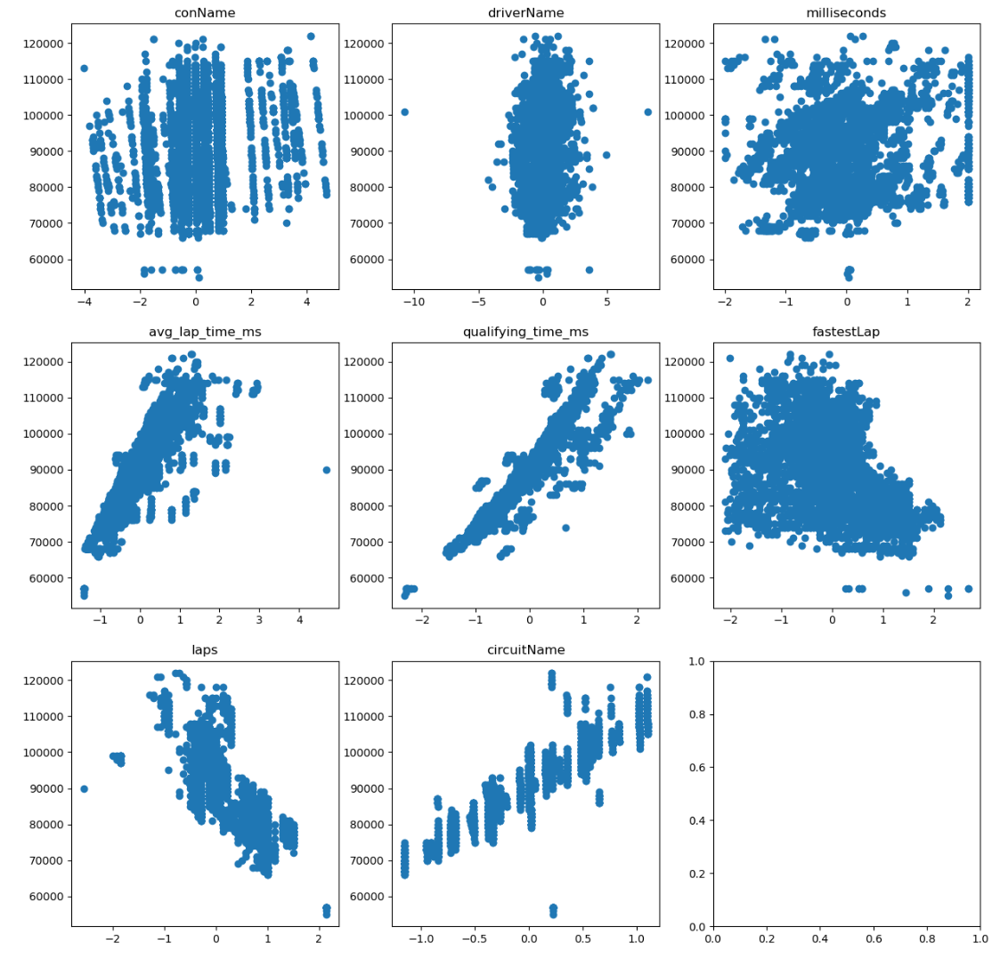

For each of these features, I then plotted them against the target variable to get a visual representation of the linearity of these features with the target. As polynomial expansion can lead to overfitting if not properly controlled, visualizing the relationshipscan determine whether higher-degree polynomial features are necessary, or if a simpler linear model suffices. As the features I chose were already had a relatively linear relationship with the target, I decided that a degree of 3 was sufficient.


#### Polynomial Expansion

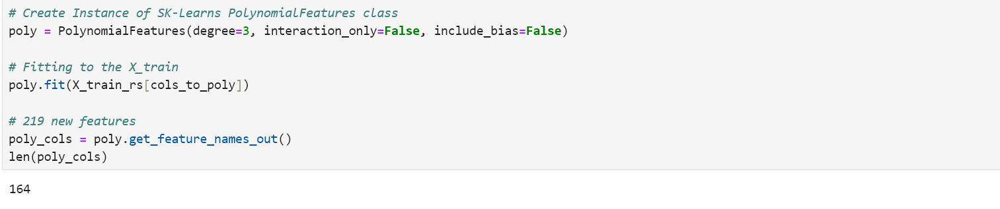
After applying sklearn's polynomial features transformation to the initial 8 columns, a total of 164 new polynomial columns were generated. Recognizing that including all these columns in my dataframe could lead to severe overfitting, I implemented a strategy to retain only those columns with a correlation greater than 0.75 or less than -0.75 with the target variable. The threshold of 0.75 was determined through iterative trial and error, taking into account the model's performance.

By focusing on these highly correlated polynomial columns, I aimed to strike a balance between feature richness and avoiding overfitting. This selection process ultimately left me with 8 polynomial colum. 

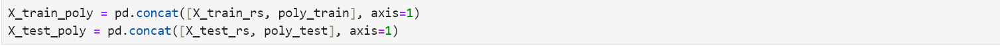
Finally, I concatenated both the new polynomial features to my original dataframe. n.

#### Evaluating model performance after polynomial expansion

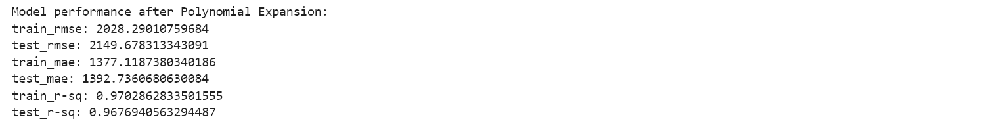

From the image above,  it's evident that the model's performance experienced a substantial boost after implementing Polynomial Expansion for both the train and test datasets. Remarkably, this improvement was achieved without experiencing to overfitting issues.

<a id="pca"></a>
### 5.4.9 PCA
[Back to Top](#top)

#### Determining number of components

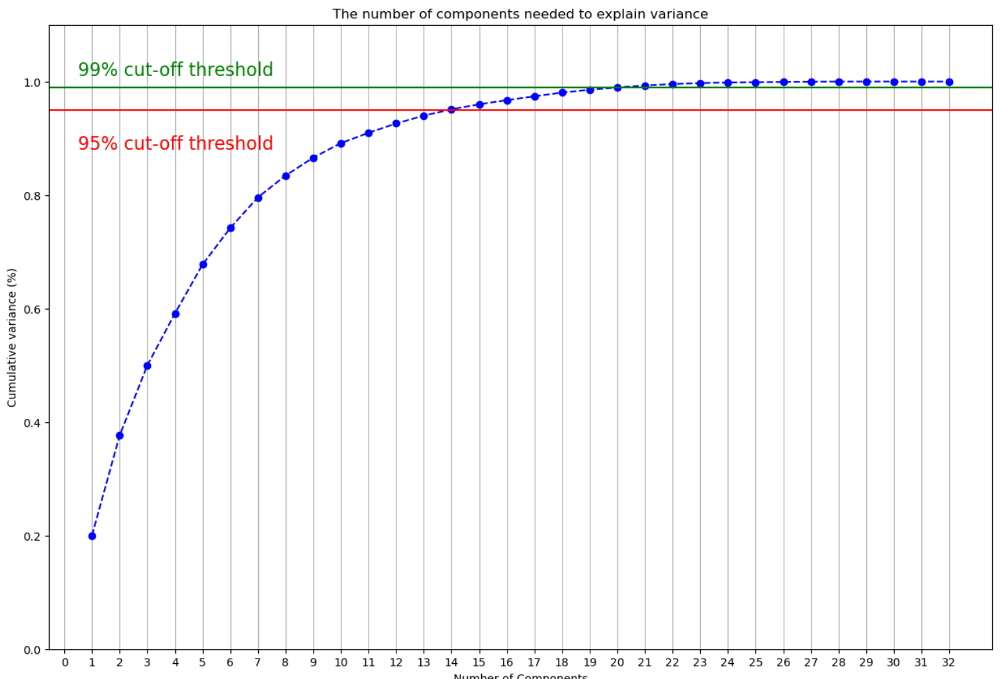
To identify the optimal number of components required to retain a substantial portion of the variance, I referred to the chart shown above. The analysis revealed that employing 14 principal components captures around 95% of the total variance. Alternatively, employing 20 principal components accounts for approximately 99% of the variance in the data. This insight provides a valuable guideline for selecting the appropriate number of components for dimensionality reduction, enabling a balance between reduced complexity and retained information.




#### Applying PCA with 14 components

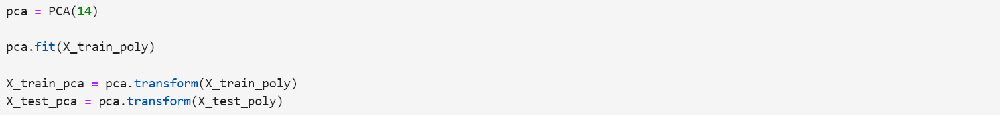
After applying PCA with 14 principal components, I then evaluated the model performance. The model results are as shown:

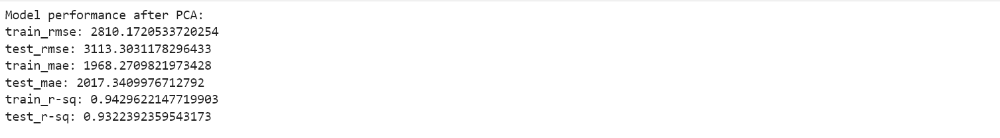
The noticeable drop in model performance is apparent. This decline could potentially be attributed to the fact that our model is already fine-tuned to the fitted dataset. Consequently, any reduction in variance resulting from PCA could lead to a significant decrease in model performance and accuracy. This suggests that the model's optimization is closely tied to the original dataset's characteristics, making it more sensitive to changes in feature variance introduced by dimensionality reduction techniques like PCA. Hence, I will not be using PCA.



<a id="mlm"></a>
## 5.5 Machine Learning Modelling
[Back to Top](#top)

Final datframe shape:

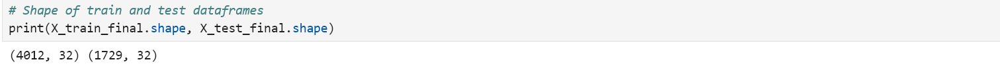
4012 rows and 32 columns in the Train set, 1729 rows and 32 columns in the Test set

<a id="nb"></a>
### 5.5.1 Naive Baseline
[Back to Top](#top)

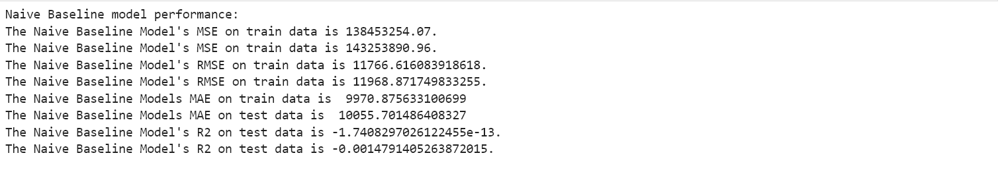

In the presented image, the Naive Baseline model exhibited remarkably poor performance across all scoring methods. 

<a id="lr"></a>
### 5.5.2 Linear Regression
[Back to Top](#top)

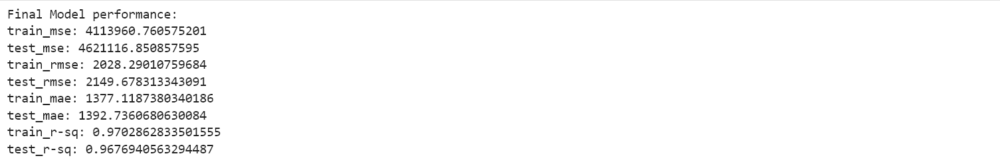

The Linear Regression model demonstrates good performance, with low mean squared errors and root mean squared errors indicating accurate predictions. Mean absolute errors are also reasonable, depicting the average prediction deviation. High R-squared values suggest effective variance explanation. However, the slight test/train performance difference could mean possible overfitting. To solve this, we can use regularization or tuning to enhance generalization to new data.




<a id="rr"></a>
### 5.5.3 L2 Regularization (Ridge Regression)
[Back to Top](#top)

To mitigate the slight overfitting in my dataset, I decided to use L2 Regularization. Regularization adds a penalty term to the model's loss function based on the complexity of the model to reduce noise and generalize well to new data.

#### Hyperparameter Tuning with GridSearchCV
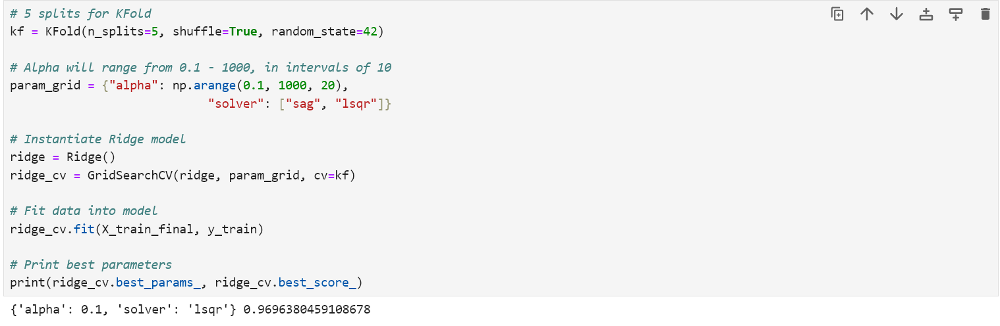
To determine the optimal parameters for my Ridge model, I employed GridSearch Cross Validation. My parameter grid included values for the regularization parameter "alpha" ranging from 0.1 to 1000 with intervals of 20, and I considered two solvers: "sag" and "lsqr". Employing 5-fold cross-validation, the GridSearch output highlighted that the best parameters for my Ridge model were {"alpha": 0.1, "solver": "sag"}.


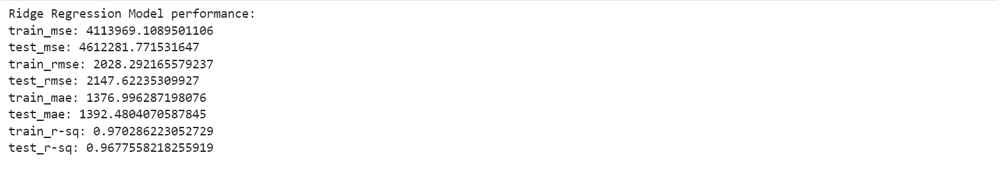
The depicted image illustrates the performance of the Ridge model. It's evident that there was a marginal increase in the test score, indicating a slight enhancement in the model's predictive capability. While the improvement appears to be quite minimal, even minor progress in test score can be valuable in refining the model's accuracy and generalization.




<a id="sfi"></a>
## 5.6 Summary & Further Improvements
[Back to Top](#top)

<a id="s"></a>
### 5.6.1 Summary
[Back to Top](#top)

This report summarizes our journey through F1 data wrangling and machine learning. We began by exploring various tables, followed by using the data from 6 tables to create a consolidated final dataset. Our focus then shifted to data cleansing and transformation, involving outlier handling, imputation, encoding, transformation, and dimensionality reduction attempts. In the modeling phase, we employed linear and Ridge regression, with a baseline model as reference. Notably, the regression and Ridge models achieved an impressive R-squared value of 0.97, signifying a strong predictive capability. Certain transformations, like encoding and feature engineering, contributed significantly to these outcomes, while PCA posed challenges by lowering performance. These results underscore the importance of tailored data preparation in optimizing our predictive models within the F1 domain. 




<a id="fi"></a>
### 5.6.2 Further Improvements
[Back to Top](#top)

In hindsight, I see that I could have utilized PCA and Ridge Regression better to counter overfitting. For future assignments or my next project, I aim to employ Polynomial Expansion to introduce more polynomial columns and potentially improve model performance. While this might lead to overfitting, I plan to leverage PCA and Ridge Regression to manage complexity and curb overfitting concerns. This approach seeks to strike the right balance between feature richness and model generalization, optimizing predictions in the F1 domain.

Additionally, I'm determined to enhance my categorical encoding methods. I believe I could have tapped into more possibilities in this area, as I only explored two variations of encoding. In my future projects, I intend to broaden my approach, experimenting with a wider array of categorical encoding techniques. This endeavor aims to fully leverage the categorical data's potential, leading to more robust and accurate models.






